# Libraries and loading in the data

In [2]:
pip install missingno

Note: you may need to restart the kernel to use updated packages.


In [3]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from scipy.cluster.hierarchy import linkage, fcluster
import time
import matplotlib.dates as mdates
import scipy.stats as ss

# Seasonality
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import acf

# Imputation
from sklearn.preprocessing import OneHotEncoder
from scipy.stats import entropy
from sklearn.linear_model import LogisticRegression
from sklearn.impute import KNNImputer, SimpleImputer
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.experimental import enable_hist_gradient_boosting
from sklearn.ensemble import HistGradientBoostingRegressor
from sklearn.inspection import permutation_importance
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold, cross_val_score
from sklearn.utils import class_weight
from sklearn.preprocessing import LabelEncoder
import time
from tqdm import tqdm
import statsmodels.formula.api as smf
import scipy.stats as stats
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.graphics.tsaplots import plot_acf
from scipy.signal import periodogram
from scipy.stats import f_oneway
import missingno as msno
from scipy.stats import chi2_contingency

# tree based analysis
import xgboost as xgb
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import RandomForestRegressor


/opt/anaconda3/envs/environment/lib/python3.11/site-packages/sklearn/experimental/enable_hist_gradient_boosting.py:15: UserWarning: Since version 1.0, it is not needed to import enable_hist_gradient_boosting anymore. HistGradientBoostingClassifier and HistGradientBoostingRegressor are now stable and can be normally imported from sklearn.ensemble.
  warnings.warn(


In [4]:
# Load the data
csv_path = '/Users/mohamedhajji/Downloads/TenderNed_data.csv'
df_tenderned = pd.read_csv(csv_path)

/var/folders/4w/2tspj8b910d0wfksxgqd4km80000gn/T/ipykernel_39054/1782406336.py:3: DtypeWarning: Columns (31) have mixed types. Specify dtype option on import or set low_memory=False.
  df_tenderned = pd.read_csv(csv_path)


In [5]:
df_tenderned.columns

Index(['Id publicatie', 'Tenderned kenmerk', 'Publicatiemaand',
       'Naam Aanbestedende dienst', 'Cleaned name AB', 'Category AD',
       'Nationaal identificatienummer', 'Naam aanbesteding', 'URL TenderNed',
       'Geimporteerd', 'Tsender', 'Aanbesteding id',
       'Sluitingsdatum aanmelding', 'Sluitingsmaand aanbesteding',
       'Aanvangsmaand opdracht', 'Voltooiing opdracht (maand)',
       'Maand verkregen documenten', 'Verzending uitnodigingen',
       'Tegen betaling documenten verkrijgen',
       'Personen aanwezig opening kluis', 'Plaats opening kluis',
       'Nationaal of Europees', 'Omschrijving aanbesteding',
       'Publicatie soort', 'Publicatie type', 'Juridisch kader',
       'Type opdracht', 'Procedure', 'Trefwoorden', 'Referentienummer',
       'Digitaal', 'Voorbehouden voor beroepsgroep',
       'Hoofd cpv definitie code', 'CPV code strip', 'Hoofd CPV code',
       'Opdracht categorie', 'Nutscode', 'Aard van de opdracht', 'GPA',
       'Soort aanbestedende dien

In [6]:
# Dropping the specified columns
columns_to_drop = ['Officiele benaming', 'Aantal elektronische inschrijvingen', 'Winner', 'Cleaned name winner', 'Kvknummer']
df_tenderned.drop(columns=columns_to_drop, inplace=True)

In [7]:
rename_mapping = {
    'Sluitingsmaand aanbesteding': 'Sluitingsdatum aanbesteding',
    'Aanvangsmaand opdracht': 'Aanvang opdracht',
    'Voltooiing opdracht (maand)': 'Voltooiing opdracht',
    'Maand verkregen documenten': 'Termijn verkrijgen documenten',
}

df_tenderned.rename(columns=rename_mapping, inplace=True)



In [8]:
df_tenderned[['Datum gunning',
    'Sluitingsdatum aanmelding',
    'Sluitingsdatum aanbesteding',
    'Aanvang opdracht',
    'Voltooiing opdracht',
    'Termijn verkrijgen documenten',
    'Verzending uitnodigingen']]

,Datum gunning,Sluitingsdatum aanmelding,Sluitingsdatum aanbesteding,Aanvang opdracht,Voltooiing opdracht,Termijn verkrijgen documenten,Verzending uitnodigingen
0,30-03-2011,NaN,02-2011,10-2011,05-2014,02-2011,NaN
1,30-03-2011,NaN,02-2011,10-2011,05-2014,02-2011,NaN
2,09-05-2011,NaN,04-2011,05-2011,12-2011,03-2011,NaN
3,31-05-2011,NaN,05-2011,05-2011,01-2012,05-2011,NaN
4,NaN,25-03-2011,06-2011,11-2011,04-2013,03-2011,21-04-2011
...,...,...,...,...,...,...,...
38045,NaN,NaN,NaN,NaN,NaN,NaN,NaN
38046,27-12-2023,NaN,10-2023,NaN,NaN,NaN,NaN
38047,23-10-2020,24-02-2020,08-2020,NaN,NaN,NaN,24-03-2020
38048,31-12-2023,NaN,NaN,NaN,NaN,NaN,NaN


In [9]:
# List of new date columns
date_columns = [
    'Datum gunning',
    'Sluitingsdatum aanmelding',
    'Sluitingsdatum aanbesteding',
    'Aanvang opdracht',
    'Voltooiing opdracht',
    'Termijn verkrijgen documenten',
    'Verzending uitnodigingen'
]

# Convert date columns to datetime and create additional columns for quarter and year
for col in date_columns:
    # Convert to datetime, coerce errors to NaT
    df_tenderned[col] = pd.to_datetime(df_tenderned[col], format='%m-%Y', errors='coerce')
    df_tenderned[f'{col}_kwartaal'] = df_tenderned[col].dt.to_period('Q')
    df_tenderned[f'{col}_jaar'] = df_tenderned[col].dt.year

# Create a new column order
columns = df_tenderned.columns.tolist()
new_order = []
for col in columns:
    new_order.append(col)
    if col in date_columns:
        new_order.append(f'{col}_kwartaal')
        new_order.append(f'{col}_jaar')

# Remove duplicates by converting to a dictionary and back to a list
new_order = list(dict.fromkeys(new_order))

# Reorder the DataFrame columns
df_tenderned = df_tenderned[new_order]

date_columns = [
    'Publicatiemaand'
]

for col in date_columns:
    df_tenderned[col] = pd.to_datetime(df_tenderned[col], errors='coerce')
    df_tenderned[f'{col}_kwartaal'] = df_tenderned[col].dt.to_period('Q')
    df_tenderned[f'{col}_jaar'] = df_tenderned[col].dt.year # create year and quarter, may be useful later

# make a good voerview of where they are
columns = df_tenderned.columns.tolist()
new_order = []
for col in columns:
    new_order.append(col)
    if col in date_columns:
        new_order.append(f'{col}_kwartaal')
        new_order.append(f'{col}_jaar')

# Remove duplicates by converting to a dictionary and back to a list
new_order = list(dict.fromkeys(new_order))

df_tenderned = df_tenderned[new_order]

In [10]:
# check if all columsn are there in the right order
print(df_tenderned.columns.tolist())

['Id publicatie', 'Tenderned kenmerk', 'Publicatiemaand', 'Publicatiemaand_kwartaal', 'Publicatiemaand_jaar', 'Naam Aanbestedende dienst', 'Cleaned name AB', 'Category AD', 'Nationaal identificatienummer', 'Naam aanbesteding', 'URL TenderNed', 'Geimporteerd', 'Tsender', 'Aanbesteding id', 'Sluitingsdatum aanmelding', 'Sluitingsdatum aanmelding_kwartaal', 'Sluitingsdatum aanmelding_jaar', 'Sluitingsdatum aanbesteding', 'Sluitingsdatum aanbesteding_kwartaal', 'Sluitingsdatum aanbesteding_jaar', 'Aanvang opdracht', 'Aanvang opdracht_kwartaal', 'Aanvang opdracht_jaar', 'Voltooiing opdracht', 'Voltooiing opdracht_kwartaal', 'Voltooiing opdracht_jaar', 'Termijn verkrijgen documenten', 'Termijn verkrijgen documenten_kwartaal', 'Termijn verkrijgen documenten_jaar', 'Verzending uitnodigingen', 'Verzending uitnodigingen_kwartaal', 'Verzending uitnodigingen_jaar', 'Tegen betaling documenten verkrijgen', 'Personen aanwezig opening kluis', 'Plaats opening kluis', 'Nationaal of Europees', 'Omschrijv

In [11]:
df_tenderned['Publicatiemaand_kwartaal']

0        2010Q4
1        2010Q4
2        2011Q1
3        2011Q1
4        2011Q1
          ...  
38045    2023Q4
38046    2023Q4
38047    2023Q4
38048    2023Q4
38049    2023Q4
Name: Publicatiemaand_kwartaal, Length: 38050, dtype: period[Q-DEC]

In [12]:
df_tenderned['Cleaned name AB']
# Everything seems okay, a lot of cleaning in Excel so now lets move on

0                      Rijkswaterstaat Zuid Nederland
1                      Rijkswaterstaat Zuid Nederland
2                      Rijkswaterstaat Zuid Nederland
3                      Rijkswaterstaat Zuid Nederland
4                                             ProRail
                             ...                     
38045                                Gemeente Utrecht
38046                             Gemeente Lingewaard
38047    Rijkswaterstaat Grote Projecten en Onderhoud
38048                               Gemeente Waalwijk
38049                                Gemeente Schagen
Name: Cleaned name AB, Length: 38050, dtype: object

### Add contract duration

In [13]:
df_tenderned.columns

df_tenderned[['Datum gunning',
    'Sluitingsdatum aanmelding',
    'Sluitingsdatum aanbesteding',
    'Aanvang opdracht',
    'Voltooiing opdracht',
    'Termijn verkrijgen documenten',
    'Verzending uitnodigingen']]

,Datum gunning,Sluitingsdatum aanmelding,Sluitingsdatum aanbesteding,Aanvang opdracht,Voltooiing opdracht,Termijn verkrijgen documenten,Verzending uitnodigingen
0,NaT,NaT,2011-02-01,2011-10-01,2014-05-01,2011-02-01,NaT
1,NaT,NaT,2011-02-01,2011-10-01,2014-05-01,2011-02-01,NaT
2,NaT,NaT,2011-04-01,2011-05-01,2011-12-01,2011-03-01,NaT
3,NaT,NaT,2011-05-01,2011-05-01,2012-01-01,2011-05-01,NaT
4,NaT,NaT,2011-06-01,2011-11-01,2013-04-01,2011-03-01,NaT
...,...,...,...,...,...,...,...
38045,NaT,NaT,NaT,NaT,NaT,NaT,NaT
38046,NaT,NaT,2023-10-01,NaT,NaT,NaT,NaT
38047,NaT,NaT,2020-08-01,NaT,NaT,NaT,NaT
38048,NaT,NaT,NaT,NaT,NaT,NaT,NaT


In [14]:
## Add contract duration 
partial_data = df_tenderned.copy()

# Attempt to parse dates again with different formats
partial_data['Aanvang opdracht'] = pd.to_datetime(partial_data['Aanvang opdracht'], errors='coerce', format='%Y-%m')
partial_data['Voltooiing opdracht'] = pd.to_datetime(partial_data['Voltooiing opdracht'], errors='coerce', format='%Y-%m')

# Calculate contract duration in years
partial_data['Contract duration (years)'] = (partial_data['Voltooiing opdracht'] - partial_data['Aanvang opdracht']).dt.days / 365

# Display the first few rows to verify the calculation
partial_data[['Aanvang opdracht', 'Voltooiing opdracht', 'Contract duration (years)']].head()
df_tenderned = partial_data

df_tenderned['Contract duration (years)'].describe

<bound method NDFrame.describe of 0        2.583562
1        2.583562
2        0.586301
3        0.671233
4        1.416438
           ...   
38045         NaN
38046         NaN
38047         NaN
38048         NaN
38049         NaN
Name: Contract duration (years), Length: 38050, dtype: float64>

# Missing data

## Missing data (amount of registrations)

The columns I will use for my approach are 'Publicatiemaand' and 'Aantal inschrijvingen'

In [370]:
nan_count = df_tenderned['Publicatiemaand'].isna().sum()
print(nan_count)
nan_count = df_tenderned['Aantal inschrijvingen'].isna().sum()
print(nan_count)


0
9780


Focus on the 'Aantal inschrijvingen column, since it contains missing data.

In [371]:
nan_count = df_tenderned['Aantal inschrijvingen'].isna().sum()
total_rows = len(df_tenderned)
percentage_missing = nan_count / total_rows * 100
print(f"Percentage missing: {percentage_missing:.1f}%")

Percentage missing: 25.7%


There is a lot of missing data in this dataset on the column 'Aantal inschrijvingen'. Almost 10k, which is in total 25,7% of all rows, which is significant. Here we are going to look at what we should do with it.

## Missing data (Contract duration (years))

In [372]:
nan_count = df_tenderned['Publicatiemaand'].isna().sum()
print(nan_count)
nan_count = df_tenderned['Contract duration (years)'].isna().sum()
print(nan_count)

0
19113


In [373]:
nan_count = df_tenderned['Contract duration (years)'].isna().sum()
total_rows = len(df_tenderned)
percentage_missing = nan_count / total_rows * 100
print(f"Percentage missing: {percentage_missing:.1f}%")

Percentage missing: 50.2%


## Exploratory Aantal inschrijvingen

Let's check missing data per month

In [374]:
missing = df_tenderned.groupby('Publicatiemaand')['Aantal inschrijvingen'].apply(lambda x: x.isna().sum()) 
total = df_tenderned.groupby('Publicatiemaand').size()
missing_ratio = missing / total
available = total - missing


missing_month = pd.DataFrame({
    'Publicatiemaand': total.index,
    'All data points': total.values,
    'Available datapoints': available.values,
    'Missing datapoints': missing.values,
    'Missing ratio': missing_ratio.values
})

missing_month = missing_month.sort_values(by='Publicatiemaand', ascending=True) # oldest gets on top
missing_month.head()
# missing_month.to_excel(csv_path, index=False)

,Publicatiemaand,All data points,Available datapoints,Missing datapoints,Missing ratio
0,2010-12-01,2,2,0,0.0
1,2011-02-01,2,2,0,0.0
2,2011-03-01,2,1,1,0.5
3,2011-04-01,2,2,0,0.0
4,2011-05-01,1,1,0,0.0


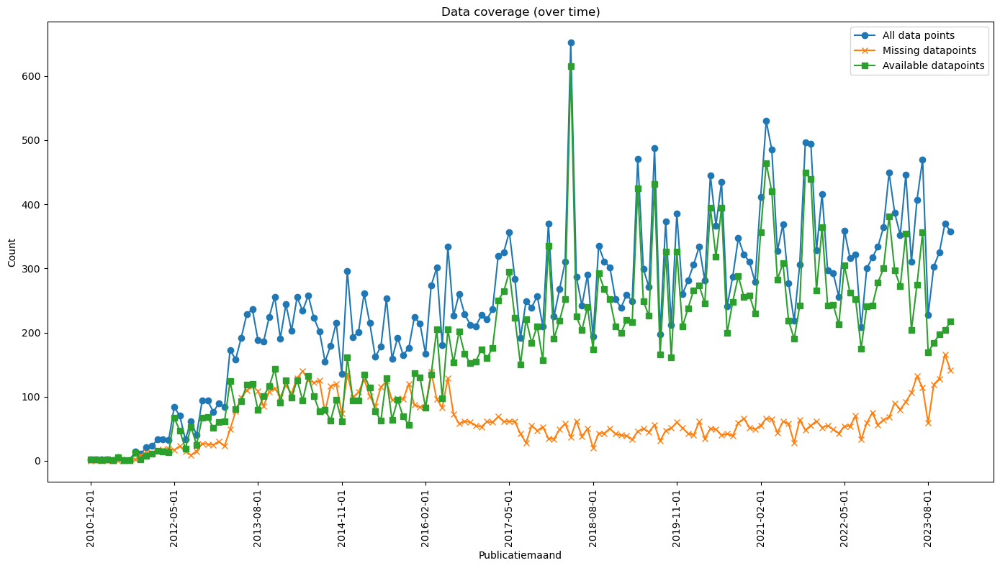

In [346]:
# visualization
plt.figure(figsize=(14, 8))
plt.plot(missing_month['Publicatiemaand'].astype(str), missing_month['All data points'], label='All data points', marker='o')
plt.plot(missing_month['Publicatiemaand'].astype(str), missing_month['Missing datapoints'], label='Missing datapoints', marker='x')
plt.plot(missing_month['Publicatiemaand'].astype(str), missing_month['Available datapoints'], label='Available datapoints', marker='s')
plt.xlabel('Publicatiemaand')
plt.ylabel('Count')
plt.title('Data coverage (over time)')
plt.legend()
plt.xticks(rotation=90)
plt.gca().xaxis.set_major_locator(plt.MaxNLocator(nbins=15))
plt.tight_layout()
plt.show()

In [347]:
missing_month.describe()

,Publicatiemaand,All data points,Available datapoints,Missing datapoints,Missing ratio
count,155,155.000000,155.000000,155.000000,155.000000
mean,2017-06-29 18:06:58.064516096,245.483871,182.387097,63.096774,0.286783
min,2010-12-01 00:00:00,1.000000,1.000000,0.000000,0.000000
25%,2014-04-16 00:00:00,189.500000,93.500000,40.000000,0.156233
50%,2017-07-01 00:00:00,249.000000,184.000000,56.000000,0.218750
75%,2020-09-16 00:00:00,318.000000,252.000000,88.500000,0.459050
max,2023-12-01 00:00:00,652.000000,615.000000,166.000000,0.818182
std,NaN,125.130963,116.762907,37.155827,0.177328


There are a lot of missing data points, but it appears that after a certain time (after 2016) the missing data decreases slowly. 

Average is 182 datapoints, so I want a period of atleast that average. 

In [348]:
mean = missing_month['Available datapoints'].mean() # the mean of 182
stable = missing_month[missing_month['Available datapoints'] >= mean]
stable.head(10)

,Publicatiemaand,All data points,Available datapoints,Missing datapoints,Missing ratio
62,2016-04-01,301,205,96,0.318937
64,2016-06-01,334,205,129,0.386228
66,2016-08-01,260,202,58,0.223077
73,2017-03-01,319,250,69,0.216301
74,2017-04-01,325,264,61,0.187692
75,2017-05-01,357,295,62,0.173669
76,2017-06-01,284,223,61,0.214789
78,2017-08-01,249,221,28,0.112450
79,2017-09-01,239,184,55,0.230126
80,2017-10-01,257,210,47,0.182879


from april 2016 onwards, it seems better, although months are still missing

In [349]:
df_tender = df_tenderned[df_tenderned['Publicatiemaand'] >= '2016-04-01']
df_tender = df_tender.sort_values(by='Publicatiemaand', ascending=True)

print(df_tender['Publicatiemaand'].unique())
# df_tender.to_excel('filtered_TenderNed_data.xlsx', index=False)

<DatetimeArray>
['2016-04-01 00:00:00', '2016-05-01 00:00:00', '2016-06-01 00:00:00',
 '2016-07-01 00:00:00', '2016-08-01 00:00:00', '2016-09-01 00:00:00',
 '2016-10-01 00:00:00', '2016-11-01 00:00:00', '2016-12-01 00:00:00',
 '2017-01-01 00:00:00', '2017-02-01 00:00:00', '2017-03-01 00:00:00',
 '2017-04-01 00:00:00', '2017-05-01 00:00:00', '2017-06-01 00:00:00',
 '2017-07-01 00:00:00', '2017-08-01 00:00:00', '2017-09-01 00:00:00',
 '2017-10-01 00:00:00', '2017-11-01 00:00:00', '2017-12-01 00:00:00',
 '2018-01-01 00:00:00', '2018-02-01 00:00:00', '2018-03-01 00:00:00',
 '2018-04-01 00:00:00', '2018-05-01 00:00:00', '2018-06-01 00:00:00',
 '2018-07-01 00:00:00', '2018-08-01 00:00:00', '2018-09-01 00:00:00',
 '2018-10-01 00:00:00', '2018-11-01 00:00:00', '2018-12-01 00:00:00',
 '2019-01-01 00:00:00', '2019-02-01 00:00:00', '2019-03-01 00:00:00',
 '2019-04-01 00:00:00', '2019-05-01 00:00:00', '2019-06-01 00:00:00',
 '2019-07-01 00:00:00', '2019-08-01 00:00:00', '2019-09-01 00:00:00',
 '20

In [350]:
df_tender.shape

(29473, 63)

In [351]:
nan_count = df_tender['Aantal inschrijvingen'].isna().sum()
total_rows = len(df_tender)
percentage_missing = nan_count / total_rows * 100
print(f"Percentage missing: {percentage_missing:.1f}%")

Percentage missing: 18.9%


In [352]:
nan_count

5568

Much better already, decrease of almost -7%.

## Exploratory Contract duration (years)

Let's check missing data per month

In [353]:
missing = df_tenderned.groupby('Publicatiemaand')['Contract duration (years)'].apply(lambda x: x.isna().sum()) 
total = df_tenderned.groupby('Publicatiemaand').size()
missing_ratio = missing / total
available = total - missing


missing_month = pd.DataFrame({
    'Publicatiemaand': total.index,
    'All data points': total.values,
    'Available datapoints': available.values,
    'Missing datapoints': missing.values,
    'Missing ratio': missing_ratio.values
})

missing_month = missing_month.sort_values(by='Publicatiemaand', ascending=True) # oldest gets on top
missing_month.head()
# missing_month.to_excel(csv_path, index=False)

,Publicatiemaand,All data points,Available datapoints,Missing datapoints,Missing ratio
0,2010-12-01,2,2,0,0.0
1,2011-02-01,2,2,0,0.0
2,2011-03-01,2,2,0,0.0
3,2011-04-01,2,2,0,0.0
4,2011-05-01,1,1,0,0.0


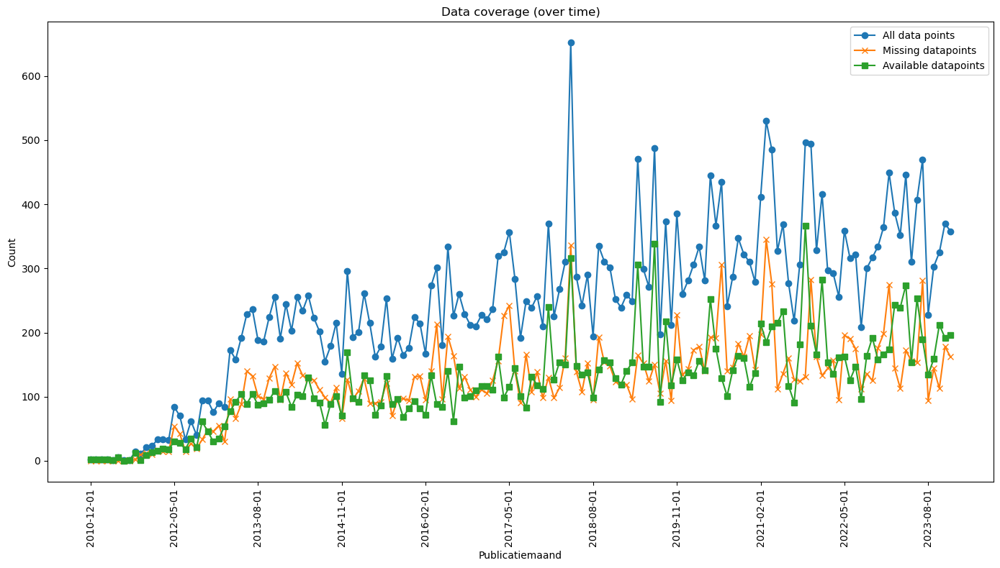

In [354]:
# visualization
plt.figure(figsize=(14, 8))
plt.plot(missing_month['Publicatiemaand'].astype(str), missing_month['All data points'], label='All data points', marker='o')
plt.plot(missing_month['Publicatiemaand'].astype(str), missing_month['Missing datapoints'], label='Missing datapoints', marker='x')
plt.plot(missing_month['Publicatiemaand'].astype(str), missing_month['Available datapoints'], label='Available datapoints', marker='s')
plt.xlabel('Publicatiemaand')
plt.ylabel('Count')
plt.title('Data coverage (over time)')
plt.legend()
plt.xticks(rotation=90)
plt.gca().xaxis.set_major_locator(plt.MaxNLocator(nbins=15))
plt.tight_layout()
plt.show()

In [355]:
missing_month.describe()

,Publicatiemaand,All data points,Available datapoints,Missing datapoints,Missing ratio
count,155,155.000000,155.000000,155.000000,155.000000
mean,2017-06-29 18:06:58.064516096,245.483871,122.174194,123.309677,0.486303
min,2010-12-01 00:00:00,1.000000,0.000000,0.000000,0.000000
25%,2014-04-16 00:00:00,189.500000,87.500000,95.000000,0.438876
50%,2017-07-01 00:00:00,249.000000,118.000000,126.000000,0.503106
75%,2020-09-16 00:00:00,318.000000,156.500000,155.000000,0.565191
max,2023-12-01 00:00:00,652.000000,366.000000,345.000000,1.000000
std,NaN,125.130963,70.257980,66.462720,0.147179


There are a lot of missing data points, but it appears that after a certain time (after 2016) the missing data decreases slowly. 

Average is 182 datapoints, so I want a period of atleast that average. 

In [356]:
mean = missing_month['Available datapoints'].mean() # the mean of 182
stable = missing_month[missing_month['Available datapoints'] >= mean]
stable.head(10)

,Publicatiemaand,All data points,Available datapoints,Missing datapoints,Missing ratio
39,2014-05-01,258,130,128,0.496124
46,2014-12-01,296,169,127,0.429054
49,2015-03-01,261,133,128,0.490421
50,2015-04-01,215,125,90,0.418605
53,2015-07-01,253,132,121,0.478261
61,2016-03-01,273,133,140,0.512821
64,2016-06-01,334,140,194,0.580838
66,2016-08-01,260,147,113,0.434615
73,2017-03-01,319,163,156,0.489028
76,2017-06-01,284,144,140,0.492958


from april 2016 onwards, it seems better, although months are still missing

In [357]:
df_tender.shape

(29473, 63)

In [358]:
nan_count = df_tender['Contract duration (years)'].isna().sum()
total_rows = len(df_tender)
percentage_missing = nan_count / total_rows * 100
print(f"Percentage missing: {percentage_missing:.1f}%")

Percentage missing: 49.5%


In [359]:
nan_count

14591

Much better already, decrease of almost -7%.

## Removal of unnecessary CPV codes

There are multiple CPV codes which have a 100% missing data case. All the CPV-codes where there is missing data > 50%, i will remove from the dataset, as the imputation will cause more bias than good. Codes that have <50% missing data, i will impute with ML.

In [360]:
missing = df_tender.groupby('Hoofd CPV code')['Aantal inschrijvingen'].apply(lambda x: x.isna().sum())
total = df_tender.groupby('Hoofd CPV code').size()
missing_ratio = missing / total
available = total - missing


# Create the DataFrame for 'CPV5'
missing_cpv = pd.DataFrame({
    'Hoofd CPV code': total.index,
    'All data points': total.values,
    'Available datapoints': available.values,
    'Missing datapoints': missing.values,
    'Missing ratio': missing_ratio.values
})

missing_cpv = missing_cpv.sort_values(by='Available datapoints', ascending=True)
missing_cpv
# cpv5_missing_data.to_excel('cpv5_missing_data.xlsx', index=False)

,Hoofd CPV code,All data points,Available datapoints,Missing datapoints,Missing ratio
13,506,4,4,0,0.000000
6,455,7,6,1,0.142857
10,503,59,38,21,0.355932
11,504,99,82,17,0.171717
12,505,207,177,30,0.144928
0,349,205,183,22,0.107317
15,508,289,257,32,0.110727
14,507,462,367,95,0.205628
8,501,462,404,58,0.125541
2,451,610,465,145,0.237705


I need at least 1000 points for per CPV code for the tree based analysis later on, so to not uselessly delete CPV codes with a little amount of data i will group them based on the first to digits (so even more then before wich was based on the first 3 digits)

In [361]:
# df_tender['Hoofd CPV code'] = df_tender['Hoofd CPV code'].astype(str).str[:2]

In [362]:
# Implementing the grouping based on the user's requirement
df_tender['Hoofd CPV code'] = df_tender['Hoofd CPV code'].astype(str)

def group_cpv_custom(cpv_code):
    if cpv_code.startswith('45'):
        if cpv_code.startswith('452') or cpv_code.startswith('450'):
            return cpv_code[:3]
        else:
            return cpv_code[:2]
    else:
        return cpv_code[:2]

df_tender['Hoofd CPV code'] = df_tender['Hoofd CPV code'].apply(group_cpv_custom)

In [363]:
missing = df_tender.groupby('Hoofd CPV code')['Aantal inschrijvingen'].apply(lambda x: x.isna().sum())
total = df_tender.groupby('Hoofd CPV code').size()
missing_ratio = missing / total
available = total - missing


# Create the DataFrame for 'CPV5'
missing_cpv = pd.DataFrame({
    'Hoofd CPV code': total.index,
    'All data points': total.values,
    'Available datapoints': available.values,
    'Missing datapoints': missing.values,
    'Missing ratio': missing_ratio.values
})

missing_cpv = missing_cpv.sort_values(by='Available datapoints', ascending=True)
missing_cpv
# cpv5_missing_data.to_excel('cpv5_missing_data.xlsx', index=False)

,Hoofd CPV code,All data points,Available datapoints,Missing datapoints,Missing ratio
0,34,205,183,22,0.107317
6,90,1257,1129,128,0.101830
1,45,2335,1868,467,0.200000
2,450,3486,2604,882,0.253012
4,50,3679,3046,633,0.172058
5,71,6722,6022,700,0.104136
3,452,11789,9053,2736,0.232081


In [364]:
sufficient_data = missing_cpv[missing_cpv['Available datapoints'] >= 1000]  # only with 93 data points or more, the rest will not be sufficient datapooints
CPV_good = sufficient_data['Hoofd CPV code'].tolist()

# Filter the original dataset to include only the selected CPV5 codes
df_tender = df_tender[df_tender['Hoofd CPV code'].isin(CPV_good)]
df_tender['Hoofd CPV code'].unique()

array(['452', '90', '45', '450', '50', '71'], dtype=object)

Only these are kept, and used for further analysis

## Split the dataset high and low risk

Since there is still some missing data, I will split the dataset in two sets. One with CPV codes with relatively low percentage of missing data (=< 20%), and one with high. This will help later when making error margins, as with one I can say I am highly confident and with the other I am less confident. Rijkswaterstaat agreed with me on this approach.

In [365]:
merged_df = pd.merge(df_tender, missing_cpv[['Hoofd CPV code', 'Missing ratio']], on='Hoofd CPV code', how='left')  # addition of missing ratio column
merged_df.head() # column is added

,Id publicatie,Tenderned kenmerk,Publicatiemaand,Publicatiemaand_kwartaal,Publicatiemaand_jaar,Naam Aanbestedende dienst,Cleaned name AB,Category AD,Nationaal identificatienummer,Naam aanbesteding,...,Hoofdactiviteit,Perceel id,Opdracht,Hoofdgunningscriterium,Datum gunning,Datum gunning_kwartaal,Datum gunning_jaar,Aantal inschrijvingen,Contract duration (years),Missing ratio
0,78309,97545,2016-04-01,2016Q2,2016,provincie Zuid-Holland,Provincie Zuid-Holland,Provincies,471574457,Groot Onderhoud N218A-N493A,...,Algemene overheidsdiensten,NaN,NaN,NaN,NaT,NaT,NaN,NaN,0.750685,0.232081
1,80279,91083,2016-04-01,2016Q2,2016,gemeente Nijmegen,gemeente Nijmegen,Gemeentes,531887432,Asfaltonderhoud bestek 2016 2019,...,Algemene overheidsdiensten,NaN,NaN,NaN,NaT,NaT,NaN,NaN,1.586301,0.232081
2,80255,97900,2016-04-01,2016Q2,2016,Provincie Noord-Holland,Provincie Noord-Holland,Provincies,24460435,Aanbesteding gebiedscontract Gooi en Vechtstreek,...,Algemene overheidsdiensten,NaN,NaN,Beste prijs-kwaliteit verhouding,NaT,NaT,NaN,4.0,NaN,0.232081
3,80201,91062,2016-04-01,2016Q2,2016,Provincie Noord-Brabant,Provincie Noord-Brabant,Provincies,422043498,Life+ Groote Peel 13NAT/NL/079,...,Algemene overheidsdiensten,NaN,NaN,Beste prijs-kwaliteit verhouding,NaT,NaT,NaN,8.0,1.419178,0.232081
4,80195,99236,2016-04-01,2016Q2,2016,Gemeente Den Haag,Gemeente Den Haag,Gemeentes,221909103,Veegwerk Hofstadgebieden,...,Algemene overheidsdiensten,NaN,NaN,Beste prijs-kwaliteit verhouding,NaT,NaT,NaN,NaN,1.915068,0.101830


In [366]:
df_lowrisk = merged_df[merged_df['Missing ratio'] <= 0.2] # the splititng
df_highrisk = merged_df[merged_df['Missing ratio'] > 0.2]

unique_values = df_lowrisk['Missing ratio'].unique() # check
print(unique_values)
print(f"Number of rows: {df_lowrisk.shape[0]}")
df_lowrisk.head()

[0.10182975 0.2        0.17205762 0.10413567]
Number of rows: 13993


,Id publicatie,Tenderned kenmerk,Publicatiemaand,Publicatiemaand_kwartaal,Publicatiemaand_jaar,Naam Aanbestedende dienst,Cleaned name AB,Category AD,Nationaal identificatienummer,Naam aanbesteding,...,Hoofdactiviteit,Perceel id,Opdracht,Hoofdgunningscriterium,Datum gunning,Datum gunning_kwartaal,Datum gunning_jaar,Aantal inschrijvingen,Contract duration (years),Missing ratio
4,80195,99236,2016-04-01,2016Q2,2016,Gemeente Den Haag,Gemeente Den Haag,Gemeentes,221909103,Veegwerk Hofstadgebieden,...,Algemene overheidsdiensten,NaN,NaN,Beste prijs-kwaliteit verhouding,NaT,NaT,NaN,NaN,1.915068,0.101830
5,80191,72027,2016-04-01,2016Q2,2016,Gemeente Den Haag,Gemeente Den Haag,Gemeentes,221909103,Leveren en leggen van vloerbedekking gemeente ...,...,Algemene overheidsdiensten,NaN,NaN,Beste prijs-kwaliteit verhouding,NaT,NaT,NaN,10.0,3.917808,0.200000
18,80424,87149,2016-04-01,2016Q2,2016,Waterschap Vechtstromen,Waterschap Vechtstromen,Waterschappen,331835633,"Renovatie, correctief onderhoud en inspecties ...",...,Algemene overheidsdiensten,39873.0,NaN,Beste prijs-kwaliteit verhouding,NaT,NaT,NaN,16.0,NaN,0.172058
19,80424,87149,2016-04-01,2016Q2,2016,Waterschap Vechtstromen,Waterschap Vechtstromen,Waterschappen,331835633,"Renovatie, correctief onderhoud en inspecties ...",...,Algemene overheidsdiensten,39873.0,NaN,Beste prijs-kwaliteit verhouding,NaT,NaT,NaN,16.0,NaN,0.172058
20,80424,87149,2016-04-01,2016Q2,2016,Waterschap Vechtstromen,Waterschap Vechtstromen,Waterschappen,331835633,"Renovatie, correctief onderhoud en inspecties ...",...,Algemene overheidsdiensten,39873.0,NaN,Beste prijs-kwaliteit verhouding,NaT,NaT,NaN,16.0,NaN,0.172058


In [367]:
unique_values = df_highrisk['Missing ratio'].unique()
print(unique_values)
print(f"Number of rows: {df_highrisk.shape[0]}")
df_highrisk.head()

[0.23208075 0.25301205]
Number of rows: 15275


,Id publicatie,Tenderned kenmerk,Publicatiemaand,Publicatiemaand_kwartaal,Publicatiemaand_jaar,Naam Aanbestedende dienst,Cleaned name AB,Category AD,Nationaal identificatienummer,Naam aanbesteding,...,Hoofdactiviteit,Perceel id,Opdracht,Hoofdgunningscriterium,Datum gunning,Datum gunning_kwartaal,Datum gunning_jaar,Aantal inschrijvingen,Contract duration (years),Missing ratio
0,78309,97545,2016-04-01,2016Q2,2016,provincie Zuid-Holland,Provincie Zuid-Holland,Provincies,471574457,Groot Onderhoud N218A-N493A,...,Algemene overheidsdiensten,NaN,NaN,NaN,NaT,NaT,NaN,NaN,0.750685,0.232081
1,80279,91083,2016-04-01,2016Q2,2016,gemeente Nijmegen,gemeente Nijmegen,Gemeentes,531887432,Asfaltonderhoud bestek 2016 2019,...,Algemene overheidsdiensten,NaN,NaN,NaN,NaT,NaT,NaN,NaN,1.586301,0.232081
2,80255,97900,2016-04-01,2016Q2,2016,Provincie Noord-Holland,Provincie Noord-Holland,Provincies,24460435,Aanbesteding gebiedscontract Gooi en Vechtstreek,...,Algemene overheidsdiensten,NaN,NaN,Beste prijs-kwaliteit verhouding,NaT,NaT,NaN,4.0,NaN,0.232081
3,80201,91062,2016-04-01,2016Q2,2016,Provincie Noord-Brabant,Provincie Noord-Brabant,Provincies,422043498,Life+ Groote Peel 13NAT/NL/079,...,Algemene overheidsdiensten,NaN,NaN,Beste prijs-kwaliteit verhouding,NaT,NaT,NaN,8.0,1.419178,0.232081
6,80305,100525,2016-04-01,2016Q2,2016,Gemeente Renkum,Gemeente Renkum,Gemeentes,121650034,Engineering & Build MFC 3b4 te Renkum,...,Algemene overheidsdiensten,NaN,NaN,NaN,NaT,NaT,NaN,NaN,NaN,0.232081


Everything seems to have went well.

In [368]:
nan_count = df_lowrisk['Contract duration (years)'].isna().sum()
total_rows = len(df_lowrisk)
percentage_missing = nan_count / total_rows * 100
print(f"Percentage missing lowrisk: {percentage_missing:.1f}%")

Percentage missing lowrisk: 55.8%


The percentage of missing data in the low risk is higher then 20% but still usable

In [369]:
nan_count = df_highrisk['Contract duration (years)'].isna().sum()
total_rows = len(df_highrisk)
percentage_missing = nan_count / total_rows * 100
print(f"Percentage missing High risk: {percentage_missing:.1f}%")

Percentage missing High risk: 43.7%


The percentage of missing data in the high risk data set is to high (higher then 50%) so unusable

# Impute missing data (lowrisk)

I want to impute the missing data, based on a ML model. That is what I am going to do here.

In [375]:
# df_lowrisk.to_csv('df_lowrisk.csv', index=False )

In [376]:
print(df_lowrisk.columns)

Index(['Id publicatie', 'Tenderned kenmerk', 'Publicatiemaand',
       'Publicatiemaand_kwartaal', 'Publicatiemaand_jaar',
       'Naam Aanbestedende dienst', 'Cleaned name AB', 'Category AD',
       'Nationaal identificatienummer', 'Naam aanbesteding', 'URL TenderNed',
       'Geimporteerd', 'Tsender', 'Aanbesteding id',
       'Sluitingsdatum aanmelding', 'Sluitingsdatum aanmelding_kwartaal',
       'Sluitingsdatum aanmelding_jaar', 'Sluitingsdatum aanbesteding',
       'Sluitingsdatum aanbesteding_kwartaal',
       'Sluitingsdatum aanbesteding_jaar', 'Aanvang opdracht',
       'Aanvang opdracht_kwartaal', 'Aanvang opdracht_jaar',
       'Voltooiing opdracht', 'Voltooiing opdracht_kwartaal',
       'Voltooiing opdracht_jaar', 'Termijn verkrijgen documenten',
       'Termijn verkrijgen documenten_kwartaal',
       'Termijn verkrijgen documenten_jaar', 'Verzending uitnodigingen',
       'Verzending uitnodigingen_kwartaal', 'Verzending uitnodigingen_jaar',
       'Tegen betaling documen

In [377]:
nominal_columns = [
    'Publicatiemaand', 'Publicatiemaand_kwartaal', 
    'Sluitingsdatum aanbesteding_kwartaal', 'Aanvang opdracht_kwartaal', 
    'Voltooiing opdracht_kwartaal', 'Termijn verkrijgen documenten_kwartaal', 
    'Cleaned name AB', 'Category AD', 'Sluitingsdatum aanbesteding', 
    'Aanvang opdracht', 'Voltooiing opdracht', 'Termijn verkrijgen documenten', 
    'Verzending uitnodigingen', 'Tegen betaling documenten verkrijgen', 
    'Personen aanwezig opening kluis', 'Nationaal of Europees', 
    'Publicatie soort', 'Juridisch kader', 'Type opdracht', 
    'Procedure', 'Hoofd CPV code', 'Opdracht categorie', 
    'Nutscode', 'Aard van de opdracht', 'GPA', 'Hoofdactiviteit', 
    'Hoofdgunningscriterium', 'Contract duration (years)', 'Aantal inschrijvingen'
]

Here are all the columns I want to use for the ML model. 

### Type of missing data

#### Lowrisk

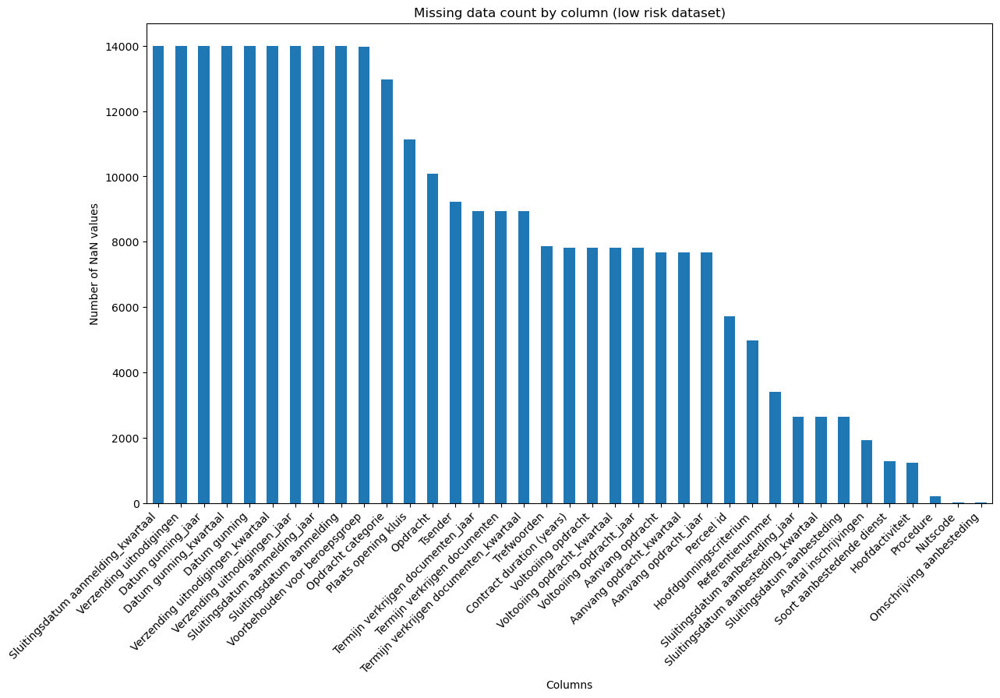

In [378]:
missing_data_summary = df_lowrisk.isnull().sum().sort_values(ascending=False)
missing_data_percentage = (df_lowrisk.isnull().sum() / len(df_lowrisk)) * 100
missing_data_summary = missing_data_summary[missing_data_summary > 0]

plt.figure(figsize=(14, 8))
missing_data_summary.plot(kind='bar')
plt.title('Missing data count by column (low risk dataset)')
plt.xlabel('Columns')
plt.ylabel('Number of NaN values')
plt.xticks(rotation=45, ha='right')  # Rotate column names for better readability
plt.show()

##### Aantal inschrijvingen

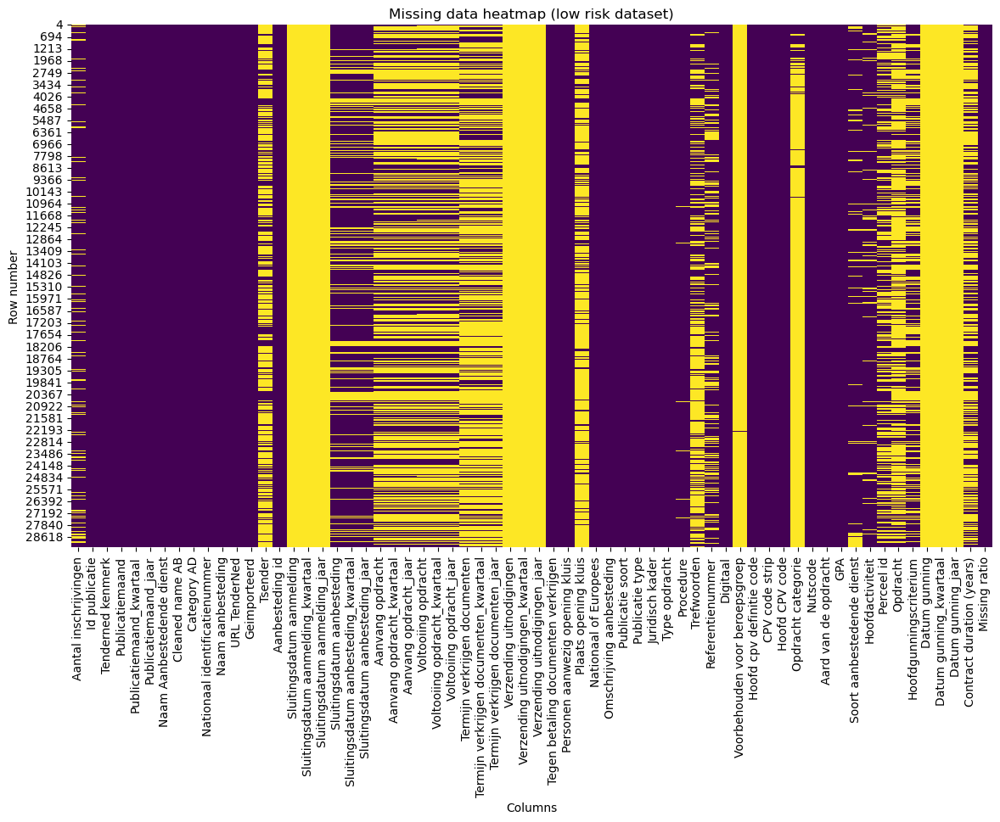

In [379]:
focus_columns = ['Aantal inschrijvingen'] + [col for col in df_lowrisk.columns if col != 'Aantal inschrijvingen']
df_focus = df_lowrisk[focus_columns]

plt.figure(figsize=(14, 8))
sns.heatmap(df_focus.isnull(), cbar=False, cmap='viridis')
plt.title('Missing data heatmap (low risk dataset)')
plt.xlabel('Columns')
plt.ylabel('Row number')
plt.show()

In [380]:
missing_aantal_inschrijvingen = df_focus['Aantal inschrijvingen'].isnull()
correlation_with_missing = df_focus.isnull().corrwith(missing_aantal_inschrijvingen) # correlation calculation

# Sort and display the correlation results
correlation_with_missing_sorted = correlation_with_missing.sort_values(ascending=False) #highest on top
correlation_with_missing_sorted = correlation_with_missing_sorted[correlation_with_missing_sorted > 0 ]
correlation_with_missing_sorted

/opt/anaconda3/envs/environment/lib/python3.11/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/opt/anaconda3/envs/environment/lib/python3.11/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Aantal inschrijvingen                     1.000000
Perceel id                                0.481252
Opdracht                                  0.248889
Plaats opening kluis                      0.184897
Procedure                                 0.169340
Hoofdgunningscriterium                    0.126146
Sluitingsdatum aanbesteding_kwartaal      0.102234
Sluitingsdatum aanbesteding               0.102234
Sluitingsdatum aanbesteding_jaar          0.102234
Termijn verkrijgen documenten             0.100151
Termijn verkrijgen documenten_kwartaal    0.100151
Termijn verkrijgen documenten_jaar        0.100151
Soort aanbestedende dienst                0.089248
Referentienummer                          0.087267
Aanvang opdracht_kwartaal                 0.080120
Aanvang opdracht_jaar                     0.080120
Aanvang opdracht                          0.080120
Contract duration (years)                 0.078649
Voltooiing opdracht_jaar                  0.076481
Voltooiing opdracht            

##### Contract duration (years) 

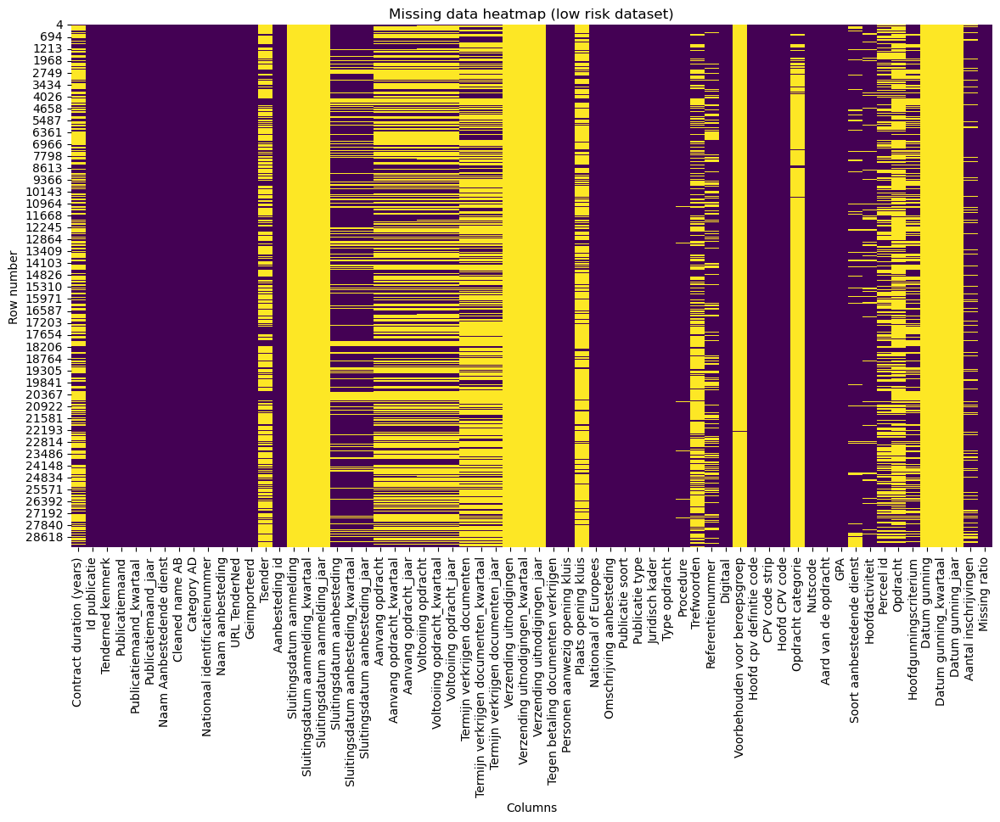

In [381]:
focus_columns = ['Contract duration (years)'] + [col for col in df_lowrisk.columns if col != 'Contract duration (years)']
df_focus = df_lowrisk[focus_columns]

plt.figure(figsize=(14, 8))
sns.heatmap(df_focus.isnull(), cbar=False, cmap='viridis')
plt.title('Missing data heatmap (low risk dataset)')
plt.xlabel('Columns')
plt.ylabel('Row number')
plt.show()

In [382]:
missing_contract_duration = df_focus['Contract duration (years)'].isnull()
correlation_with_missing = df_focus.isnull().corrwith(missing_contract_duration) # correlation calculation

# Sort and display the correlation results
correlation_with_missing_sorted = correlation_with_missing.sort_values(ascending=False) #highest on top
correlation_with_missing_sorted = correlation_with_missing_sorted[correlation_with_missing_sorted > 0 ]
correlation_with_missing_sorted

/opt/anaconda3/envs/environment/lib/python3.11/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/opt/anaconda3/envs/environment/lib/python3.11/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Contract duration (years)                 1.000000
Voltooiing opdracht                       0.999131
Voltooiing opdracht_jaar                  0.999131
Voltooiing opdracht_kwartaal              0.999131
Aanvang opdracht                          0.981377
Aanvang opdracht_kwartaal                 0.981377
Aanvang opdracht_jaar                     0.981377
Hoofdgunningscriterium                    0.404560
Sluitingsdatum aanbesteding_jaar          0.392080
Sluitingsdatum aanbesteding_kwartaal      0.392080
Sluitingsdatum aanbesteding               0.392080
Termijn verkrijgen documenten             0.200184
Termijn verkrijgen documenten_kwartaal    0.200184
Termijn verkrijgen documenten_jaar        0.200184
Trefwoorden                               0.196779
Opdracht                                  0.195616
Procedure                                 0.105760
Referentienummer                          0.088508
Aantal inschrijvingen                     0.078649
Opdracht categorie             

#### High risk

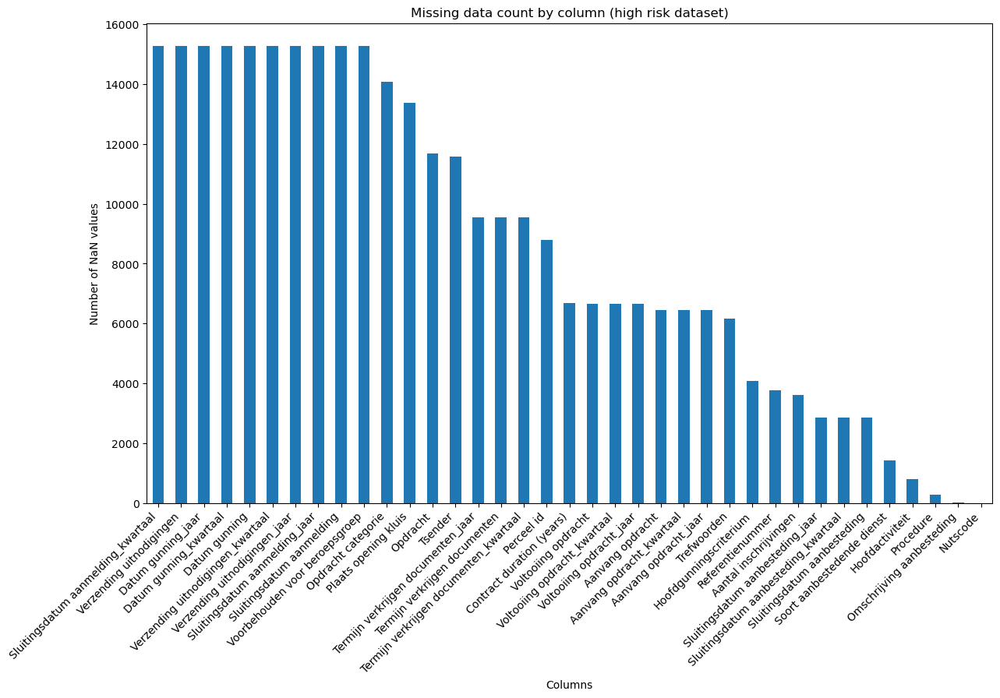

In [383]:
missing_data_summary = df_highrisk.isnull().sum().sort_values(ascending=False)
missing_data_percentage = (df_highrisk.isnull().sum() / len(df_highrisk)) * 100
missing_data_summary = missing_data_summary[missing_data_summary > 0]

plt.figure(figsize=(14, 8))
missing_data_summary.plot(kind='bar')
plt.title('Missing data count by column (high risk dataset)')
plt.xlabel('Columns')
plt.ylabel('Number of NaN values')
plt.xticks(rotation=45, ha='right')  # Rotate column names for better readability
plt.show()

##### Aantal inschrijvingen

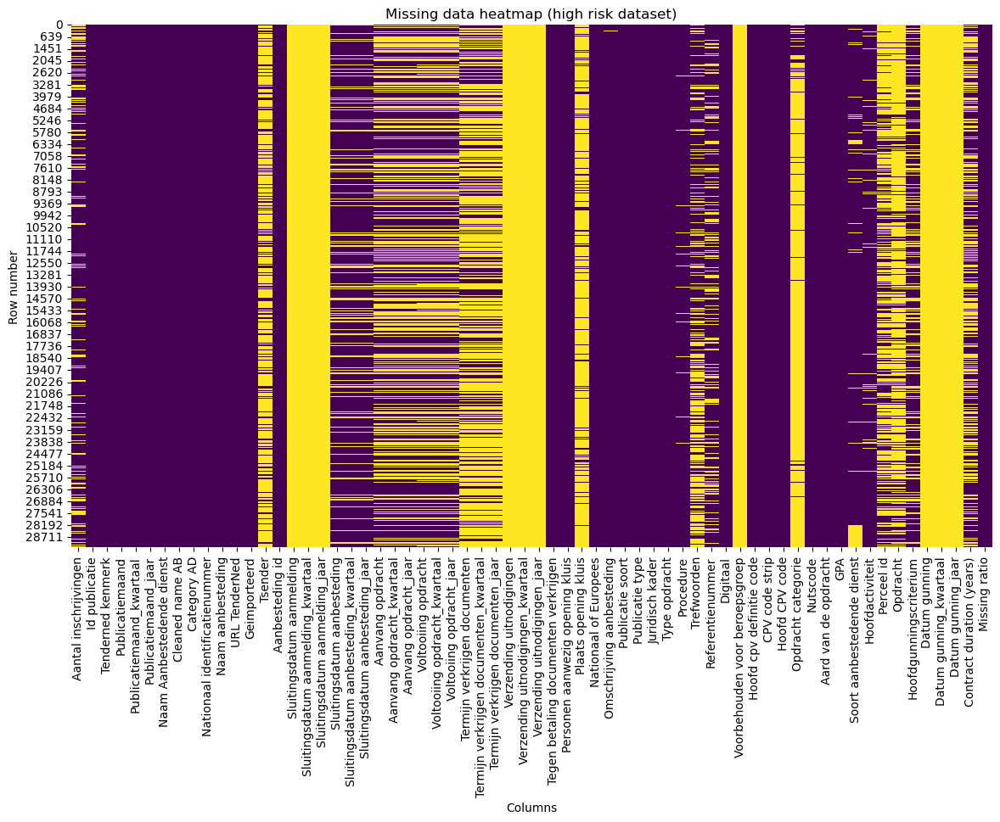

In [384]:
focus_columns = ['Aantal inschrijvingen'] + [col for col in df_lowrisk.columns if col != 'Aantal inschrijvingen']
df_focus = df_highrisk[focus_columns]

plt.figure(figsize=(14, 8))
sns.heatmap(df_focus.isnull(), cbar=False, cmap='viridis')
plt.title('Missing data heatmap (high risk dataset)')
plt.xlabel('Columns')
plt.ylabel('Row number')
plt.show()

In [385]:
missing_aantal_inschrijvingen = df_focus['Aantal inschrijvingen'].isnull()
correlation_with_missing = df_focus.isnull().corrwith(missing_aantal_inschrijvingen) # correlation calculation

# Sort and display the correlation results
correlation_with_missing_sorted = correlation_with_missing.sort_values(ascending=False) #highest on top
correlation_with_missing_sorted = correlation_with_missing_sorted[correlation_with_missing_sorted > 0 ]
correlation_with_missing_sorted

/opt/anaconda3/envs/environment/lib/python3.11/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/opt/anaconda3/envs/environment/lib/python3.11/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Aantal inschrijvingen                     1.000000
Perceel id                                0.478906
Opdracht                                  0.308235
Hoofdgunningscriterium                    0.220168
Sluitingsdatum aanbesteding               0.168131
Sluitingsdatum aanbesteding_kwartaal      0.168131
Sluitingsdatum aanbesteding_jaar          0.168131
Plaats opening kluis                      0.155400
Trefwoorden                               0.151442
Contract duration (years)                 0.139698
Procedure                                 0.139636
Voltooiing opdracht_kwartaal              0.134218
Voltooiing opdracht                       0.134218
Voltooiing opdracht_jaar                  0.134218
Aanvang opdracht_jaar                     0.132591
Aanvang opdracht_kwartaal                 0.132591
Aanvang opdracht                          0.132591
Termijn verkrijgen documenten_jaar        0.079718
Termijn verkrijgen documenten_kwartaal    0.079718
Termijn verkrijgen documenten  

##### Contract duration (years)

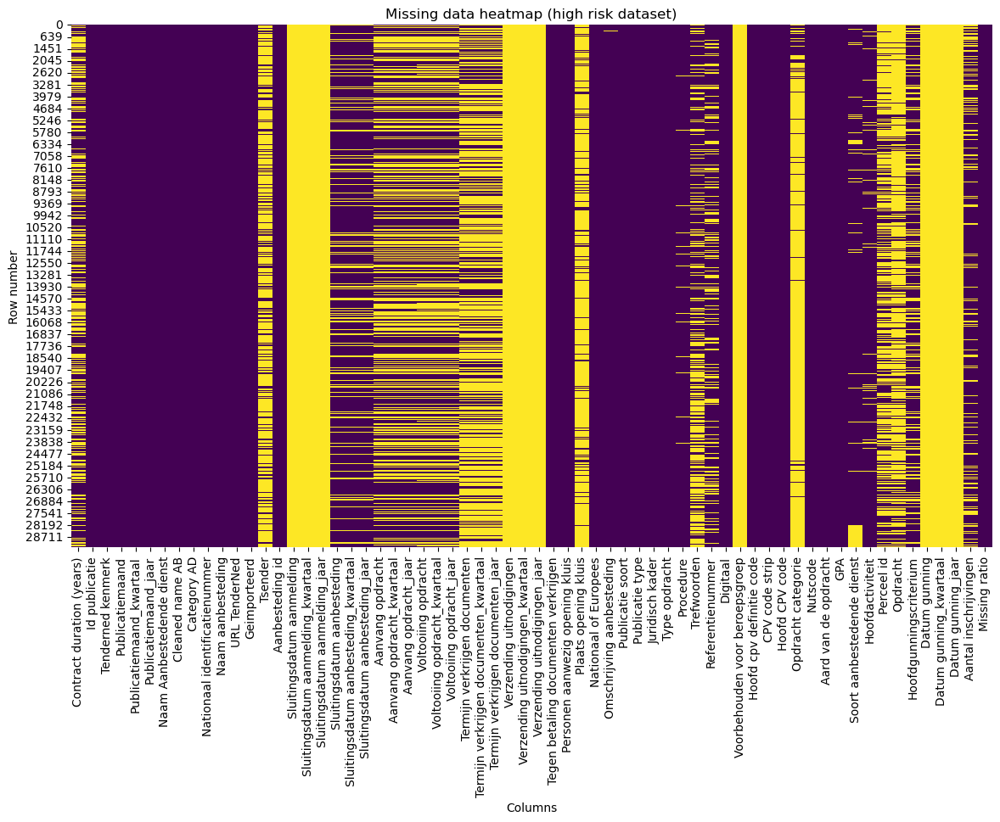

In [386]:
focus_columns = ['Contract duration (years)'] + [col for col in df_lowrisk.columns if col != 'Contract duration (years)']
df_focus = df_highrisk[focus_columns]

plt.figure(figsize=(14, 8))
sns.heatmap(df_focus.isnull(), cbar=False, cmap='viridis')
plt.title('Missing data heatmap (high risk dataset)')
plt.xlabel('Columns')
plt.ylabel('Row number')
plt.show()

In [387]:
missing_aantal_inschrijvingen = df_focus['Contract duration (years)'].isnull()
correlation_with_missing = df_focus.isnull().corrwith(missing_aantal_inschrijvingen) # correlation calculation

# Sort and display the correlation results
correlation_with_missing_sorted = correlation_with_missing.sort_values(ascending=False) #highest on top
correlation_with_missing_sorted = correlation_with_missing_sorted[correlation_with_missing_sorted > 0 ]
correlation_with_missing_sorted

/opt/anaconda3/envs/environment/lib/python3.11/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/opt/anaconda3/envs/environment/lib/python3.11/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Contract duration (years)                 1.000000
Voltooiing opdracht                       0.996546
Voltooiing opdracht_kwartaal              0.996546
Voltooiing opdracht_jaar                  0.996546
Aanvang opdracht                          0.970915
Aanvang opdracht_kwartaal                 0.970915
Aanvang opdracht_jaar                     0.970915
Sluitingsdatum aanbesteding               0.419611
Sluitingsdatum aanbesteding_kwartaal      0.419611
Sluitingsdatum aanbesteding_jaar          0.419611
Hoofdgunningscriterium                    0.320472
Opdracht                                  0.218512
Termijn verkrijgen documenten             0.191160
Termijn verkrijgen documenten_kwartaal    0.191160
Termijn verkrijgen documenten_jaar        0.191160
Procedure                                 0.146887
Aantal inschrijvingen                     0.139698
Trefwoorden                               0.117796
Hoofdactiviteit                           0.082156
Nutscode                       

## Impute missing data (Low risk)

#### Remove outliers (Aantal inschrijvingen)

In [388]:
Q1 = df_lowrisk['Aantal inschrijvingen'].quantile(0.25)
Q3 = df_lowrisk['Aantal inschrijvingen'].quantile(0.75)
IQR = Q3 - Q1

# bounds
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Replace outliers with NaN
df_lowrisk['Aantal inschrijvingen'] = df_lowrisk['Aantal inschrijvingen'].apply(
    lambda x: x if lower_bound <= x <= upper_bound else np.nan
)

print(df_lowrisk['Aantal inschrijvingen'].describe())

count    10578.000000
mean         6.050577
std          4.753247
min          1.000000
25%          3.000000
50%          5.000000
75%          8.000000
max         23.000000
Name: Aantal inschrijvingen, dtype: float64


/var/folders/4w/2tspj8b910d0wfksxgqd4km80000gn/T/ipykernel_27675/1186319283.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_lowrisk['Aantal inschrijvingen'] = df_lowrisk['Aantal inschrijvingen'].apply(


#### Remove outliers (Contract duration)

In [389]:
Q1 = df_lowrisk['Contract duration (years)'].quantile(0.25)
Q3 = df_lowrisk['Contract duration (years)'].quantile(0.75)
IQR = Q3 - Q1

# bounds
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Replace outliers with NaN
df_lowrisk['Contract duration (years)'] = df_lowrisk['Contract duration (years)'].apply(
    lambda x: x if lower_bound <= x <= upper_bound else np.nan
)

print(df_lowrisk['Contract duration (years)'].describe())

count    6018.000000
mean        2.478924
std         1.376772
min         0.000000
25%         1.753425
50%         2.000000
75%         3.671233
max         7.005479
Name: Contract duration (years), dtype: float64


/var/folders/4w/2tspj8b910d0wfksxgqd4km80000gn/T/ipykernel_27675/4015266141.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_lowrisk['Contract duration (years)'] = df_lowrisk['Contract duration (years)'].apply(


#### Continue (aantal inschrijvingen)

In [390]:
df = df_lowrisk.loc[:, nominal_columns]

df['Aantal inschrijvingen'] = df_lowrisk['Aantal inschrijvingen']



In [391]:
data_types = df.dtypes
grouped_by_dtype = {dtype: list(data_types[data_types == dtype].index) for dtype in data_types.unique()} # useful to know what datatypes, for the ML model later

for dtype, columns in grouped_by_dtype.items():
    print(f"{dtype}: {columns}")

datetime64[ns]: ['Publicatiemaand', 'Sluitingsdatum aanbesteding', 'Aanvang opdracht', 'Voltooiing opdracht', 'Termijn verkrijgen documenten', 'Verzending uitnodigingen']
period[Q-DEC]: ['Publicatiemaand_kwartaal', 'Sluitingsdatum aanbesteding_kwartaal', 'Aanvang opdracht_kwartaal', 'Voltooiing opdracht_kwartaal', 'Termijn verkrijgen documenten_kwartaal']
object: ['Cleaned name AB', 'Category AD', 'Tegen betaling documenten verkrijgen', 'Personen aanwezig opening kluis', 'Nationaal of Europees', 'Publicatie soort', 'Juridisch kader', 'Type opdracht', 'Procedure', 'Hoofd CPV code', 'Opdracht categorie', 'Nutscode', 'Aard van de opdracht', 'GPA', 'Hoofdactiviteit', 'Hoofdgunningscriterium']
float64: ['Contract duration (years)', 'Aantal inschrijvingen']


Because we have many different data types, we need to make them numerical as this helps for ML model.

In [392]:
datetime_cols = [
    'Publicatiemaand', 'Sluitingsdatum aanbesteding', 
    'Aanvang opdracht', 'Voltooiing opdracht', 
    'Termijn verkrijgen documenten'
]

for col in datetime_cols:
    df[col] = pd.to_datetime(df[col], format='%m-%Y', errors='coerce')
    df[col + '_year'] = df[col].dt.year
    df[col + '_month'] = df[col].dt.month
    df.drop(columns=col, inplace=True)

period_cols = [
    'Publicatiemaand_kwartaal', 'Sluitingsdatum aanbesteding_kwartaal', 
    'Aanvang opdracht_kwartaal', 'Voltooiing opdracht_kwartaal', 
    'Termijn verkrijgen documenten_kwartaal'
]
placeholder_period = '1900Q1'

for col in period_cols:
    df[col] = df[col].fillna(placeholder_period).astype(str)
    df[col + '_year'] = df[col].str[:4].astype(int)
    df[col + '_quarter'] = df[col].str[5:].astype(int)
    df.drop(columns=col, inplace=True)

categorical_cols = [
    'Cleaned name AB', 'Category AD', 'Verzending uitnodigingen', 
    'Tegen betaling documenten verkrijgen', 'Personen aanwezig opening kluis', 
    'Nationaal of Europees', 'Publicatie soort', 'Juridisch kader', 
    'Type opdracht', 'Procedure', 'Opdracht categorie', 
    'Nutscode', 'Aard van de opdracht', 'GPA', 'Hoofdactiviteit', 
    'Hoofdgunningscriterium', 'Hoofd CPV code'
]

# One-hot encode 
encoder = OneHotEncoder(sparse_output=False, handle_unknown='ignore')
encoded_features = encoder.fit_transform(df[categorical_cols])
encoded_df = pd.DataFrame(encoded_features, columns=encoder.get_feature_names_out(categorical_cols)) # one hot encoding

df.drop(columns=categorical_cols, inplace=True)
df = pd.concat([df.reset_index(drop=True), encoded_df.reset_index(drop=True)], axis=1)

In [393]:
# check if the transition was succesful
data_types = df.dtypes
grouped_by_dtype = {dtype: list(data_types[data_types == dtype].index) for dtype in data_types.unique()}

# display the grouped columns by data type
for dtype, columns in grouped_by_dtype.items():
    print(f"{dtype}: {columns}")

float64: ['Contract duration (years)', 'Aantal inschrijvingen', 'Sluitingsdatum aanbesteding_year', 'Sluitingsdatum aanbesteding_month', 'Aanvang opdracht_year', 'Aanvang opdracht_month', 'Voltooiing opdracht_year', 'Voltooiing opdracht_month', 'Termijn verkrijgen documenten_year', 'Termijn verkrijgen documenten_month', 'Cleaned name AB_ABG-organisatie', 'Cleaned name AB_Avri', 'Cleaned name AB_BAR-gemeente', 'Cleaned name AB_Bizob', 'Cleaned name AB_Blink GRR', 'Cleaned name AB_GAD Regio Gooi en Vechtstreek', 'Cleaned name AB_GEM Bloemendalerpolder C.V.', 'Cleaned name AB_Gemeenschappelijke Regeling Nieuw Reijerwaard', 'Cleaned name AB_Gemeenschappelijke Regeling Omgevingsdienst Midden- en West-Brabant', 'Cleaned name AB_Gemeenschappelijke Regeling Omgevingsdienst Regio Utrecht', 'Cleaned name AB_Gemeenschappelijke regeling Veiligheidsregio Brabant-Noord, onderdeel Brandweer', 'Cleaned name AB_Gemeente Aa en Hunze', 'Cleaned name AB_Gemeente Aalsmeer', 'Cleaned name AB_Gemeente Alkmaa

Now we are going to impute the data. The model I chose is the gradient booster, because it can take both categorical and numerical data, but mainly because it can handle missing data. Some of the features also have missing data.

In [394]:
print(df_lowrisk['Aantal inschrijvingen'].describe()) # situation beforehand, outlier of 136

count    10578.000000
mean         6.050577
std          4.753247
min          1.000000
25%          3.000000
50%          5.000000
75%          8.000000
max         23.000000
Name: Aantal inschrijvingen, dtype: float64


In [395]:
print(df_lowrisk['Contract duration (years)'].describe())

count    6018.000000
mean        2.478924
std         1.376772
min         0.000000
25%         1.753425
50%         2.000000
75%         3.671233
max         7.005479
Name: Contract duration (years), dtype: float64


## Imputate aantal inschrijvingen

In [396]:
target_column = 'Aantal inschrijvingen'
df_imputed = df.copy()
df_lowrisk_imputed = df.copy()

df_imputed = df_imputed.dropna(subset=[target_column]) # skips rows where the target column is missing

#### Feature importance

Since we did one-hot encoding, the df_imputed has many columns and therefore also many many features to take into account. However, taking them all into account makes the model too complex (curse of dimensionality).

In [397]:
df_imputed.shape # 993 features, pfew

(10578, 789)

In [398]:
X_train, X_test, y_train, y_test = train_test_split(df_imputed.drop(columns=[target_column]), df_imputed[target_column], test_size=0.2, random_state=42) #first train the model on the whole dataset
hgb_imputer = HistGradientBoostingRegressor(random_state=42)
hgb_imputer.fit(X_train, y_train)

HistGradientBoostingRegressor(random_state=42)

In [399]:
feature_names = X_train.columns 
n_repeats = 10

def calculate_permutation_importance(model, X, y, n_repeats, random_state=42):
    print("Starting calculation")
    
    start_time = time.time()
    importances = np.zeros((n_repeats, X.shape[1]))
    
    for i in tqdm(range(n_repeats), desc="Repeats"):
        result = permutation_importance(model, X, y, n_repeats=1, random_state=random_state + i, n_jobs=-1)
        importances[i, :] = result.importances[:, 0]
        print(f"Round {i+1}/{n_repeats} done")
    
    end_time = time.time()
    elapsed_time = end_time - start_time
    print(f"Total time taken: {elapsed_time:.2f} seconds")
    
    mean_importances = importances.mean(axis=0)
    return mean_importances

In [400]:
importances = calculate_permutation_importance(hgb_imputer, X_train, y_train, n_repeats) # actual function

Starting calculation


Repeats:  10%|█         | 1/10 [00:19<02:58, 19.83s/it]

Round 1/10 done


Repeats:  20%|██        | 2/10 [00:33<02:11, 16.49s/it]

Round 2/10 done


Repeats:  30%|███       | 3/10 [00:49<01:50, 15.83s/it]

Round 3/10 done


Repeats:  40%|████      | 4/10 [01:03<01:31, 15.21s/it]

Round 4/10 done


Repeats:  50%|█████     | 5/10 [01:17<01:13, 14.76s/it]

Round 5/10 done


Repeats:  60%|██████    | 6/10 [01:31<00:57, 14.47s/it]

Round 6/10 done


Repeats:  70%|███████   | 7/10 [01:45<00:43, 14.55s/it]

Round 7/10 done


Repeats:  80%|████████  | 8/10 [02:00<00:28, 14.42s/it]

Round 8/10 done


Repeats:  90%|█████████ | 9/10 [02:14<00:14, 14.29s/it]

Round 9/10 done


Repeats: 100%|██████████| 10/10 [02:28<00:00, 14.90s/it]

Round 10/10 done
Total time taken: 148.98 seconds


Feature: Hoofd CPV code_71, Importance: 0.3449323734776376
Feature: Publicatiemaand_year, Importance: 0.13044327383944024
Feature: Sluitingsdatum aanbesteding_month, Importance: 0.09003618810479995
Feature: Contract duration (years), Importance: 0.08728320823638132
Feature: Procedure_Openbaar, Importance: 0.0653926732324064
Feature: Cleaned name AB_Gemeente Assen, Importance: 0.05380839564941359
Feature: Sluitingsdatum aanbesteding_year, Importance: 0.04886632280833114
Feature: Aard van de opdracht_Raamovereenkomst, Importance: 0.047445491433168493
Feature: Termijn verkrijgen documenten_month, Importance: 0.041093749049163575
Feature: Cleaned name AB_Waterschap Brabantse Delta, Importance: 0.0336284017240291
Feature: Aanvang opdracht_year, Importance: 0.025586347680018228
Feature: Category AD_Waterschappen, Importance: 0.02553153011557594
Feature: Voltooiing opdracht_month, Importance: 0.021800086829296027
Feature: Cleaned name AB_Rijkswaterstaat Grote Projecten en Onderhoud, Importanc

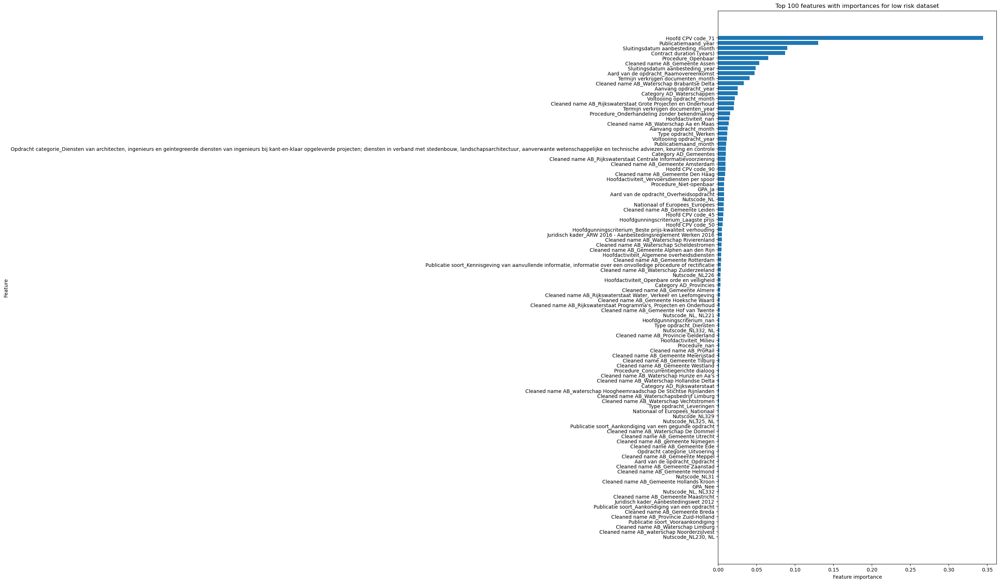

In [401]:
top_100_indices = np.argsort(importances)[::-1][:100] #take top 100

for i in top_100_indices:
    print(f"Feature: {feature_names[i]}, Importance: {importances[i]}")

top_100_features = [feature_names[i] for i in top_100_indices]
top_100_importances = [importances[i] for i in top_100_indices]

# plot top 100 
plt.figure(figsize=(10, 20))
plt.barh(top_100_features, top_100_importances)
plt.xlabel("Feature importance")
plt.ylabel("Feature")
plt.title("Top 100 features with importances for low risk dataset")
plt.gca().invert_yaxis()
plt.show()

After we need to check how much features we will take into account. We can do this by doing K-fold validation and checking which amount of features gives a good result.

In [402]:
top_feature_counts = list(range(5, 140, 10)) 
best_result = {'num_features': 0, 'avg_mse': float('inf'), 'avg_mae': float('inf'), 'avg_rmse': float('inf'), 'avg_r2': float('-inf')}
results = []

In [403]:
for top_n in top_feature_counts: # so it looks for different numbers
    top_indices = np.argsort(importances)[-top_n:][::-1]
    top_features = feature_names[top_indices]
    
    df_imputed_top_n = df_imputed[top_features.tolist() + [target_column]]
    
    kf = KFold(n_splits=10, shuffle=True, random_state=42)
    imputation_errors = []
    
    for train_index, test_index in kf.split(df_imputed_top_n):
        X_train, X_test = df_imputed_top_n.iloc[train_index].drop(columns=[target_column]), df_imputed_top_n.iloc[test_index].drop(columns=[target_column])
        y_train, y_test = df_imputed_top_n.iloc[train_index][target_column], df_imputed_top_n.iloc[test_index][target_column]
        
        hgb_imputer = HistGradientBoostingRegressor(random_state=42)
        hgb_imputer.fit(X_train, y_train)
        
        y_pred = hgb_imputer.predict(X_test)
        y_pred = np.maximum(y_pred, 0)
        
        mse = mean_squared_error(y_test, y_pred)
        mae = mean_absolute_error(y_test, y_pred)
        rmse = np.sqrt(mse)
        r2 = r2_score(y_test, y_pred)
        
        imputation_errors.append({'MSE': mse, 'MAE': mae, 'RMSE': rmse, 'R²': r2})
    
    # average calculation after the 10 fold
    avg_mse = np.mean([error['MSE'] for error in imputation_errors])
    avg_mae = np.mean([error['MAE'] for error in imputation_errors])
    avg_rmse = np.mean([error['RMSE'] for error in imputation_errors])
    avg_r2 = np.mean([error['R²'] for error in imputation_errors])
    
    print(f"Top {top_n} features gives: - Average MSE: {avg_mse}, Average MAE: {avg_mae}, Average RMSE: {avg_rmse}, Average R²: {avg_r2}")
    
    results.append({'num_features': top_n, 'avg_mse': avg_mse, 'avg_mae': avg_mae, 'avg_rmse': avg_rmse, 'avg_r2': avg_r2})
    
    if avg_mse < best_result['avg_mse']:
        best_result = {'num_features': top_n, 'avg_mse': avg_mse, 'avg_mae': avg_mae, 'avg_rmse': avg_rmse, 'avg_r2': avg_r2}

print(f"Best result: Top {best_result['num_features']} Features - Average MSE: {best_result['avg_mse']}, Average MAE: {best_result['avg_mae']}, Average RMSE: {best_result['avg_rmse']}, Average R²: {best_result['avg_r2']}")

Top 5 features gives: - Average MSE: 10.472342976262734, Average MAE: 2.266211411465934, Average RMSE: 3.234520796701715, Average R²: 0.5352049285222051
Top 15 features gives: - Average MSE: 8.062809050451738, Average MAE: 1.9831539248782897, Average RMSE: 2.837579385945454, Average R²: 0.6418370744969971
Top 25 features gives: - Average MSE: 7.179628049653234, Average MAE: 1.8646713281950906, Average RMSE: 2.677661737265219, Average R²: 0.6812528288325479
Top 35 features gives: - Average MSE: 6.834211562164933, Average MAE: 1.8180980658763957, Average RMSE: 2.612701628607668, Average R²: 0.6967797630755209
Top 45 features gives: - Average MSE: 6.678654532709347, Average MAE: 1.7930201451827918, Average RMSE: 2.582522536982696, Average R²: 0.7037234563436975
Top 55 features gives: - Average MSE: 6.6122777131844215, Average MAE: 1.786429071188093, Average RMSE: 2.5699605296545203, Average R²: 0.7065822238182692
Top 65 features gives: - Average MSE: 6.611229946834153, Average MAE: 1.7842

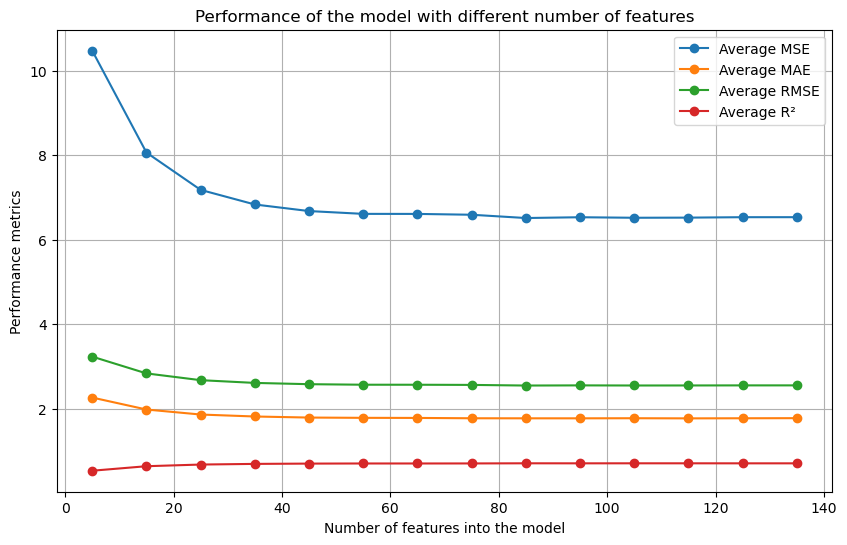

In [404]:
# visualize that so it becomes clear how it develops
results_df = pd.DataFrame(results)

plt.figure(figsize=(10, 6))
plt.plot(results_df['num_features'], results_df['avg_mse'], marker='o', label='Average MSE')
plt.plot(results_df['num_features'], results_df['avg_mae'], marker='o', label='Average MAE')
plt.plot(results_df['num_features'], results_df['avg_rmse'], marker='o', label='Average RMSE')
plt.plot(results_df['num_features'], results_df['avg_r2'], marker='o', label='Average R²')

plt.xlabel('Number of features into the model')
plt.ylabel('Performance metrics')
plt.title('Performance of the model with different number of features')
plt.legend()
plt.grid(True)
plt.show()

Now we know in this instance, we can take 95 features as best and train it on that. Really happy with this performance, now impute it in the dataset

In [405]:
best_top_n = best_result['num_features']
top_indices = np.argsort(importances)[-best_top_n:][::-1]
top_features = feature_names[top_indices]
df_imputed_top = df_imputed[top_features.tolist() + [target_column]]

In [406]:
kf = KFold(n_splits=10, shuffle=True, random_state=42)
imputation_errors = []

In [407]:
for train_index, test_index in kf.split(df_imputed_top):
    X_train, X_test = df_imputed_top.iloc[train_index].drop(columns=[target_column]), df_imputed_top.iloc[test_index].drop(columns=[target_column])
    y_train, y_test = df_imputed_top.iloc[train_index][target_column], df_imputed_top.iloc[test_index][target_column]
    
    hgb_imputer = HistGradientBoostingRegressor(random_state=42)
    hgb_imputer.fit(X_train, y_train)
    
    y_pred = hgb_imputer.predict(X_test)
    y_pred = np.maximum(y_pred, 0)
    y_pred = np.round(y_pred).astype(int)
    
    mse = mean_squared_error(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test, y_pred)
    
    print(f"Fold Results - MSE: {mse}, MAE: {mae}, RMSE: {rmse}, R²: {r2}")
    imputation_errors.append({'MSE': mse, 'MAE': mae, 'RMSE': rmse, 'R²': r2})

Fold Results - MSE: 6.812854442344046, MAE: 1.7731568998109641, RMSE: 2.610144525183241, R²: 0.6937156037898782
Fold Results - MSE: 7.02930056710775, MAE: 1.7930056710775046, RMSE: 2.6512828153759362, R²: 0.6819044884626115
Fold Results - MSE: 5.985822306238186, MAE: 1.6361058601134215, RMSE: 2.4465940215405957, R²: 0.7388902623570043
Fold Results - MSE: 7.140831758034026, MAE: 1.8629489603024574, RMSE: 2.6722334774555208, R²: 0.7140412054216471
Fold Results - MSE: 7.125708884688091, MAE: 1.7948960302457466, RMSE: 2.6694023459733627, R²: 0.6705553570251432
Fold Results - MSE: 6.160680529300567, MAE: 1.6843100189035918, RMSE: 2.4820718219464495, R²: 0.727735447718354
Fold Results - MSE: 6.145557655954631, MAE: 1.6918714555765595, RMSE: 2.4790235287214664, R²: 0.7455579359137863
Fold Results - MSE: 5.9319470699432895, MAE: 1.6937618147448015, RMSE: 2.4355588824627685, R²: 0.727592332242104
Fold Results - MSE: 6.48628192999054, MAE: 1.7805108798486282, RMSE: 2.5468180009554158, R²: 0.7009

In [408]:
avg_mse = np.mean([error['MSE'] for error in imputation_errors])
avg_mae = np.mean([error['MAE'] for error in imputation_errors])
avg_rmse = np.mean([error['RMSE'] for error in imputation_errors])
avg_r2 = np.mean([error['R²'] for error in imputation_errors])

print(f"Average MSE: {avg_mse}")
print(f"Average MAE: {avg_mae}")
print(f"Average RMSE: {avg_rmse}")
print(f"Average R²: {avg_r2}")

Average MSE: 6.606401825618391
Average MAE: 1.7534597864985078
Average RMSE: 2.5684789337320333
Average R²: 0.7067735665460791


In [409]:
mask = df_lowrisk_imputed['Aantal inschrijvingen'].isna() # create mask
X_missing = df_lowrisk_imputed[mask].drop(columns=['Aantal inschrijvingen'])
X_missing = X_missing[top_features]  

In [410]:
imputed_values = hgb_imputer.predict(X_missing)  # PREDICTION
imputed_values = np.maximum(imputed_values, 0)  # no negatives
imputed_values = np.round(imputed_values).astype(int)

In [411]:
df_lowrisk_imputed.loc[mask, 'Aantal inschrijvingen'] = imputed_values # insert
print(df_lowrisk_imputed['Aantal inschrijvingen'].isna().sum()) # output is 0, so went correctly as i wanted

0


In [412]:
print("Before Imputation:")
print(df_lowrisk['Aantal inschrijvingen'].describe())
print("After Imputation:")
print(df_lowrisk_imputed['Aantal inschrijvingen'].describe())

Before Imputation:
count    10578.000000
mean         6.050577
std          4.753247
min          1.000000
25%          3.000000
50%          5.000000
75%          8.000000
max         23.000000
Name: Aantal inschrijvingen, dtype: float64
After Imputation:
count    13993.000000
mean         6.051240
std          4.373518
min          0.000000
25%          3.000000
50%          5.000000
75%          8.000000
max         23.000000
Name: Aantal inschrijvingen, dtype: float64


10903 means all NaN values are filled. I now want to add the the column to the original dataset, but indexes don't match as we can wee down here, so that needs to be sorted first.

In [413]:
print("Index of df_lowrisk:", df_lowrisk.index)
print("Index of df_lowrisk_imputed:", df_lowrisk_imputed.index)

Index of df_lowrisk: Index([    4,     5,    18,    19,    20,    21,    22,    23,    24,    25,
       ...
       29256, 29257, 29258, 29259, 29260, 29261, 29262, 29263, 29264, 29265],
      dtype='int64', length=13993)
Index of df_lowrisk_imputed: RangeIndex(start=0, stop=13993, step=1)


In [414]:
df_lowrisk_imputed = df_lowrisk_imputed.set_index(df_lowrisk.index)
equal = df_lowrisk.index.equals(df_lowrisk_imputed.index)
print(equal)

True


In [415]:
df_lowrisk.loc[:, 'Aantal inschrijvingen IMPUTED'] = df_lowrisk_imputed['Aantal inschrijvingen'] # return to the old df
nan_count = df_lowrisk['Aantal inschrijvingen IMPUTED'].isna().sum()
print(nan_count)

0


/var/folders/4w/2tspj8b910d0wfksxgqd4km80000gn/T/ipykernel_27675/3156762540.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_lowrisk.loc[:, 'Aantal inschrijvingen IMPUTED'] = df_lowrisk_imputed['Aantal inschrijvingen'] # return to the old df


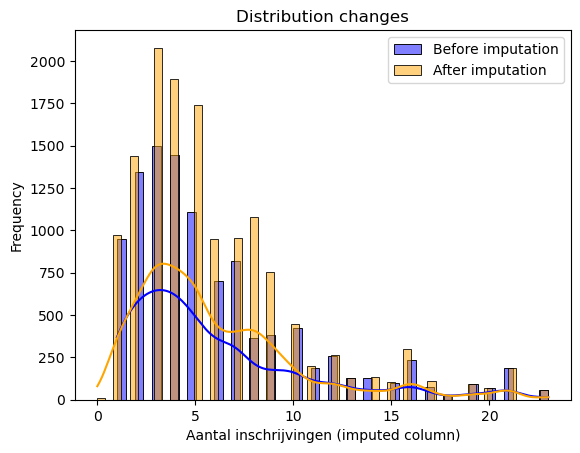

In [416]:
# distribution comparison
sns.histplot(df_lowrisk['Aantal inschrijvingen'], kde=True, color='blue', label='Before imputation')
sns.histplot(df_lowrisk['Aantal inschrijvingen IMPUTED'], kde=True, color='orange', label='After imputation')
plt.legend()
plt.title('Distribution changes')
plt.xlabel('Aantal inschrijvingen (imputed column)')
plt.ylabel('Frequency')
plt.show()

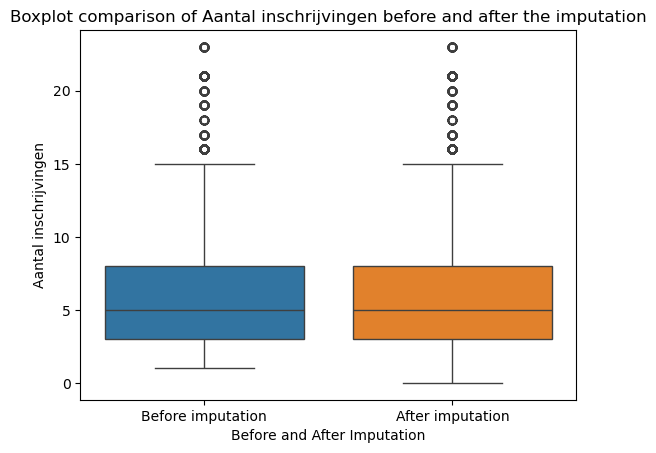

In [417]:
# boxplot
sns.boxplot(data=[df_lowrisk['Aantal inschrijvingen'], df_lowrisk['Aantal inschrijvingen IMPUTED']])
plt.xticks([0, 1], ['Before imputation', 'After imputation'])
plt.title('Boxplot comparison of Aantal inschrijvingen before and after the imputation')
plt.xlabel('Before and After Imputation')
plt.ylabel('Aantal inschrijvingen')
plt.show()

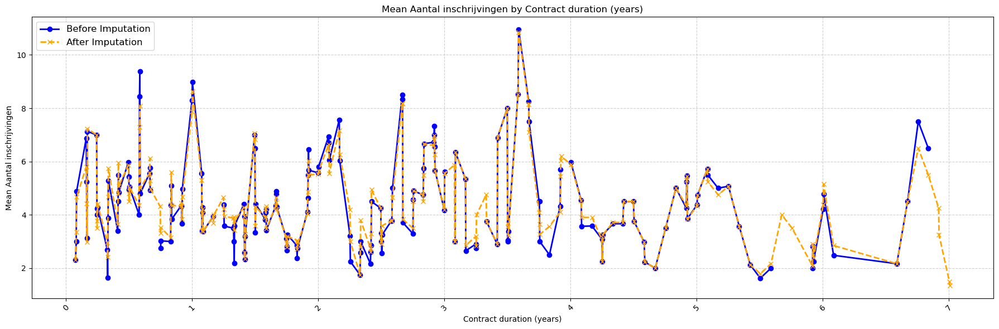

In [418]:
mean_before_imputation = df_lowrisk.groupby('Contract duration (years)')['Aantal inschrijvingen'].mean()
mean_after_imputation = df_lowrisk.groupby('Contract duration (years)')['Aantal inschrijvingen IMPUTED'].mean()

mean_before_imputation = mean_before_imputation.rolling(window=2).mean()  # Reducing window size for more points
mean_after_imputation = mean_after_imputation.rolling(window=2).mean()

plt.figure(figsize=(18, 6))  # Significantly increasing figure width for more space between points
mean_before_imputation.plot(label='Before Imputation', color='blue', linestyle='-', linewidth=2, marker='o')
mean_after_imputation.plot(label='After Imputation', color='orange', linestyle='--', linewidth=2, marker='x')
plt.legend(loc='upper left', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)
plt.title('Mean Aantal inschrijvingen by Contract duration (years)')
plt.xlabel('Contract duration (years)')
plt.ylabel('Mean Aantal inschrijvingen')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

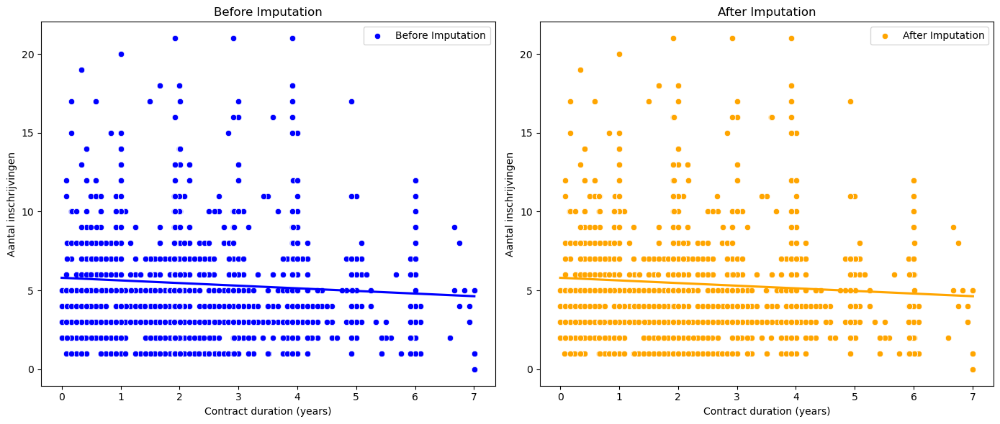

In [419]:
# extracting data
x_before = df_lowrisk['Contract duration (years)']
y_before = df_lowrisk['Aantal inschrijvingen']
x_after = df_lowrisk['Contract duration (years)']
y_after = df_lowrisk['Aantal inschrijvingen IMPUTED']

# create figure
plt.figure(figsize=(14, 6))

# before imputation
plt.subplot(1, 2, 1)
sns.scatterplot(x=x_before, y=y_before, color='blue', label='Before Imputation')
sns.regplot(x=x_before, y=y_before, scatter=False, color='blue', line_kws={"label":"Linear Fit"}, ci=None)
plt.title('Before Imputation')
plt.xlabel('Contract duration (years)')
plt.ylabel('Aantal inschrijvingen')
plt.legend()

# after imputation
plt.subplot(1, 2, 2)
sns.scatterplot(x=x_after, y=y_after, color='orange', label='After Imputation')
sns.regplot(x=x_after, y=y_after, scatter=False, color='orange', line_kws={"label":"Linear Fit"}, ci=None)
plt.title('After Imputation')
plt.xlabel('Contract duration (years)')
plt.ylabel('Aantal inschrijvingen')
plt.legend()

plt.tight_layout()
plt.show()

In [420]:
# save it in a seprate variable
df_lowrisk_imputated_inschrijvingen = df_lowrisk.copy()

## Impute using HistGBoost (Contract duration)

Use the imputed values for aantal inschrijvingen, because the correlation is not zero eventhough it is weak its better to keep the consistency across the imputation process

In [680]:
df_lowrisk = df_lowrisk_imputated_inschrijvingen.copy()

Using Aanvang opdracht and Voltooiing opdracht opdracht will lead to an overfit so these two columns will not be used, as the contract duration is determined using these columns and the occurence of them is almost equal to the occurence of Contract duration. So it will seem like the predictions are very good but it will overfit, as train and test data need the contract duration, and every contract duration has both those columns making the prediction seem good, but the ones you actually want to predict do not have these columns making them useless. 

In [681]:
nominal_columns = [
    'Publicatiemaand', 'Publicatiemaand_kwartaal', 
    'Sluitingsdatum aanbesteding_kwartaal', 'Termijn verkrijgen documenten_kwartaal', 
    'Cleaned name AB', 'Category AD', 'Sluitingsdatum aanbesteding', 'Termijn verkrijgen documenten', 
    'Verzending uitnodigingen', 'Tegen betaling documenten verkrijgen', 
    'Personen aanwezig opening kluis', 'Nationaal of Europees', 
    'Publicatie soort', 'Juridisch kader', 'Type opdracht', 
    'Procedure', 'Hoofd CPV code', 'Opdracht categorie', 
    'Nutscode', 'Aard van de opdracht', 'GPA', 'Hoofdactiviteit', 
    'Hoofdgunningscriterium', 'Aantal inschrijvingen IMPUTED'
]

In [682]:
# Assuming nominal_columns is already defined
df = df_lowrisk.loc[:, nominal_columns]

# Add the 'Contract duration (years)' column
df['Contract duration (years)'] = df_lowrisk['Contract duration (years)']

In [683]:
df_lowrisk.columns

Index(['Id publicatie', 'Tenderned kenmerk', 'Publicatiemaand',
       'Publicatiemaand_kwartaal', 'Publicatiemaand_jaar',
       'Naam Aanbestedende dienst', 'Cleaned name AB', 'Category AD',
       'Nationaal identificatienummer', 'Naam aanbesteding', 'URL TenderNed',
       'Geimporteerd', 'Tsender', 'Aanbesteding id',
       'Sluitingsdatum aanmelding', 'Sluitingsdatum aanmelding_kwartaal',
       'Sluitingsdatum aanmelding_jaar', 'Sluitingsdatum aanbesteding',
       'Sluitingsdatum aanbesteding_kwartaal',
       'Sluitingsdatum aanbesteding_jaar', 'Aanvang opdracht',
       'Aanvang opdracht_kwartaal', 'Aanvang opdracht_jaar',
       'Voltooiing opdracht', 'Voltooiing opdracht_kwartaal',
       'Voltooiing opdracht_jaar', 'Termijn verkrijgen documenten',
       'Termijn verkrijgen documenten_kwartaal',
       'Termijn verkrijgen documenten_jaar', 'Verzending uitnodigingen',
       'Verzending uitnodigingen_kwartaal', 'Verzending uitnodigingen_jaar',
       'Tegen betaling documen

In [684]:
data_types = df.dtypes
grouped_by_dtype = {dtype: list(data_types[data_types == dtype].index) for dtype in data_types.unique()} # useful to know what datatypes, for the ML model later

for dtype, columns in grouped_by_dtype.items():
    print(f"{dtype}: {columns}")

datetime64[ns]: ['Publicatiemaand', 'Sluitingsdatum aanbesteding', 'Termijn verkrijgen documenten', 'Verzending uitnodigingen']
period[Q-DEC]: ['Publicatiemaand_kwartaal', 'Sluitingsdatum aanbesteding_kwartaal', 'Termijn verkrijgen documenten_kwartaal']
object: ['Cleaned name AB', 'Category AD', 'Tegen betaling documenten verkrijgen', 'Personen aanwezig opening kluis', 'Nationaal of Europees', 'Publicatie soort', 'Juridisch kader', 'Type opdracht', 'Procedure', 'Hoofd CPV code', 'Opdracht categorie', 'Nutscode', 'Aard van de opdracht', 'GPA', 'Hoofdactiviteit', 'Hoofdgunningscriterium']
float64: ['Aantal inschrijvingen IMPUTED', 'Contract duration (years)']


Because we have many different data types, we need to make them numerical as this helps for ML model.

In [685]:
datetime_cols = [
    'Publicatiemaand', 'Sluitingsdatum aanbesteding', 
    'Termijn verkrijgen documenten'
]

for col in datetime_cols:
    df[col] = pd.to_datetime(df[col], format='%d-%m-%Y', errors='coerce')
    df[col + '_year'] = df[col].dt.year
    df[col + '_month'] = df[col].dt.month
    df[col + '_day'] = df[col].dt.day
    df.drop(columns=col, inplace=True)

period_cols = [
    'Publicatiemaand_kwartaal', 'Sluitingsdatum aanbesteding_kwartaal', 
    'Termijn verkrijgen documenten_kwartaal'
]
placeholder_period = '1900Q1'

for col in period_cols:
    df[col] = df[col].fillna(placeholder_period).astype(str)
    df[col + '_year'] = df[col].str[:4].astype(int)
    df[col + '_quarter'] = df[col].str[5:].astype(int)
    df.drop(columns=col, inplace=True)

categorical_cols = [
    'Cleaned name AB', 'Category AD', 'Verzending uitnodigingen', 
    'Tegen betaling documenten verkrijgen', 'Personen aanwezig opening kluis', 
    'Nationaal of Europees', 'Publicatie soort', 'Juridisch kader', 
    'Type opdracht', 'Procedure', 'Opdracht categorie', 
    'Nutscode', 'Aard van de opdracht', 'GPA', 'Hoofdactiviteit', 
    'Hoofdgunningscriterium', 'Hoofd CPV code'
]

# One-hot encode
encoder = OneHotEncoder(sparse_output=False, handle_unknown='ignore')
encoded_features = encoder.fit_transform(df[categorical_cols])
encoded_df = pd.DataFrame(encoded_features, columns=encoder.get_feature_names_out(categorical_cols)) # one hot encoding

df.drop(columns=categorical_cols, inplace=True)
df = pd.concat([df.reset_index(drop=True), encoded_df.reset_index(drop=True)], axis=1)

In [686]:
# check if transition was succesful
data_types = df.dtypes
grouped_by_dtype = {dtype: list(data_types[data_types == dtype].index) for dtype in data_types.unique()}

# display grouped columns by data type
for dtype, columns in grouped_by_dtype.items():
    print(f"{dtype}: {columns}")

float64: ['Aantal inschrijvingen IMPUTED', 'Contract duration (years)', 'Sluitingsdatum aanbesteding_year', 'Sluitingsdatum aanbesteding_month', 'Sluitingsdatum aanbesteding_day', 'Termijn verkrijgen documenten_year', 'Termijn verkrijgen documenten_month', 'Termijn verkrijgen documenten_day', 'Cleaned name AB_ABG-organisatie', 'Cleaned name AB_Avri', 'Cleaned name AB_BAR-gemeente', 'Cleaned name AB_Bizob', 'Cleaned name AB_Blink GRR', 'Cleaned name AB_GAD Regio Gooi en Vechtstreek', 'Cleaned name AB_GEM Bloemendalerpolder C.V.', 'Cleaned name AB_Gemeenschappelijke Regeling Nieuw Reijerwaard', 'Cleaned name AB_Gemeenschappelijke Regeling Omgevingsdienst Midden- en West-Brabant', 'Cleaned name AB_Gemeenschappelijke Regeling Omgevingsdienst Regio Utrecht', 'Cleaned name AB_Gemeenschappelijke regeling Veiligheidsregio Brabant-Noord, onderdeel Brandweer', 'Cleaned name AB_Gemeente Aa en Hunze', 'Cleaned name AB_Gemeente Aalsmeer', 'Cleaned name AB_Gemeente Alkmaar', 'Cleaned name AB_Gemeent

Now we are going to impute the data. The model I chose is the gradient booster, because it can take both categorical and numerical data, but mainly because it can handle missing data. Some of the features also have missing data.

In [687]:
print(df_lowrisk['Contract duration (years)'].describe())

count    6018.000000
mean        2.478924
std         1.376772
min         0.000000
25%         1.753425
50%         2.000000
75%         3.671233
max         7.005479
Name: Contract duration (years), dtype: float64


### Imputate Contract duration (years)

In [688]:
target_column = 'Contract duration (years)'
df_imputed = df.copy()
df_lowrisk_imputed = df.copy()

df_imputed = df_imputed.dropna(subset=[target_column]) # skip rows where target column is missing

#### Feature importance

Since we did one-hot encoding, the df_imputed has many columns and therefore also many many features to take into account. However, taking them all into account makes the model too complex (curse of dimensionality).

In [689]:
df_imputed.shape # 784 features, pfew

(6018, 784)

In [690]:
X_train, X_test, y_train, y_test = train_test_split(df_imputed.drop(columns=[target_column]), df_imputed[target_column], test_size=0.2, random_state=42) #first train the model on the whole dataset
hgb_imputer = HistGradientBoostingRegressor(random_state=42)
hgb_imputer.fit(X_train, y_train)

HistGradientBoostingRegressor(random_state=42)

In [691]:
feature_names = X_train.columns 
n_repeats = 10

def calculate_permutation_importance(model, X, y, n_repeats, random_state=42):
    print("Starting calculation")
    
    start_time = time.time()
    importances = np.zeros((n_repeats, X.shape[1]))
    
    for i in tqdm(range(n_repeats), desc="Repeats"):
        result = permutation_importance(model, X, y, n_repeats=1, random_state=random_state + i, n_jobs=-1)
        importances[i, :] = result.importances[:, 0]
        print(f"Round {i+1}/{n_repeats} done")
    
    end_time = time.time()
    elapsed_time = end_time - start_time
    print(f"Total time taken: {elapsed_time:.2f} seconds")
    
    mean_importances = importances.mean(axis=0)
    return mean_importances

In [692]:
importances = calculate_permutation_importance(hgb_imputer, X_train, y_train, n_repeats) # actual function

Starting calculation


Repeats:  10%|█         | 1/10 [00:16<02:31, 16.78s/it]

Round 1/10 done


Repeats:  20%|██        | 2/10 [00:31<02:05, 15.68s/it]

Round 2/10 done


Repeats:  30%|███       | 3/10 [00:42<01:33, 13.34s/it]

Round 3/10 done


Repeats:  40%|████      | 4/10 [00:52<01:13, 12.27s/it]

Round 4/10 done


Repeats:  50%|█████     | 5/10 [01:03<00:57, 11.55s/it]

Round 5/10 done


Repeats:  60%|██████    | 6/10 [01:14<00:45, 11.32s/it]

Round 6/10 done


Repeats:  70%|███████   | 7/10 [01:25<00:34, 11.37s/it]

Round 7/10 done


Repeats:  80%|████████  | 8/10 [01:38<00:23, 11.85s/it]

Round 8/10 done


Repeats:  90%|█████████ | 9/10 [01:50<00:11, 11.84s/it]

Round 9/10 done


Repeats: 100%|██████████| 10/10 [02:00<00:00, 12.08s/it]

Round 10/10 done
Total time taken: 120.80 seconds


Feature: Sluitingsdatum aanbesteding_month, Importance: 0.13010431017885055
Feature: Aard van de opdracht_Raamovereenkomst, Importance: 0.1276750397751084
Feature: Aantal inschrijvingen IMPUTED, Importance: 0.12267207482036883
Feature: Nationaal of Europees_Europees, Importance: 0.10210686286332833
Feature: Termijn verkrijgen documenten_month, Importance: 0.06310041576734467
Feature: Sluitingsdatum aanbesteding_year, Importance: 0.05743001677048344
Feature: Termijn verkrijgen documenten_year, Importance: 0.057313777250205325
Feature: Cleaned name AB_Waterschap Limburg, Importance: 0.04984791328675666
Feature: Category AD_Rijkswaterstaat, Importance: 0.04977482208400676
Feature: Publicatiemaand_year, Importance: 0.044088822407612305
Feature: Hoofd CPV code_50, Importance: 0.043201845156810435
Feature: Hoofd CPV code_71, Importance: 0.0324546860485212
Feature: Hoofdgunningscriterium_Beste prijs-kwaliteit verhouding, Importance: 0.0321433331398565
Feature: Nutscode_NL, Importance: 0.02653

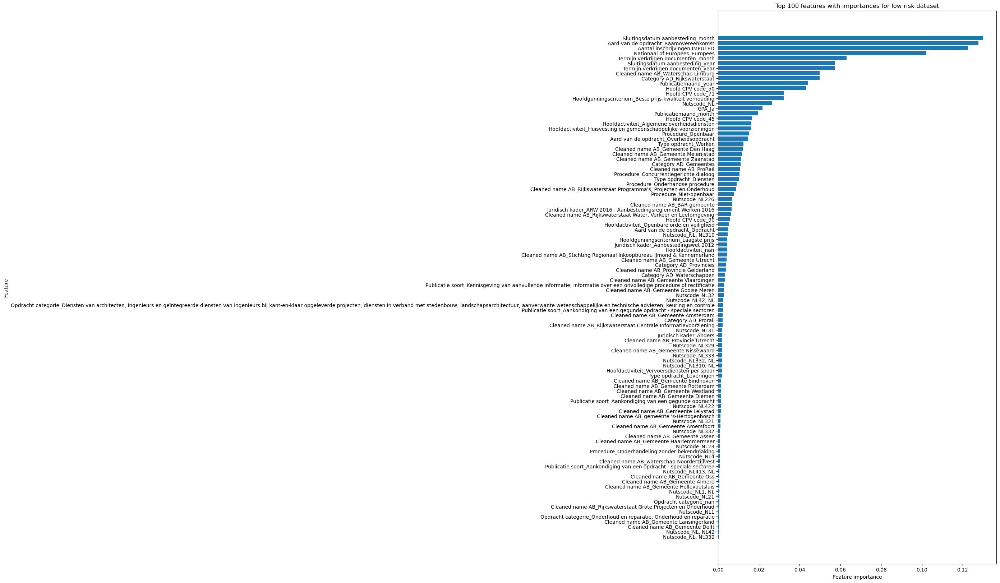

In [693]:
top_100_indices = np.argsort(importances)[::-1][:100] #take top 100

for i in top_100_indices:
    print(f"Feature: {feature_names[i]}, Importance: {importances[i]}")

top_100_features = [feature_names[i] for i in top_100_indices]
top_100_importances = [importances[i] for i in top_100_indices]

# Plot the feature importances for the top 100 features
plt.figure(figsize=(10, 20))
plt.barh(top_100_features, top_100_importances)
plt.xlabel("Feature importance")
plt.ylabel("Feature")
plt.title("Top 100 features with importances for low risk dataset")
plt.gca().invert_yaxis()
plt.show()

After we need to check how much features we will take into account. We can do this by doing K-fold validation and checking which amount of features gives a good result.

In [694]:
top_feature_counts = list(range(5, 140, 5)) 
best_result = {'num_features': 0, 'avg_mse': float('inf'), 'avg_mae': float('inf'), 'avg_rmse': float('inf'), 'avg_r2': float('-inf')}
results = []

In [695]:
for top_n in top_feature_counts: # so it looks for different numbers
    top_indices = np.argsort(importances)[-top_n:][::-1]
    top_features = feature_names[top_indices]
    
    df_imputed_top_n = df_imputed[top_features.tolist() + [target_column]]
    
    kf = KFold(n_splits=10, shuffle=True, random_state=42)
    imputation_errors = []
    
    for train_index, test_index in kf.split(df_imputed_top_n):
        X_train, X_test = df_imputed_top_n.iloc[train_index].drop(columns=[target_column]), df_imputed_top_n.iloc[test_index].drop(columns=[target_column])
        y_train, y_test = df_imputed_top_n.iloc[train_index][target_column], df_imputed_top_n.iloc[test_index][target_column]
        
        hgb_imputer = HistGradientBoostingRegressor(random_state=42)
        hgb_imputer.fit(X_train, y_train)
        
        y_pred = hgb_imputer.predict(X_test)
        y_pred = np.maximum(y_pred, 0)
        
        mse = mean_squared_error(y_test, y_pred)
        mae = mean_absolute_error(y_test, y_pred)
        rmse = np.sqrt(mse)
        r2 = r2_score(y_test, y_pred)
        
        imputation_errors.append({'MSE': mse, 'MAE': mae, 'RMSE': rmse, 'R²': r2})
    
    # average calculation after the 10 fold
    avg_mse = np.mean([error['MSE'] for error in imputation_errors])
    avg_mae = np.mean([error['MAE'] for error in imputation_errors])
    avg_rmse = np.mean([error['RMSE'] for error in imputation_errors])
    avg_r2 = np.mean([error['R²'] for error in imputation_errors])
    
    print(f"Top {top_n} features gives: - Average MSE: {avg_mse}, Average MAE: {avg_mae}, Average RMSE: {avg_rmse}, Average R²: {avg_r2}")
    
    results.append({'num_features': top_n, 'avg_mse': avg_mse, 'avg_mae': avg_mae, 'avg_rmse': avg_rmse, 'avg_r2': avg_r2})
    
    if avg_mse < best_result['avg_mse']:
        best_result = {'num_features': top_n, 'avg_mse': avg_mse, 'avg_mae': avg_mae, 'avg_rmse': avg_rmse, 'avg_r2': avg_r2}

print(f"Best result: Top {best_result['num_features']} Features - Average MSE: {best_result['avg_mse']}, Average MAE: {best_result['avg_mae']}, Average RMSE: {best_result['avg_rmse']}, Average R²: {best_result['avg_r2']}")

Top 5 features gives: - Average MSE: 1.1409558244946125, Average MAE: 0.7623687370248783, Average RMSE: 1.067136238132954, Average R²: 0.398400477177996
Top 10 features gives: - Average MSE: 0.9068752068806868, Average MAE: 0.6428903245174455, Average RMSE: 0.9515256012923947, Average R²: 0.521482504184467
Top 15 features gives: - Average MSE: 0.7609315396039659, Average MAE: 0.576534710754113, Average RMSE: 0.8708860921418596, Average R²: 0.5989172996231187
Top 20 features gives: - Average MSE: 0.7562823974825587, Average MAE: 0.5680579552665664, Average RMSE: 0.8684140430586824, Average R²: 0.601182901954326
Top 25 features gives: - Average MSE: 0.7103252435830001, Average MAE: 0.5434929619940294, Average RMSE: 0.841635011955345, Average R²: 0.6255017226476041
Top 30 features gives: - Average MSE: 0.7013027220221056, Average MAE: 0.5427336557476385, Average RMSE: 0.8362889145027508, Average R²: 0.6300882529711632
Top 35 features gives: - Average MSE: 0.6899792426056635, Average MAE: 

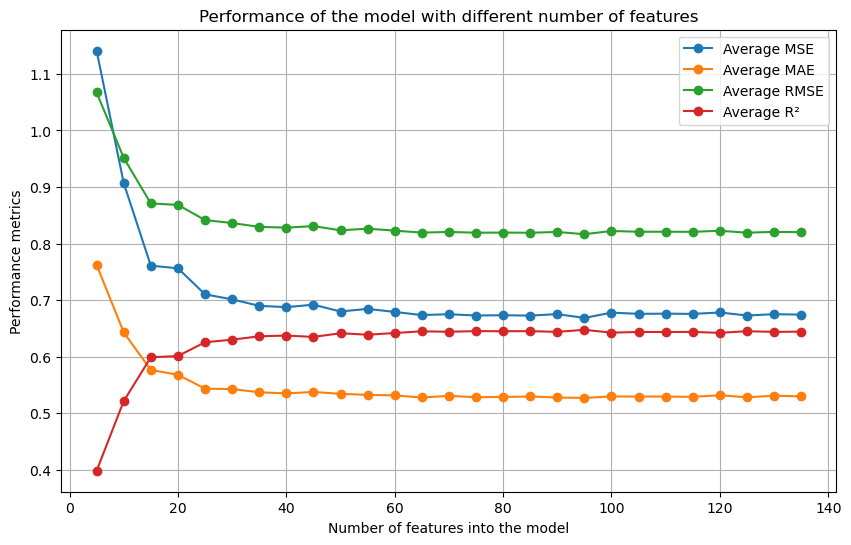

In [696]:
# visualize that so it becomes clear how it develops
results_df = pd.DataFrame(results)

plt.figure(figsize=(10, 6))
plt.plot(results_df['num_features'], results_df['avg_mse'], marker='o', label='Average MSE')
plt.plot(results_df['num_features'], results_df['avg_mae'], marker='o', label='Average MAE')
plt.plot(results_df['num_features'], results_df['avg_rmse'], marker='o', label='Average RMSE')
plt.plot(results_df['num_features'], results_df['avg_r2'], marker='o', label='Average R²')

plt.xlabel('Number of features into the model')
plt.ylabel('Performance metrics')
plt.title('Performance of the model with different number of features')
plt.legend()
plt.grid(True)
plt.show()

Now we know in this instance, we can take 95 features as best and train it on that. Really happy with this performance, now impute it in the dataset

In [697]:
best_top_n = best_result['num_features']
top_indices = np.argsort(importances)[-best_top_n:][::-1]
top_features = feature_names[top_indices]
df_imputed_top = df_imputed[top_features.tolist() + [target_column]]

In [698]:
kf = KFold(n_splits=10, shuffle=True, random_state=42)
imputation_errors = []

In [699]:
for train_index, test_index in kf.split(df_imputed_top):
    X_train, X_test = df_imputed_top.iloc[train_index].drop(columns=[target_column]), df_imputed_top.iloc[test_index].drop(columns=[target_column])
    y_train, y_test = df_imputed_top.iloc[train_index][target_column], df_imputed_top.iloc[test_index][target_column]
    
    hgb_imputer = HistGradientBoostingRegressor(random_state=42)
    hgb_imputer.fit(X_train, y_train)
    
    y_pred = hgb_imputer.predict(X_test)
    y_pred = np.maximum(y_pred, 0)
    
    mse = mean_squared_error(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test, y_pred)
    
    print(f"Fold Results - MSE: {mse}, MAE: {mae}, RMSE: {rmse}, R²: {r2}")
    imputation_errors.append({'MSE': mse, 'MAE': mae, 'RMSE': rmse, 'R²': r2})

Fold Results - MSE: 0.8179273726032285, MAE: 0.5734982060229135, RMSE: 0.9043933727108069, R²: 0.5875272178359832
Fold Results - MSE: 0.6083747521971719, MAE: 0.5204713683074745, RMSE: 0.7799838153430954, R²: 0.6684739524330462
Fold Results - MSE: 0.6801568176031785, MAE: 0.5217077133472957, RMSE: 0.824716204280708, R²: 0.6346736067747435
Fold Results - MSE: 0.6116337933017674, MAE: 0.4967975633426019, RMSE: 0.7820701971701565, R²: 0.6744807629262721
Fold Results - MSE: 0.586073689814344, MAE: 0.5037257274567936, RMSE: 0.765554498265371, R²: 0.6718797019967746
Fold Results - MSE: 0.5862854875539006, MAE: 0.4962555157041289, RMSE: 0.7656928153991656, R²: 0.6760985870874973
Fold Results - MSE: 0.6656826075377792, MAE: 0.525901788637971, RMSE: 0.8158937477011202, R²: 0.6385522054801139
Fold Results - MSE: 0.7356368886788576, MAE: 0.5455742178876564, RMSE: 0.8576927705646454, R²: 0.6203414812209291
Fold Results - MSE: 0.7213741990499913, MAE: 0.5535380828752595, RMSE: 0.849337505971561, R²

In [700]:
avg_mse = np.mean([error['MSE'] for error in imputation_errors])
avg_mae = np.mean([error['MAE'] for error in imputation_errors])
avg_rmse = np.mean([error['RMSE'] for error in imputation_errors])
avg_r2 = np.mean([error['R²'] for error in imputation_errors])

print(f"Average MSE: {avg_mse}")
print(f"Average MAE: {avg_mae}")
print(f"Average RMSE: {avg_rmse}")
print(f"Average R²: {avg_r2}")

Average MSE: 0.6685322896911927
Average MAE: 0.5271481568123085
Average RMSE: 0.8165199116508525
Average R²: 0.6475366567485877


In [701]:
mask = df_lowrisk_imputed['Contract duration (years)'].isna() # create mask
X_missing = df_lowrisk_imputed[mask].drop(columns=['Contract duration (years)'])
X_missing = X_missing[top_features]  

In [702]:
imputed_values = hgb_imputer.predict(X_missing)  # PREDICTION
imputed_values = np.maximum(imputed_values, 0)  # no negatives

In [703]:
df_lowrisk_imputed.loc[mask, 'Contract duration (years)'] = imputed_values # insert
print(df_lowrisk_imputed['Contract duration (years)'].isna().sum()) # output is 0, so went correctly as i wanted

0


In [704]:
print("Before Imputation:")
print(df_lowrisk['Contract duration (years)'].describe())
print("After Imputation:")
print(df_lowrisk_imputed['Contract duration (years)'].describe())

Before Imputation:
count    6018.000000
mean        2.478924
std         1.376772
min         0.000000
25%         1.753425
50%         2.000000
75%         3.671233
max         7.005479
Name: Contract duration (years), dtype: float64
After Imputation:
count    13993.000000
mean         2.471621
std          1.052229
min          0.000000
25%          1.915068
50%          2.329874
75%          3.002740
max          7.005479
Name: Contract duration (years), dtype: float64


10903 means all NaN values are filled. I now want to add the the column to the original dataset, but indexes don't match as we can wee down here, so that needs to be sorted first.

In [705]:
print("Index of df_lowrisk:", df_lowrisk.index)
print("Index of df_lowrisk_imputed:", df_lowrisk_imputed.index)

Index of df_lowrisk: Index([    4,     5,    18,    19,    20,    21,    22,    23,    24,    25,
       ...
       29256, 29257, 29258, 29259, 29260, 29261, 29262, 29263, 29264, 29265],
      dtype='int64', length=13993)
Index of df_lowrisk_imputed: RangeIndex(start=0, stop=13993, step=1)


In [706]:
df_lowrisk_imputed = df_lowrisk_imputed.set_index(df_lowrisk.index)
equal = df_lowrisk.index.equals(df_lowrisk_imputed.index)
print(equal)

True


In [707]:
df_lowrisk.loc[:, 'Contract duration (years) IMPUTED'] = df_lowrisk_imputed['Contract duration (years)'] # return to the old df
nan_count = df_lowrisk['Contract duration (years) IMPUTED'].isna().sum()
print(nan_count)

0


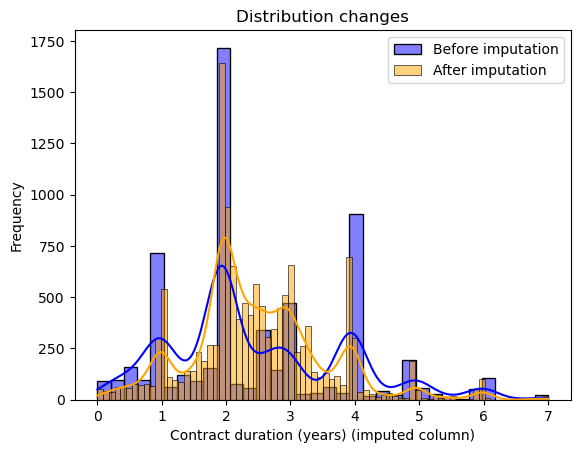

In [708]:
# distribution comparison
sns.histplot(df_lowrisk['Contract duration (years)'], kde=True, color='blue', label='Before imputation')
sns.histplot(df_lowrisk['Contract duration (years) IMPUTED'], kde=True, color='orange', label='After imputation')
plt.legend()
plt.title('Distribution changes')
plt.xlabel('Contract duration (years) (imputed column)')
plt.ylabel('Frequency')
plt.show()

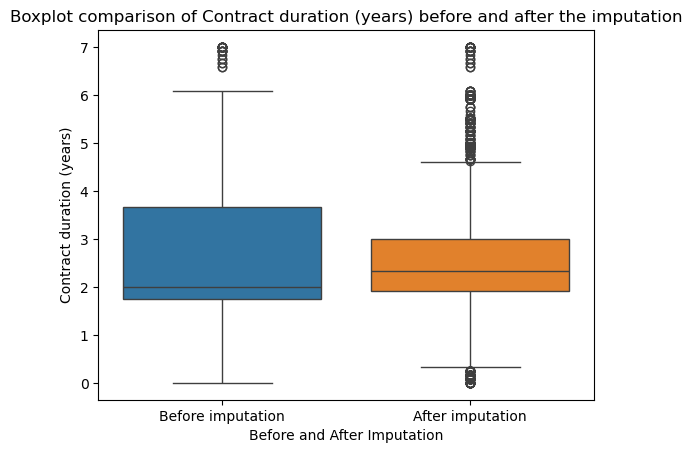

In [709]:
# boxplot
sns.boxplot(data=[df_lowrisk['Contract duration (years)'], df_lowrisk['Contract duration (years) IMPUTED']])
plt.xticks([0, 1], ['Before imputation', 'After imputation'])
plt.title('Boxplot comparison of Contract duration (years) before and after the imputation')
plt.xlabel('Before and After Imputation')
plt.ylabel('Contract duration (years)')
plt.show()

In [711]:
df_lowrisk_hg = df_lowrisk.copy()

df_lowrisk_hg

,Id publicatie,Tenderned kenmerk,Publicatiemaand,Publicatiemaand_kwartaal,Publicatiemaand_jaar,Naam Aanbestedende dienst,Cleaned name AB,Category AD,Nationaal identificatienummer,Naam aanbesteding,...,Opdracht,Hoofdgunningscriterium,Datum gunning,Datum gunning_kwartaal,Datum gunning_jaar,Aantal inschrijvingen,Contract duration (years),Missing ratio,Aantal inschrijvingen IMPUTED,Contract duration (years) IMPUTED
4,80195,99236,2016-04-01,2016Q2,2016,Gemeente Den Haag,Gemeente Den Haag,Gemeentes,221909103,Veegwerk Hofstadgebieden,...,NaN,Beste prijs-kwaliteit verhouding,NaT,NaT,NaN,NaN,1.915068,0.101830,3.0,1.915068
5,80191,72027,2016-04-01,2016Q2,2016,Gemeente Den Haag,Gemeente Den Haag,Gemeentes,221909103,Leveren en leggen van vloerbedekking gemeente ...,...,NaN,Beste prijs-kwaliteit verhouding,NaT,NaT,NaN,10.0,3.917808,0.200000,10.0,3.917808
18,80424,87149,2016-04-01,2016Q2,2016,Waterschap Vechtstromen,Waterschap Vechtstromen,Waterschappen,331835633,"Renovatie, correctief onderhoud en inspecties ...",...,NaN,Beste prijs-kwaliteit verhouding,NaT,NaT,NaN,16.0,NaN,0.172058,16.0,3.255619
19,80424,87149,2016-04-01,2016Q2,2016,Waterschap Vechtstromen,Waterschap Vechtstromen,Waterschappen,331835633,"Renovatie, correctief onderhoud en inspecties ...",...,NaN,Beste prijs-kwaliteit verhouding,NaT,NaT,NaN,16.0,NaN,0.172058,16.0,3.255619
20,80424,87149,2016-04-01,2016Q2,2016,Waterschap Vechtstromen,Waterschap Vechtstromen,Waterschappen,331835633,"Renovatie, correctief onderhoud en inspecties ...",...,NaN,Beste prijs-kwaliteit verhouding,NaT,NaT,NaN,16.0,NaN,0.172058,16.0,3.255619
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29261,319284,415840,2023-12-01,2023Q4,2023,Rijkswaterstaat Centrale Informatievoorziening,Rijkswaterstaat Centrale Informatievoorziening,Rijkswaterstaat,362069499,Fysische metingen,...,"Perceel 7 heeft betrekking op de Waddenzee, No...",Beste prijs-kwaliteit verhouding,NaT,NaT,NaN,17.0,4.920548,0.104136,17.0,4.920548
29262,319284,415840,2023-12-01,2023Q4,2023,Rijkswaterstaat Centrale Informatievoorziening,Rijkswaterstaat Centrale Informatievoorziening,Rijkswaterstaat,362069499,Fysische metingen,...,"Perceel 7 heeft betrekking op de Waddenzee, No...",Beste prijs-kwaliteit verhouding,NaT,NaT,NaN,17.0,4.920548,0.104136,17.0,4.920548
29263,319284,415840,2023-12-01,2023Q4,2023,Rijkswaterstaat Centrale Informatievoorziening,Rijkswaterstaat Centrale Informatievoorziening,Rijkswaterstaat,362069499,Fysische metingen,...,"Perceel 7 heeft betrekking op de Waddenzee, No...",Beste prijs-kwaliteit verhouding,NaT,NaT,NaN,17.0,4.920548,0.104136,17.0,4.920548
29264,319284,415840,2023-12-01,2023Q4,2023,Rijkswaterstaat Centrale Informatievoorziening,Rijkswaterstaat Centrale Informatievoorziening,Rijkswaterstaat,362069499,Fysische metingen,...,"Perceel 7 heeft betrekking op de Waddenzee, No...",Beste prijs-kwaliteit verhouding,NaT,NaT,NaN,17.0,4.920548,0.104136,17.0,4.920548


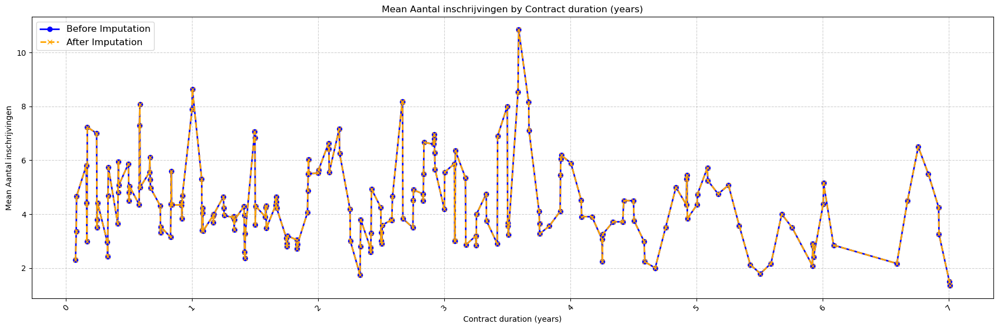

In [856]:
common_durations = set(df_lowrisk['Contract duration (years)']).intersection(df_lowrisk['Contract duration (years) IMPUTED'])

df_before_imputation = df_lowrisk[df_lowrisk['Contract duration (years)'].isin(common_durations)]
df_after_imputation = df_lowrisk[df_lowrisk['Contract duration (years) IMPUTED'].isin(common_durations)]

mean_before_imputation = df_before_imputation.groupby('Contract duration (years)')['Aantal inschrijvingen IMPUTED'].mean()
mean_after_imputation = df_after_imputation.groupby('Contract duration (years) IMPUTED')['Aantal inschrijvingen IMPUTED'].mean()

mean_before_imputation = mean_before_imputation.rolling(window=2).mean()
mean_after_imputation = mean_after_imputation.rolling(window=2).mean()

plt.figure(figsize=(18, 6))  # Significantly increasing figure width for more space between points
mean_before_imputation.plot(label='Before Imputation', color='blue', linestyle='-', linewidth=2, marker='o')
mean_after_imputation.plot(label='After Imputation', color='orange', linestyle='--', linewidth=2, marker='x')
plt.legend(loc='upper left', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)
plt.title('Mean Aantal inschrijvingen by Contract duration (years)')
plt.xlabel('Contract duration (years)')
plt.ylabel('Mean Aantal inschrijvingen')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


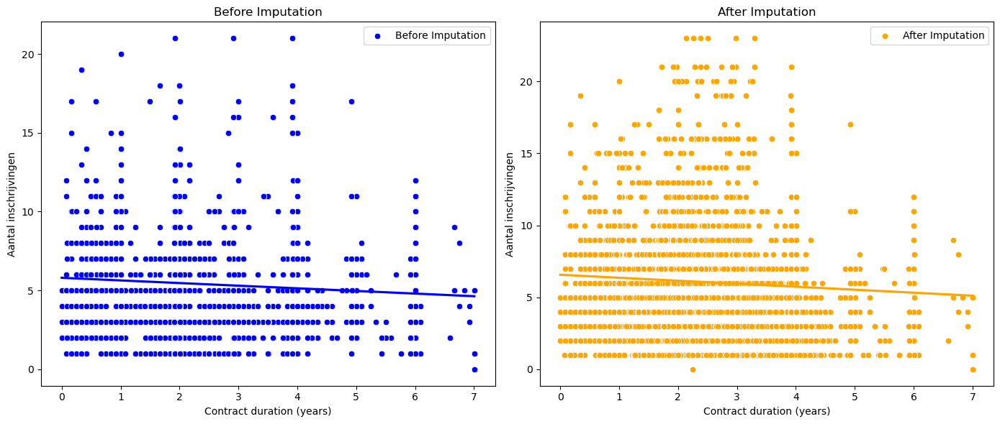

In [713]:
# extract data
x_before = df_lowrisk['Contract duration (years)']
y_before = df_lowrisk['Aantal inschrijvingen IMPUTED']
x_after = df_lowrisk['Contract duration (years) IMPUTED']
y_after = df_lowrisk['Aantal inschrijvingen IMPUTED']

# create figure
plt.figure(figsize=(14, 6))

# before imputation
plt.subplot(1, 2, 1)
sns.scatterplot(x=x_before, y=y_before, color='blue', label='Before Imputation')
sns.regplot(x=x_before, y=y_before, scatter=False, color='blue', line_kws={"label":"Linear Fit"}, ci=None)
plt.title('Before Imputation')
plt.xlabel('Contract duration (years)')
plt.ylabel('Aantal inschrijvingen')
plt.legend()

# after imputation
plt.subplot(1, 2, 2)
sns.scatterplot(x=x_after, y=y_after, color='orange', label='After Imputation')
sns.regplot(x=x_after, y=y_after, scatter=False, color='orange', line_kws={"label":"Linear Fit"}, ci=None)
plt.title('After Imputation')
plt.xlabel('Contract duration (years)')
plt.ylabel('Aantal inschrijvingen')
plt.legend()

plt.tight_layout()
plt.show()


it is visible that there was some change in the relationship the trend has now become more negative

# Impute missing data (high risk)

I want to impute the missing data, based on a ML model. That is what I am going to do here.

In [538]:
print(df_highrisk.columns)

Index(['Id publicatie', 'Tenderned kenmerk', 'Publicatiemaand',
       'Publicatiemaand_kwartaal', 'Publicatiemaand_jaar',
       'Naam Aanbestedende dienst', 'Cleaned name AB', 'Category AD',
       'Nationaal identificatienummer', 'Naam aanbesteding', 'URL TenderNed',
       'Geimporteerd', 'Tsender', 'Aanbesteding id',
       'Sluitingsdatum aanmelding', 'Sluitingsdatum aanmelding_kwartaal',
       'Sluitingsdatum aanmelding_jaar', 'Sluitingsdatum aanbesteding',
       'Sluitingsdatum aanbesteding_kwartaal',
       'Sluitingsdatum aanbesteding_jaar', 'Aanvang opdracht',
       'Aanvang opdracht_kwartaal', 'Aanvang opdracht_jaar',
       'Voltooiing opdracht', 'Voltooiing opdracht_kwartaal',
       'Voltooiing opdracht_jaar', 'Termijn verkrijgen documenten',
       'Termijn verkrijgen documenten_kwartaal',
       'Termijn verkrijgen documenten_jaar', 'Verzending uitnodigingen',
       'Verzending uitnodigingen_kwartaal', 'Verzending uitnodigingen_jaar',
       'Tegen betaling documen

In [539]:
nominal_columns = [
    'Publicatiemaand', 'Publicatiemaand_kwartaal', 
    'Sluitingsdatum aanbesteding_kwartaal', 'Termijn verkrijgen documenten_kwartaal', 
    'Cleaned name AB', 'Category AD', 'Sluitingsdatum aanbesteding', 'Termijn verkrijgen documenten', 
    'Verzending uitnodigingen', 'Tegen betaling documenten verkrijgen', 
    'Personen aanwezig opening kluis', 'Nationaal of Europees', 
    'Publicatie soort', 'Juridisch kader', 'Type opdracht', 
    'Procedure', 'Hoofd CPV code', 'Opdracht categorie', 
    'Nutscode', 'Aard van de opdracht', 'GPA', 'Hoofdactiviteit', 
    'Hoofdgunningscriterium'
]

Here are all the columns I want to use for the ML model. 

### High risk

Create a new DF with only the relevant columns (the training and the target one). I try to write the code as general as possibl, so I can just copy it for the high risk after this.

#### Remove outliers (Aantal inschrijvingen)

In [540]:
Q1 = df_highrisk['Aantal inschrijvingen'].quantile(0.25)
Q3 = df_highrisk['Aantal inschrijvingen'].quantile(0.75)
IQR = Q3 - Q1

# bounds
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# replace outliers with NaN
df_highrisk['Aantal inschrijvingen'] = df_highrisk['Aantal inschrijvingen'].apply(
    lambda x: x if lower_bound <= x <= upper_bound else np.nan
)

print(df_highrisk['Aantal inschrijvingen'].describe())

count    11214.000000
mean         5.648832
std          3.442863
min          0.000000
25%          3.000000
50%          5.000000
75%          8.000000
max         15.000000
Name: Aantal inschrijvingen, dtype: float64


/var/folders/4w/2tspj8b910d0wfksxgqd4km80000gn/T/ipykernel_27675/1789581861.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_highrisk['Aantal inschrijvingen'] = df_highrisk['Aantal inschrijvingen'].apply(


#### Remove outliers (Contract duration)

In [541]:
Q1 = df_highrisk['Contract duration (years)'].quantile(0.25)
Q3 = df_highrisk['Contract duration (years)'].quantile(0.75)
IQR = Q3 - Q1

# bounds
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# replace outliers with NaN
df_highrisk['Contract duration (years)'] = df_highrisk['Contract duration (years)'].apply(
    lambda x: x if lower_bound <= x <= upper_bound else np.nan
)

print(df_highrisk['Contract duration (years)'].describe())

count    7304.000000
mean        1.370821
std         0.784556
min        -0.167123
25%         0.832877
50%         1.167123
75%         1.917808
max         3.589041
Name: Contract duration (years), dtype: float64


/var/folders/4w/2tspj8b910d0wfksxgqd4km80000gn/T/ipykernel_27675/3136179520.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_highrisk['Contract duration (years)'] = df_highrisk['Contract duration (years)'].apply(


#### Continue (aantal inschrijvingen)

In [542]:
df = df_highrisk.loc[:, nominal_columns]

# df['Contract duration (years)'] = df_highrisk['Contract duration (years)']

df['Aantal inschrijvingen'] = df_highrisk['Aantal inschrijvingen']



In [543]:
data_types = df.dtypes
grouped_by_dtype = {dtype: list(data_types[data_types == dtype].index) for dtype in data_types.unique()} # useful to know what datatypes, for the ML model later

for dtype, columns in grouped_by_dtype.items():
    print(f"{dtype}: {columns}")

datetime64[ns]: ['Publicatiemaand', 'Sluitingsdatum aanbesteding', 'Termijn verkrijgen documenten', 'Verzending uitnodigingen']
period[Q-DEC]: ['Publicatiemaand_kwartaal', 'Sluitingsdatum aanbesteding_kwartaal', 'Termijn verkrijgen documenten_kwartaal']
object: ['Cleaned name AB', 'Category AD', 'Tegen betaling documenten verkrijgen', 'Personen aanwezig opening kluis', 'Nationaal of Europees', 'Publicatie soort', 'Juridisch kader', 'Type opdracht', 'Procedure', 'Hoofd CPV code', 'Opdracht categorie', 'Nutscode', 'Aard van de opdracht', 'GPA', 'Hoofdactiviteit', 'Hoofdgunningscriterium']
float64: ['Aantal inschrijvingen']


Because we have many different data types, we need to make them numerical as this helps for ML model.

In [544]:
datetime_cols = [
    'Publicatiemaand', 'Sluitingsdatum aanbesteding',  
    'Termijn verkrijgen documenten'
]

for col in datetime_cols:
    df[col] = pd.to_datetime(df[col], format='%d-%m-%Y', errors='coerce')
    df[col + '_year'] = df[col].dt.year
    df[col + '_month'] = df[col].dt.month
    df[col + '_day'] = df[col].dt.day
    df.drop(columns=col, inplace=True)

period_cols = [
    'Publicatiemaand_kwartaal', 'Sluitingsdatum aanbesteding_kwartaal', 
    'Termijn verkrijgen documenten_kwartaal'
]
placeholder_period = '1900Q1'

for col in period_cols:
    df[col] = df[col].fillna(placeholder_period).astype(str)
    df[col + '_year'] = df[col].str[:4].astype(int)
    df[col + '_quarter'] = df[col].str[5:].astype(int)
    df.drop(columns=col, inplace=True)

categorical_cols = [
    'Cleaned name AB', 'Category AD', 'Verzending uitnodigingen', 
    'Tegen betaling documenten verkrijgen', 'Personen aanwezig opening kluis', 
    'Nationaal of Europees', 'Publicatie soort', 'Juridisch kader', 
    'Type opdracht', 'Procedure', 'Opdracht categorie', 
    'Nutscode', 'Aard van de opdracht', 'GPA', 'Hoofdactiviteit', 
    'Hoofdgunningscriterium', 'Hoofd CPV code'
]

# One-hot encode
encoder = OneHotEncoder(sparse_output=False, handle_unknown='ignore')
encoded_features = encoder.fit_transform(df[categorical_cols])
encoded_df = pd.DataFrame(encoded_features, columns=encoder.get_feature_names_out(categorical_cols)) # one hot encoding

df.drop(columns=categorical_cols, inplace=True)
df = pd.concat([df.reset_index(drop=True), encoded_df.reset_index(drop=True)], axis=1)

In [545]:
data_types = df.dtypes
grouped_by_dtype = {dtype: list(data_types[data_types == dtype].index) for dtype in data_types.unique()}

for dtype, columns in grouped_by_dtype.items():
    print(f"{dtype}: {columns}")

float64: ['Aantal inschrijvingen', 'Sluitingsdatum aanbesteding_year', 'Sluitingsdatum aanbesteding_month', 'Sluitingsdatum aanbesteding_day', 'Termijn verkrijgen documenten_year', 'Termijn verkrijgen documenten_month', 'Termijn verkrijgen documenten_day', 'Cleaned name AB_ABG-organisatie', 'Cleaned name AB_BAR-gemeente', 'Cleaned name AB_Bestuurscentrum Gemeente Meerssen', 'Cleaned name AB_Bizob', 'Cleaned name AB_Gemeenschappelijke Regeling Nieuw Reijerwaard', 'Cleaned name AB_Gemeenschappelijke regeling Veiligheidsregio Brabant-Noord, onderdeel Brandweer', 'Cleaned name AB_Gemeente Aa en Hunze', 'Cleaned name AB_Gemeente Aalsmeer', 'Cleaned name AB_Gemeente Alblasserdam', 'Cleaned name AB_Gemeente Alkmaar', 'Cleaned name AB_Gemeente Almelo', 'Cleaned name AB_Gemeente Almere', 'Cleaned name AB_Gemeente Alphen aan den Rijn', 'Cleaned name AB_Gemeente Alphen-Chaam', 'Cleaned name AB_Gemeente Altena', 'Cleaned name AB_Gemeente Ameland', 'Cleaned name AB_Gemeente Amersfoort', 'Cleaned na

Now we are going to impute the data. The model I chose is the gradient booster, because it can take both categorical and numerical data, but mainly because it can handle missing data. Some of the features also have missing data.

In [546]:
print(df_highrisk['Aantal inschrijvingen'].describe()) 

count    11214.000000
mean         5.648832
std          3.442863
min          0.000000
25%          3.000000
50%          5.000000
75%          8.000000
max         15.000000
Name: Aantal inschrijvingen, dtype: float64


In [547]:
print(df_highrisk['Contract duration (years)'].describe())

count    7304.000000
mean        1.370821
std         0.784556
min        -0.167123
25%         0.832877
50%         1.167123
75%         1.917808
max         3.589041
Name: Contract duration (years), dtype: float64


### Imputate aantal inschrijvingen

In [548]:
target_column = 'Aantal inschrijvingen'
df_imputed = df.copy()
df_highrisk_imputed = df.copy()

df_imputed = df_imputed.dropna(subset=[target_column]) # skip rows where the target column is missing

#### Feature importance

Since we did one-hot encoding, the df_imputed has many columns and therefore also many many features to take into account. However, taking them all into account makes the model too complex (curse of dimensionality).

In [549]:
df_imputed.shape # 937 features, pfew

(11214, 937)

In [550]:
X_train, X_test, y_train, y_test = train_test_split(df_imputed.drop(columns=[target_column]), df_imputed[target_column], test_size=0.2, random_state=42) #first train the model on the whole dataset
hgb_imputer = HistGradientBoostingRegressor(random_state=42)
hgb_imputer.fit(X_train, y_train)

HistGradientBoostingRegressor(random_state=42)

In [551]:
feature_names = X_train.columns 
n_repeats = 10

def calculate_permutation_importance(model, X, y, n_repeats, random_state=42):
    print("Starting calculation")
    
    start_time = time.time()
    importances = np.zeros((n_repeats, X.shape[1]))
    
    for i in tqdm(range(n_repeats), desc="Repeats"):
        result = permutation_importance(model, X, y, n_repeats=1, random_state=random_state + i, n_jobs=-1)
        importances[i, :] = result.importances[:, 0]
        print(f"Round {i+1}/{n_repeats} done")
    
    end_time = time.time()
    elapsed_time = end_time - start_time
    print(f"Total time taken: {elapsed_time:.2f} seconds")
    
    mean_importances = importances.mean(axis=0)
    return mean_importances

In [552]:
importances = calculate_permutation_importance(hgb_imputer, X_train, y_train, n_repeats) # actual function

Starting calculation


Repeats:  10%|█         | 1/10 [00:30<04:30, 30.08s/it]

Round 1/10 done


Repeats:  20%|██        | 2/10 [00:55<03:36, 27.08s/it]

Round 2/10 done


Repeats:  30%|███       | 3/10 [01:16<02:51, 24.54s/it]

Round 3/10 done


Repeats:  40%|████      | 4/10 [01:43<02:32, 25.50s/it]

Round 4/10 done


Repeats:  50%|█████     | 5/10 [02:06<02:02, 24.41s/it]

Round 5/10 done


Repeats:  60%|██████    | 6/10 [02:34<01:42, 25.64s/it]

Round 6/10 done


Repeats:  70%|███████   | 7/10 [02:53<01:10, 23.58s/it]

Round 7/10 done


Repeats:  80%|████████  | 8/10 [03:21<00:49, 24.99s/it]

Round 8/10 done


Repeats:  90%|█████████ | 9/10 [03:45<00:24, 24.59s/it]

Round 9/10 done


Repeats: 100%|██████████| 10/10 [04:14<00:00, 25.46s/it]

Round 10/10 done
Total time taken: 254.57 seconds


Feature: Aard van de opdracht_Overheidsopdracht, Importance: 0.43205652816276247
Feature: Juridisch kader_Anders, Importance: 0.26417511490244194
Feature: Sluitingsdatum aanbesteding_month, Importance: 0.24557042138297985
Feature: Procedure_Niet-openbaar, Importance: 0.20501726946759807
Feature: Aard van de opdracht_Raamovereenkomst, Importance: 0.15161207682801245
Feature: Sluitingsdatum aanbesteding_year, Importance: 0.10450146245939103
Feature: Procedure_Openbaar, Importance: 0.07965887326460465
Feature: Termijn verkrijgen documenten_month, Importance: 0.0755899328192266
Feature: Publicatiemaand_year, Importance: 0.04850694968735521
Feature: Procedure_Onderhandeling zonder bekendmaking, Importance: 0.04122820737483309
Feature: Hoofdgunningscriterium_Beste prijs-kwaliteit verhouding, Importance: 0.03670661272307015
Feature: Hoofdgunningscriterium_Laagste prijs, Importance: 0.0236332484509466
Feature: Cleaned name AB_Rijkswaterstaat Programma's, Projecten en Onderhoud, Importance: 0.0

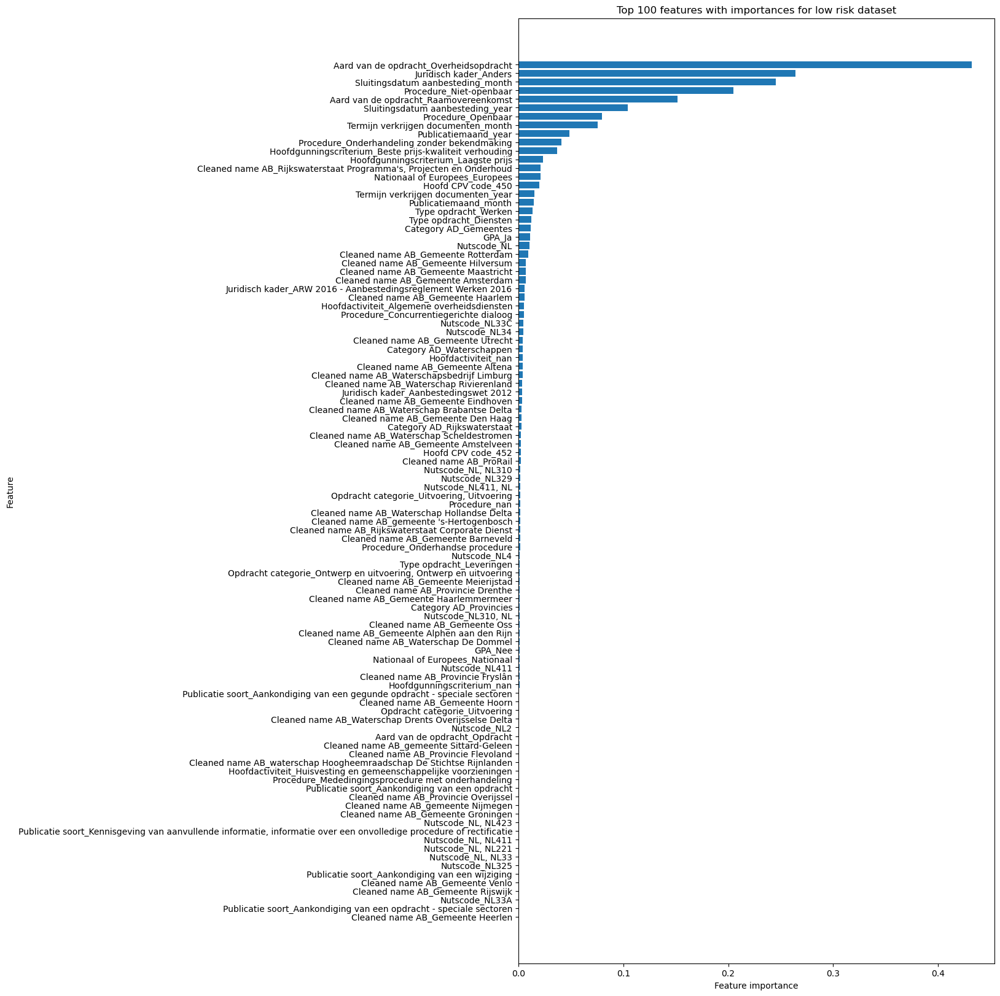

In [553]:
top_100_indices = np.argsort(importances)[::-1][:100] #take top 100

for i in top_100_indices:
    print(f"Feature: {feature_names[i]}, Importance: {importances[i]}")

top_100_features = [feature_names[i] for i in top_100_indices]
top_100_importances = [importances[i] for i in top_100_indices]

# Plot top 100
plt.figure(figsize=(10, 20))
plt.barh(top_100_features, top_100_importances)
plt.xlabel("Feature importance")
plt.ylabel("Feature")
plt.title("Top 100 features with importances for low risk dataset")
plt.gca().invert_yaxis()
plt.show()

After we need to check how much features we will take into account. We can do this by doing K-fold validation and checking which amount of features gives a good result.

In [554]:
top_feature_counts = list(range(5, 140, 10)) 
best_result = {'num_features': 0, 'avg_mse': float('inf'), 'avg_mae': float('inf'), 'avg_rmse': float('inf'), 'avg_r2': float('-inf')}
results = []

In [555]:
for top_n in top_feature_counts: # so it looks for different numbers
    top_indices = np.argsort(importances)[-top_n:][::-1]
    top_features = feature_names[top_indices]
    
    df_imputed_top_n = df_imputed[top_features.tolist() + [target_column]]
    
    kf = KFold(n_splits=10, shuffle=True, random_state=42)
    imputation_errors = []
    
    for train_index, test_index in kf.split(df_imputed_top_n):
        X_train, X_test = df_imputed_top_n.iloc[train_index].drop(columns=[target_column]), df_imputed_top_n.iloc[test_index].drop(columns=[target_column])
        y_train, y_test = df_imputed_top_n.iloc[train_index][target_column], df_imputed_top_n.iloc[test_index][target_column]
        
        hgb_imputer = HistGradientBoostingRegressor(random_state=42)
        hgb_imputer.fit(X_train, y_train)
        
        y_pred = hgb_imputer.predict(X_test)
        y_pred = np.maximum(y_pred, 0)
        
        mse = mean_squared_error(y_test, y_pred)
        mae = mean_absolute_error(y_test, y_pred)
        rmse = np.sqrt(mse)
        r2 = r2_score(y_test, y_pred)
        
        imputation_errors.append({'MSE': mse, 'MAE': mae, 'RMSE': rmse, 'R²': r2})
    
    # average calculation after the 10 fold
    avg_mse = np.mean([error['MSE'] for error in imputation_errors])
    avg_mae = np.mean([error['MAE'] for error in imputation_errors])
    avg_rmse = np.mean([error['RMSE'] for error in imputation_errors])
    avg_r2 = np.mean([error['R²'] for error in imputation_errors])
    
    print(f"Top {top_n} features gives: - Average MSE: {avg_mse}, Average MAE: {avg_mae}, Average RMSE: {avg_rmse}, Average R²: {avg_r2}")
    
    results.append({'num_features': top_n, 'avg_mse': avg_mse, 'avg_mae': avg_mae, 'avg_rmse': avg_rmse, 'avg_r2': avg_r2})
    
    if avg_mse < best_result['avg_mse']:
        best_result = {'num_features': top_n, 'avg_mse': avg_mse, 'avg_mae': avg_mae, 'avg_rmse': avg_rmse, 'avg_r2': avg_r2}

print(f"Best result: Top {best_result['num_features']} Features - Average MSE: {best_result['avg_mse']}, Average MAE: {best_result['avg_mae']}, Average RMSE: {best_result['avg_rmse']}, Average R²: {best_result['avg_r2']}")

Top 5 features gives: - Average MSE: 7.398850849444601, Average MAE: 2.110527923027264, Average RMSE: 2.7195669981387605, Average R²: 0.37537249672047895
Top 15 features gives: - Average MSE: 4.614876643872691, Average MAE: 1.5308933924406194, Average RMSE: 2.1472349451066735, Average R²: 0.6106149853554467
Top 25 features gives: - Average MSE: 4.160471501462622, Average MAE: 1.4604335002394353, Average RMSE: 2.039122582781212, Average R²: 0.6487109443116744
Top 35 features gives: - Average MSE: 3.9917819754534456, Average MAE: 1.426325546725002, Average RMSE: 1.997223147641035, Average R²: 0.6629998106408656
Top 45 features gives: - Average MSE: 3.894498966827551, Average MAE: 1.406627278393354, Average RMSE: 1.9727460090679816, Average R²: 0.6711593916990625
Top 55 features gives: - Average MSE: 3.855011095145869, Average MAE: 1.4004257583688693, Average RMSE: 1.9627141221478386, Average R²: 0.6745042048311729
Top 65 features gives: - Average MSE: 3.8024860290955886, Average MAE: 1.3

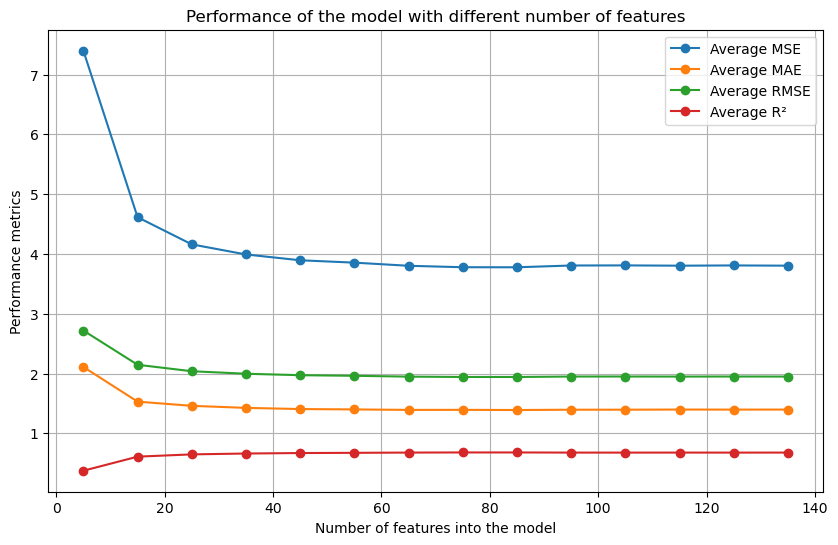

In [556]:
# visualize that so it becomes clear how it develops
results_df = pd.DataFrame(results)

plt.figure(figsize=(10, 6))
plt.plot(results_df['num_features'], results_df['avg_mse'], marker='o', label='Average MSE')
plt.plot(results_df['num_features'], results_df['avg_mae'], marker='o', label='Average MAE')
plt.plot(results_df['num_features'], results_df['avg_rmse'], marker='o', label='Average RMSE')
plt.plot(results_df['num_features'], results_df['avg_r2'], marker='o', label='Average R²')

plt.xlabel('Number of features into the model')
plt.ylabel('Performance metrics')
plt.title('Performance of the model with different number of features')
plt.legend()
plt.grid(True)
plt.show()

Now we know in this instance, we can take 95 features as best and train it on that. Really happy with this performance, now impute it in the dataset

In [557]:
best_top_n = best_result['num_features']
top_indices = np.argsort(importances)[-best_top_n:][::-1]
top_features = feature_names[top_indices]
df_imputed_top = df_imputed[top_features.tolist() + [target_column]]

In [558]:
kf = KFold(n_splits=10, shuffle=True, random_state=42)
imputation_errors = []

In [559]:
for train_index, test_index in kf.split(df_imputed_top):
    X_train, X_test = df_imputed_top.iloc[train_index].drop(columns=[target_column]), df_imputed_top.iloc[test_index].drop(columns=[target_column])
    y_train, y_test = df_imputed_top.iloc[train_index][target_column], df_imputed_top.iloc[test_index][target_column]
    
    hgb_imputer = HistGradientBoostingRegressor(random_state=42)
    hgb_imputer.fit(X_train, y_train)
    
    y_pred = hgb_imputer.predict(X_test)
    y_pred = np.maximum(y_pred, 0)
    y_pred = np.round(y_pred).astype(int)
    
    mse = mean_squared_error(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test, y_pred)
    
    print(f"Fold Results - MSE: {mse}, MAE: {mae}, RMSE: {rmse}, R²: {r2}")
    imputation_errors.append({'MSE': mse, 'MAE': mae, 'RMSE': rmse, 'R²': r2})

Fold Results - MSE: 3.6898395721925135, MAE: 1.3190730837789661, RMSE: 1.920895513085632, R²: 0.7023750637527904
Fold Results - MSE: 4.198752228163993, MAE: 1.4037433155080214, RMSE: 2.0490857054218092, R²: 0.6685254022210384
Fold Results - MSE: 3.7620320855614975, MAE: 1.396613190730838, RMSE: 1.9395958562446707, R²: 0.6860563347790591
Fold Results - MSE: 4.112299465240642, MAE: 1.4046345811051693, RMSE: 2.0278805352487215, R²: 0.6583645195910676
Fold Results - MSE: 3.8456735057983944, MAE: 1.344335414808207, RMSE: 1.9610388843157585, R²: 0.6705943210296291
Fold Results - MSE: 3.789473684210526, MAE: 1.384478144513827, RMSE: 1.9466570535691503, R²: 0.6827598170749012
Fold Results - MSE: 3.954504906333631, MAE: 1.3728813559322033, RMSE: 1.988593700667291, R²: 0.658318935596047
Fold Results - MSE: 3.4603033006244424, MAE: 1.2747546833184658, RMSE: 1.8601890497001756, R²: 0.6915689079461689
Fold Results - MSE: 4.0829616413916145, MAE: 1.3942908117752006, RMSE: 2.0206339701666938, R²: 0.6

In [560]:
avg_mse = np.mean([error['MSE'] for error in imputation_errors])
avg_mae = np.mean([error['MAE'] for error in imputation_errors])
avg_rmse = np.mean([error['RMSE'] for error in imputation_errors])
avg_r2 = np.mean([error['R²'] for error in imputation_errors])

print(f"Average MSE: {avg_mse}")
print(f"Average MAE: {avg_mae}")
print(f"Average RMSE: {avg_rmse}")
print(f"Average R²: {avg_r2}")

Average MSE: 3.8627330130819666
Average MAE: 1.3633787632318353
Average RMSE: 1.9646276700904513
Average R²: 0.6738266397897009


In [561]:
mask = df_highrisk_imputed['Aantal inschrijvingen'].isna() # create mask
X_missing = df_highrisk_imputed[mask].drop(columns=['Aantal inschrijvingen'])
X_missing = X_missing[top_features]  

In [562]:
imputed_values = hgb_imputer.predict(X_missing)  # PREDICTION
imputed_values = np.maximum(imputed_values, 0)  # no negatives
imputed_values = np.round(imputed_values).astype(int)

In [563]:
df_highrisk_imputed.loc[mask, 'Aantal inschrijvingen'] = imputed_values # insert
print(df_highrisk_imputed['Aantal inschrijvingen'].isna().sum()) # output is 0, so went correctly as i wanted

0


In [564]:
print("Before Imputation:")
print(df_highrisk['Aantal inschrijvingen'].describe())
print("After Imputation:")
print(df_highrisk_imputed['Aantal inschrijvingen'].describe())

Before Imputation:
count    11214.000000
mean         5.648832
std          3.442863
min          0.000000
25%          3.000000
50%          5.000000
75%          8.000000
max         15.000000
Name: Aantal inschrijvingen, dtype: float64
After Imputation:
count    15275.000000
mean         5.549329
std          3.200551
min          0.000000
25%          3.000000
50%          5.000000
75%          7.000000
max         15.000000
Name: Aantal inschrijvingen, dtype: float64


10903 means all NaN values are filled. I now want to add the the column to the original dataset, but indexes don't match as we can wee down here, so that needs to be sorted first.

In [565]:
print("Index of df_lowrisk:", df_highrisk.index)
print("Index of df_lowrisk_imputed:", df_highrisk_imputed.index)

Index of df_lowrisk: Index([    0,     1,     2,     3,     6,     7,     8,     9,    10,    11,
       ...
       29237, 29239, 29240, 29242, 29243, 29247, 29248, 29252, 29266, 29267],
      dtype='int64', length=15275)
Index of df_lowrisk_imputed: RangeIndex(start=0, stop=15275, step=1)


In [566]:
df_highrisk_imputed = df_highrisk_imputed.set_index(df_highrisk.index)
equal = df_highrisk.index.equals(df_highrisk_imputed.index)
print(equal)

True


In [567]:
df_highrisk.loc[:, 'Aantal inschrijvingen IMPUTED'] = df_highrisk_imputed['Aantal inschrijvingen'] # return to the old df
nan_count = df_highrisk['Aantal inschrijvingen IMPUTED'].isna().sum()
print(nan_count)

0


/var/folders/4w/2tspj8b910d0wfksxgqd4km80000gn/T/ipykernel_27675/4134220264.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_highrisk.loc[:, 'Aantal inschrijvingen IMPUTED'] = df_highrisk_imputed['Aantal inschrijvingen'] # return to the old df


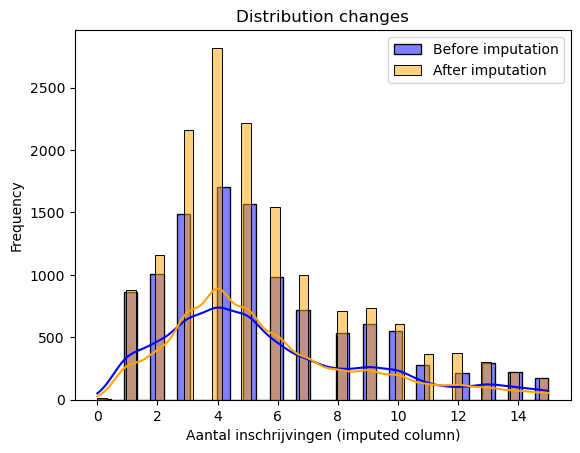

In [568]:
# distribution comparison
sns.histplot(df_highrisk['Aantal inschrijvingen'], kde=True, color='blue', label='Before imputation')
sns.histplot(df_highrisk['Aantal inschrijvingen IMPUTED'], kde=True, color='orange', label='After imputation')
plt.legend()
plt.title('Distribution changes')
plt.xlabel('Aantal inschrijvingen (imputed column)')
plt.ylabel('Frequency')
plt.show()

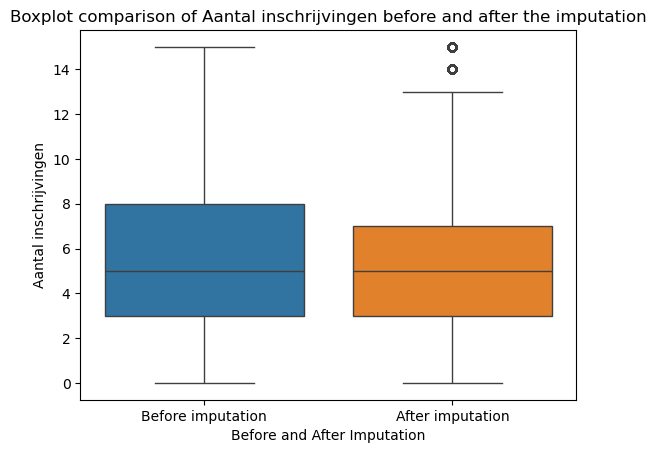

In [569]:
# boxplot
sns.boxplot(data=[df_highrisk['Aantal inschrijvingen'], df_highrisk['Aantal inschrijvingen IMPUTED']])
plt.xticks([0, 1], ['Before imputation', 'After imputation'])
plt.title('Boxplot comparison of Aantal inschrijvingen before and after the imputation')
plt.xlabel('Before and After Imputation')
plt.ylabel('Aantal inschrijvingen')
plt.show()

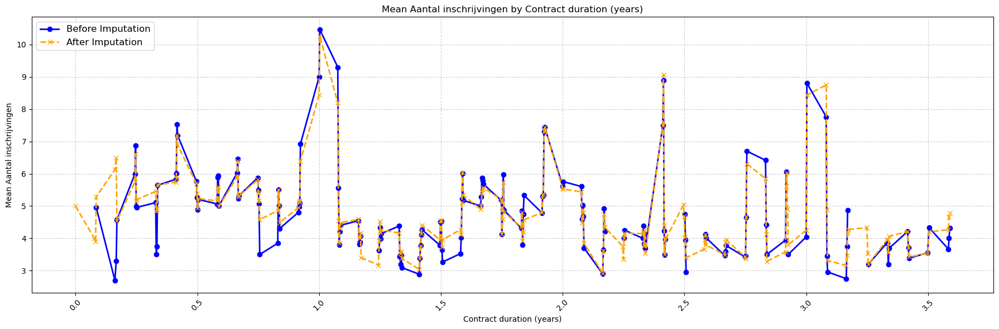

In [855]:
# Calculate means and apply rolling average
mean_before_imputation = df_highrisk.groupby('Contract duration (years)')['Aantal inschrijvingen'].mean()
mean_after_imputation = df_highrisk.groupby('Contract duration (years)')['Aantal inschrijvingen IMPUTED'].mean()

mean_before_imputation = mean_before_imputation.rolling(window=2).mean()  # Reducing window size for more points
mean_after_imputation = mean_after_imputation.rolling(window=2).mean()

# Plotting the data with more space between the points by increasing the figure size significantly
plt.figure(figsize=(18, 6))  # Significantly increasing figure width for more space between points
mean_before_imputation.plot(label='Before Imputation', color='blue', linestyle='-', linewidth=2, marker='o')
mean_after_imputation.plot(label='After Imputation', color='orange', linestyle='--', linewidth=2, marker='x')
plt.legend(loc='upper left', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)
plt.title('Mean Aantal inschrijvingen by Contract duration (years)')
plt.xlabel('Contract duration (years)')
plt.ylabel('Mean Aantal inschrijvingen')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

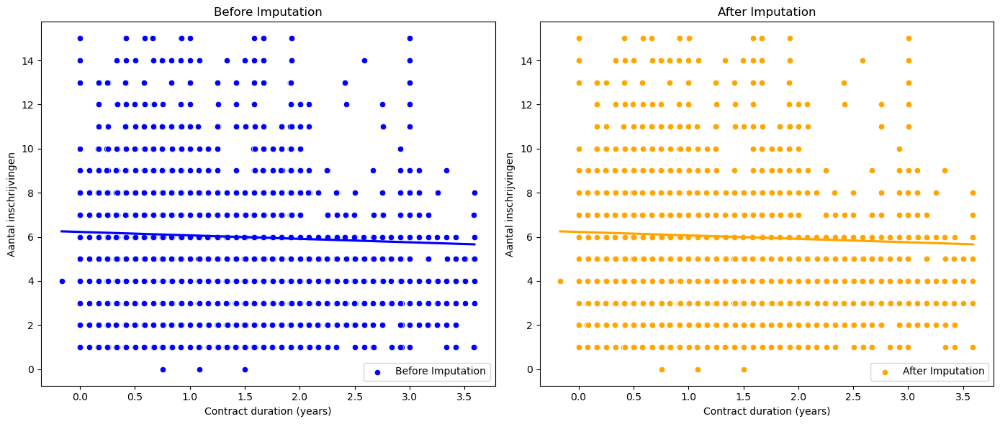

In [571]:
# Extracting the data
x_before = df_highrisk['Contract duration (years)']
y_before = df_highrisk['Aantal inschrijvingen']
x_after = df_highrisk['Contract duration (years)']
y_after = df_highrisk['Aantal inschrijvingen IMPUTED']

# Creating a figure
plt.figure(figsize=(14, 6))

# Before Imputation
plt.subplot(1, 2, 1)
sns.scatterplot(x=x_before, y=y_before, color='blue', label='Before Imputation')
sns.regplot(x=x_before, y=y_before, scatter=False, color='blue', line_kws={"label":"Linear Fit"}, ci=None)
plt.title('Before Imputation')
plt.xlabel('Contract duration (years)')
plt.ylabel('Aantal inschrijvingen')
plt.legend()

# After Imputation
plt.subplot(1, 2, 2)
sns.scatterplot(x=x_after, y=y_after, color='orange', label='After Imputation')
sns.regplot(x=x_after, y=y_after, scatter=False, color='orange', line_kws={"label":"Linear Fit"}, ci=None)
plt.title('After Imputation')
plt.xlabel('Contract duration (years)')
plt.ylabel('Aantal inschrijvingen')
plt.legend()

plt.tight_layout()
plt.show()

In [572]:
# save it in a seprate variable
df_highrisk_imputated_inschrijvingen = df_highrisk.copy()

In the visualisations we see little difference with the old data, which means that the imputation didn't adjust the old data's structure which is good for our analysis.

## Impute using HistGBoost (Contract duration)

Use the imputed values for aantal inschrijvingen, because the correlation is not zero eventhough it is weak its better to keep the consistency across the imputation process

In [715]:
df_highrisk = df_highrisk_imputated_inschrijvingen.copy()

In [716]:
nominal_columns = [
    'Publicatiemaand', 'Publicatiemaand_kwartaal', 
    'Sluitingsdatum aanbesteding_kwartaal', 'Termijn verkrijgen documenten_kwartaal', 
    'Cleaned name AB', 'Category AD', 'Sluitingsdatum aanbesteding', 'Termijn verkrijgen documenten', 
    'Verzending uitnodigingen', 'Tegen betaling documenten verkrijgen', 
    'Personen aanwezig opening kluis', 'Nationaal of Europees', 
    'Publicatie soort', 'Juridisch kader', 'Type opdracht', 
    'Procedure', 'Hoofd CPV code', 'Opdracht categorie', 
    'Nutscode', 'Aard van de opdracht', 'GPA', 'Hoofdactiviteit', 
    'Hoofdgunningscriterium', 'Aantal inschrijvingen IMPUTED'
]

In [717]:
df = df_highrisk.loc[:, nominal_columns]

df['Contract duration (years)'] = df_highrisk['Contract duration (years)']

In [718]:
df_highrisk.columns

Index(['Id publicatie', 'Tenderned kenmerk', 'Publicatiemaand',
       'Publicatiemaand_kwartaal', 'Publicatiemaand_jaar',
       'Naam Aanbestedende dienst', 'Cleaned name AB', 'Category AD',
       'Nationaal identificatienummer', 'Naam aanbesteding', 'URL TenderNed',
       'Geimporteerd', 'Tsender', 'Aanbesteding id',
       'Sluitingsdatum aanmelding', 'Sluitingsdatum aanmelding_kwartaal',
       'Sluitingsdatum aanmelding_jaar', 'Sluitingsdatum aanbesteding',
       'Sluitingsdatum aanbesteding_kwartaal',
       'Sluitingsdatum aanbesteding_jaar', 'Aanvang opdracht',
       'Aanvang opdracht_kwartaal', 'Aanvang opdracht_jaar',
       'Voltooiing opdracht', 'Voltooiing opdracht_kwartaal',
       'Voltooiing opdracht_jaar', 'Termijn verkrijgen documenten',
       'Termijn verkrijgen documenten_kwartaal',
       'Termijn verkrijgen documenten_jaar', 'Verzending uitnodigingen',
       'Verzending uitnodigingen_kwartaal', 'Verzending uitnodigingen_jaar',
       'Tegen betaling documen

In [719]:
data_types = df.dtypes
grouped_by_dtype = {dtype: list(data_types[data_types == dtype].index) for dtype in data_types.unique()} # useful to know what datatypes, for the ML model later

for dtype, columns in grouped_by_dtype.items():
    print(f"{dtype}: {columns}")

datetime64[ns]: ['Publicatiemaand', 'Sluitingsdatum aanbesteding', 'Termijn verkrijgen documenten', 'Verzending uitnodigingen']
period[Q-DEC]: ['Publicatiemaand_kwartaal', 'Sluitingsdatum aanbesteding_kwartaal', 'Termijn verkrijgen documenten_kwartaal']
object: ['Cleaned name AB', 'Category AD', 'Tegen betaling documenten verkrijgen', 'Personen aanwezig opening kluis', 'Nationaal of Europees', 'Publicatie soort', 'Juridisch kader', 'Type opdracht', 'Procedure', 'Hoofd CPV code', 'Opdracht categorie', 'Nutscode', 'Aard van de opdracht', 'GPA', 'Hoofdactiviteit', 'Hoofdgunningscriterium']
float64: ['Aantal inschrijvingen IMPUTED', 'Contract duration (years)']


Because we have many different data types, we need to make them numerical as this helps for ML model.

In [720]:
datetime_cols = [
    'Publicatiemaand', 'Sluitingsdatum aanbesteding',
    'Termijn verkrijgen documenten'
]

for col in datetime_cols:
    df[col] = pd.to_datetime(df[col], format='%d-%m-%Y', errors='coerce')
    df[col + '_year'] = df[col].dt.year
    df[col + '_month'] = df[col].dt.month
    df[col + '_day'] = df[col].dt.day
    df.drop(columns=col, inplace=True)

period_cols = [
    'Publicatiemaand_kwartaal', 'Sluitingsdatum aanbesteding_kwartaal', 
    'Termijn verkrijgen documenten_kwartaal'
]
placeholder_period = '1900Q1'

for col in period_cols:
    df[col] = df[col].fillna(placeholder_period).astype(str)
    df[col + '_year'] = df[col].str[:4].astype(int)
    df[col + '_quarter'] = df[col].str[5:].astype(int)
    df.drop(columns=col, inplace=True)

categorical_cols = [
    'Cleaned name AB', 'Category AD', 'Verzending uitnodigingen', 
    'Tegen betaling documenten verkrijgen', 'Personen aanwezig opening kluis', 
    'Nationaal of Europees', 'Publicatie soort', 'Juridisch kader', 
    'Type opdracht', 'Procedure', 'Opdracht categorie', 
    'Nutscode', 'Aard van de opdracht', 'GPA', 'Hoofdactiviteit', 
    'Hoofdgunningscriterium', 'Hoofd CPV code'
]

# One-hot encode 
encoder = OneHotEncoder(sparse_output=False, handle_unknown='ignore')
encoded_features = encoder.fit_transform(df[categorical_cols])
encoded_df = pd.DataFrame(encoded_features, columns=encoder.get_feature_names_out(categorical_cols)) # one hot encoding

df.drop(columns=categorical_cols, inplace=True)
df = pd.concat([df.reset_index(drop=True), encoded_df.reset_index(drop=True)], axis=1)

In [721]:
# check if the transition was succesful
data_types = df.dtypes
grouped_by_dtype = {dtype: list(data_types[data_types == dtype].index) for dtype in data_types.unique()}

# display the grouped columns by data type
for dtype, columns in grouped_by_dtype.items():
    print(f"{dtype}: {columns}")

float64: ['Aantal inschrijvingen IMPUTED', 'Contract duration (years)', 'Sluitingsdatum aanbesteding_year', 'Sluitingsdatum aanbesteding_month', 'Sluitingsdatum aanbesteding_day', 'Termijn verkrijgen documenten_year', 'Termijn verkrijgen documenten_month', 'Termijn verkrijgen documenten_day', 'Cleaned name AB_ABG-organisatie', 'Cleaned name AB_BAR-gemeente', 'Cleaned name AB_Bestuurscentrum Gemeente Meerssen', 'Cleaned name AB_Bizob', 'Cleaned name AB_Gemeenschappelijke Regeling Nieuw Reijerwaard', 'Cleaned name AB_Gemeenschappelijke regeling Veiligheidsregio Brabant-Noord, onderdeel Brandweer', 'Cleaned name AB_Gemeente Aa en Hunze', 'Cleaned name AB_Gemeente Aalsmeer', 'Cleaned name AB_Gemeente Alblasserdam', 'Cleaned name AB_Gemeente Alkmaar', 'Cleaned name AB_Gemeente Almelo', 'Cleaned name AB_Gemeente Almere', 'Cleaned name AB_Gemeente Alphen aan den Rijn', 'Cleaned name AB_Gemeente Alphen-Chaam', 'Cleaned name AB_Gemeente Altena', 'Cleaned name AB_Gemeente Ameland', 'Cleaned name

Now we are going to impute the data. The model I chose is the gradient booster, because it can take both categorical and numerical data, but mainly because it can handle missing data. Some of the features also have missing data.

In [722]:
print(df_highrisk['Contract duration (years)'].describe())

count    7304.000000
mean        1.370821
std         0.784556
min        -0.167123
25%         0.832877
50%         1.167123
75%         1.917808
max         3.589041
Name: Contract duration (years), dtype: float64


### Imputate Contract duration (years)

In [723]:
target_column = 'Contract duration (years)'
df_imputed = df.copy()
df_highrisk_imputed = df.copy()

df_imputed = df_imputed.dropna(subset=[target_column]) # skip rows where the target column is missing

#### Feature importance

Since we did one-hot encoding, the df_imputed has many columns and therefore also many many features to take into account. However, taking them all into account makes the model too complex (curse of dimensionality).

In [724]:
df_imputed.shape # 993 features, pfew

(7304, 938)

In [725]:
X_train, X_test, y_train, y_test = train_test_split(df_imputed.drop(columns=[target_column]), df_imputed[target_column], test_size=0.2, random_state=42) #first train the model on the whole dataset
hgb_imputer = HistGradientBoostingRegressor(random_state=42)
hgb_imputer.fit(X_train, y_train)

HistGradientBoostingRegressor(random_state=42)

In [726]:
feature_names = X_train.columns 
n_repeats = 10

def calculate_permutation_importance(model, X, y, n_repeats, random_state=42):
    print("Starting calculation")
    
    start_time = time.time()
    importances = np.zeros((n_repeats, X.shape[1]))
    
    for i in tqdm(range(n_repeats), desc="Repeats"):
        result = permutation_importance(model, X, y, n_repeats=1, random_state=random_state + i, n_jobs=-1)
        importances[i, :] = result.importances[:, 0]
        print(f"Round {i+1}/{n_repeats} done")
    
    end_time = time.time()
    elapsed_time = end_time - start_time
    print(f"Total time taken: {elapsed_time:.2f} seconds")
    
    mean_importances = importances.mean(axis=0)
    return mean_importances

In [727]:
importances = calculate_permutation_importance(hgb_imputer, X_train, y_train, n_repeats) # actual function

Starting calculation


Repeats:  10%|█         | 1/10 [00:20<03:03, 20.44s/it]

Round 1/10 done


Repeats:  20%|██        | 2/10 [00:41<02:45, 20.63s/it]

Round 2/10 done


Repeats:  30%|███       | 3/10 [00:56<02:07, 18.21s/it]

Round 3/10 done


Repeats:  40%|████      | 4/10 [01:12<01:43, 17.19s/it]

Round 4/10 done


Repeats:  50%|█████     | 5/10 [01:26<01:21, 16.25s/it]

Round 5/10 done


Repeats:  60%|██████    | 6/10 [01:40<01:02, 15.50s/it]

Round 6/10 done


Repeats:  70%|███████   | 7/10 [01:55<00:45, 15.25s/it]

Round 7/10 done


Repeats:  80%|████████  | 8/10 [02:12<00:31, 15.75s/it]

Round 8/10 done


Repeats:  90%|█████████ | 9/10 [02:27<00:15, 15.66s/it]

Round 9/10 done


Repeats: 100%|██████████| 10/10 [02:43<00:00, 16.38s/it]

Round 10/10 done
Total time taken: 163.85 seconds


Feature: Nationaal of Europees_Europees, Importance: 0.3470290578979257
Feature: Aantal inschrijvingen IMPUTED, Importance: 0.16252396673747882
Feature: Aard van de opdracht_Overheidsopdracht, Importance: 0.12664258013484658
Feature: Sluitingsdatum aanbesteding_year, Importance: 0.11617146329509305
Feature: Sluitingsdatum aanbesteding_month, Importance: 0.06860163769807856
Feature: Publicatiemaand_year, Importance: 0.06627132943698916
Feature: Termijn verkrijgen documenten_month, Importance: 0.051640704368106013
Feature: Publicatiemaand_month, Importance: 0.04390204450872089
Feature: Termijn verkrijgen documenten_year, Importance: 0.037167407857354506
Feature: Aard van de opdracht_Raamovereenkomst, Importance: 0.021617875350686176
Feature: Procedure_Openbaar, Importance: 0.020435003216482794
Feature: Hoofd CPV code_450, Importance: 0.018787242831256646
Feature: Category AD_Provincies, Importance: 0.018042773198259476
Feature: Nutscode_NL, Importance: 0.016792718778808068
Feature: Categ

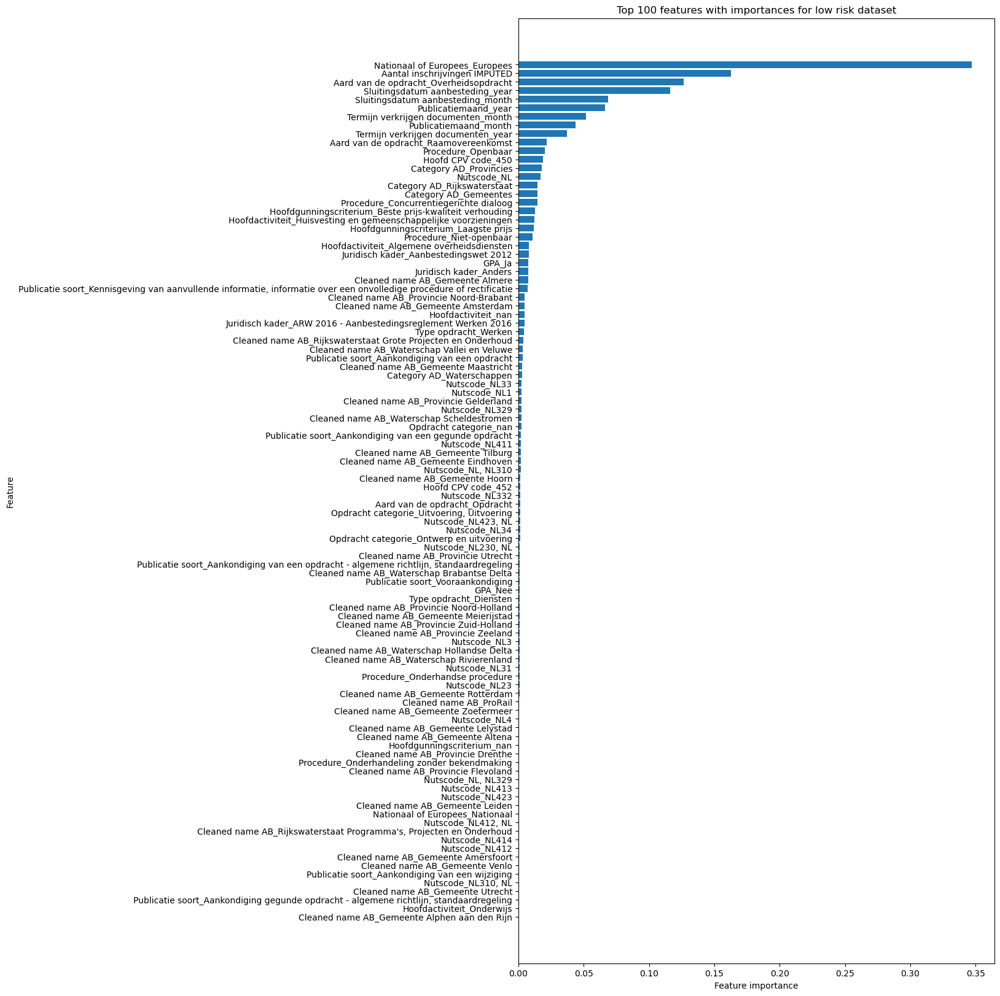

In [728]:
top_100_indices = np.argsort(importances)[::-1][:100] #take top 100

for i in top_100_indices:
    print(f"Feature: {feature_names[i]}, Importance: {importances[i]}")

top_100_features = [feature_names[i] for i in top_100_indices]
top_100_importances = [importances[i] for i in top_100_indices]

# plot top 100
plt.figure(figsize=(10, 20))
plt.barh(top_100_features, top_100_importances)
plt.xlabel("Feature importance")
plt.ylabel("Feature")
plt.title("Top 100 features with importances for low risk dataset")
plt.gca().invert_yaxis()
plt.show()

After we need to check how much features we will take into account. We can do this by doing K-fold validation and checking which amount of features gives a good result.

In [729]:
top_feature_counts = list(range(5, 140, 5)) 
best_result = {'num_features': 0, 'avg_mse': float('inf'), 'avg_mae': float('inf'), 'avg_rmse': float('inf'), 'avg_r2': float('-inf')}
results = []

In [730]:
for top_n in top_feature_counts: # so it looks for different numbers
    top_indices = np.argsort(importances)[-top_n:][::-1]
    top_features = feature_names[top_indices]
    
    df_imputed_top_n = df_imputed[top_features.tolist() + [target_column]]
    
    kf = KFold(n_splits=10, shuffle=True, random_state=42)
    imputation_errors = []
    
    for train_index, test_index in kf.split(df_imputed_top_n):
        X_train, X_test = df_imputed_top_n.iloc[train_index].drop(columns=[target_column]), df_imputed_top_n.iloc[test_index].drop(columns=[target_column])
        y_train, y_test = df_imputed_top_n.iloc[train_index][target_column], df_imputed_top_n.iloc[test_index][target_column]
        
        hgb_imputer = HistGradientBoostingRegressor(random_state=42)
        hgb_imputer.fit(X_train, y_train)
        
        y_pred = hgb_imputer.predict(X_test)
        y_pred = np.maximum(y_pred, 0)
        
        mse = mean_squared_error(y_test, y_pred)
        mae = mean_absolute_error(y_test, y_pred)
        rmse = np.sqrt(mse)
        r2 = r2_score(y_test, y_pred)
        
        imputation_errors.append({'MSE': mse, 'MAE': mae, 'RMSE': rmse, 'R²': r2})
    
    # average calculation after the 10 fold
    avg_mse = np.mean([error['MSE'] for error in imputation_errors])
    avg_mae = np.mean([error['MAE'] for error in imputation_errors])
    avg_rmse = np.mean([error['RMSE'] for error in imputation_errors])
    avg_r2 = np.mean([error['R²'] for error in imputation_errors])
    
    print(f"Top {top_n} features gives: - Average MSE: {avg_mse}, Average MAE: {avg_mae}, Average RMSE: {avg_rmse}, Average R²: {avg_r2}")
    
    results.append({'num_features': top_n, 'avg_mse': avg_mse, 'avg_mae': avg_mae, 'avg_rmse': avg_rmse, 'avg_r2': avg_r2})
    
    if avg_mse < best_result['avg_mse']:
        best_result = {'num_features': top_n, 'avg_mse': avg_mse, 'avg_mae': avg_mae, 'avg_rmse': avg_rmse, 'avg_r2': avg_r2}

print(f"Best result: Top {best_result['num_features']} Features - Average MSE: {best_result['avg_mse']}, Average MAE: {best_result['avg_mae']}, Average RMSE: {best_result['avg_rmse']}, Average R²: {best_result['avg_r2']}")

Top 5 features gives: - Average MSE: 0.3439572281505417, Average MAE: 0.4126311925735588, Average RMSE: 0.5863651541787208, Average R²: 0.440618713023414
Top 10 features gives: - Average MSE: 0.32747597250738003, Average MAE: 0.3965337976141396, Average RMSE: 0.5720558389110264, Average R²: 0.4672840941891209
Top 15 features gives: - Average MSE: 0.29751885026404395, Average MAE: 0.3748966850373022, Average RMSE: 0.5451680317356971, Average R²: 0.5159288637992053
Top 20 features gives: - Average MSE: 0.2889790356769219, Average MAE: 0.3675872718758658, Average RMSE: 0.5372566628680456, Average R²: 0.5297548640733565
Top 25 features gives: - Average MSE: 0.2796184682864308, Average MAE: 0.3617349777225801, Average RMSE: 0.528480390565909, Average R²: 0.5450810674555442
Top 30 features gives: - Average MSE: 0.2785908644884846, Average MAE: 0.36193961980837697, Average RMSE: 0.5275010030205215, Average R²: 0.5466372411341757
Top 35 features gives: - Average MSE: 0.2742964370773435, Averag

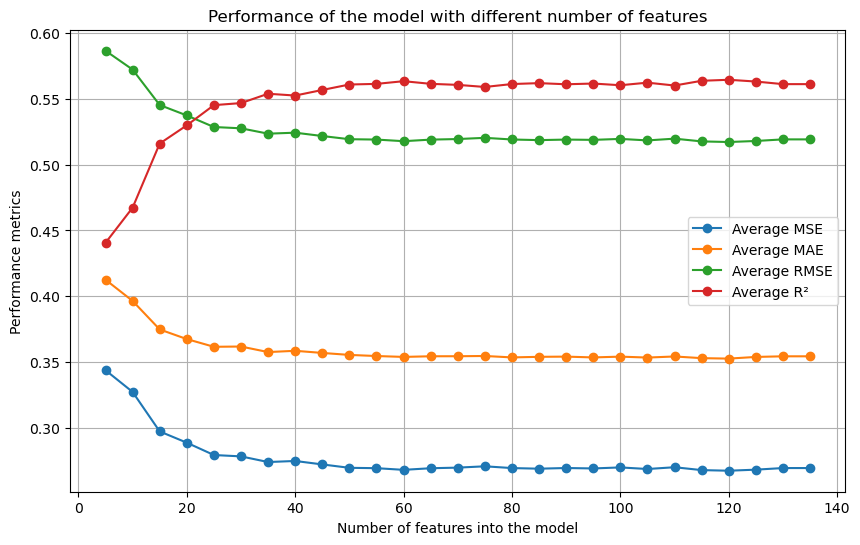

In [731]:
# visualize that so it becomes clear how it develops
results_df = pd.DataFrame(results)

plt.figure(figsize=(10, 6))
plt.plot(results_df['num_features'], results_df['avg_mse'], marker='o', label='Average MSE')
plt.plot(results_df['num_features'], results_df['avg_mae'], marker='o', label='Average MAE')
plt.plot(results_df['num_features'], results_df['avg_rmse'], marker='o', label='Average RMSE')
plt.plot(results_df['num_features'], results_df['avg_r2'], marker='o', label='Average R²')

plt.xlabel('Number of features into the model')
plt.ylabel('Performance metrics')
plt.title('Performance of the model with different number of features')
plt.legend()
plt.grid(True)
plt.show()

Now we know in this instance, we can take 95 features as best and train it on that. Really happy with this performance, now impute it in the dataset

In [732]:
best_top_n = best_result['num_features']
top_indices = np.argsort(importances)[-best_top_n:][::-1]
top_features = feature_names[top_indices]
df_imputed_top = df_imputed[top_features.tolist() + [target_column]]

In [733]:
kf = KFold(n_splits=10, shuffle=True, random_state=42)
imputation_errors = []

In [734]:
for train_index, test_index in kf.split(df_imputed_top):
    X_train, X_test = df_imputed_top.iloc[train_index].drop(columns=[target_column]), df_imputed_top.iloc[test_index].drop(columns=[target_column])
    y_train, y_test = df_imputed_top.iloc[train_index][target_column], df_imputed_top.iloc[test_index][target_column]
    
    hgb_imputer = HistGradientBoostingRegressor(random_state=42)
    hgb_imputer.fit(X_train, y_train)
    
    y_pred = hgb_imputer.predict(X_test)
    y_pred = np.maximum(y_pred, 0)
    
    mse = mean_squared_error(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test, y_pred)
    
    print(f"Fold Results - MSE: {mse}, MAE: {mae}, RMSE: {rmse}, R²: {r2}")
    imputation_errors.append({'MSE': mse, 'MAE': mae, 'RMSE': rmse, 'R²': r2})

Fold Results - MSE: 0.2881152203597294, MAE: 0.3654709474446902, RMSE: 0.5367636540971542, R²: 0.5183026703577511
Fold Results - MSE: 0.2476548715844818, MAE: 0.34474220323449895, RMSE: 0.49764934601030253, R²: 0.5952568548119515
Fold Results - MSE: 0.2488914456717857, MAE: 0.35063593481740174, RMSE: 0.4988902140469241, R²: 0.5885771018485109
Fold Results - MSE: 0.26943701954172966, MAE: 0.3408380652676934, RMSE: 0.5190732313862174, R²: 0.5546382205968385
Fold Results - MSE: 0.2937080755928079, MAE: 0.3707044829104195, RMSE: 0.5419484067628652, R²: 0.519254212222122
Fold Results - MSE: 0.29511240901329827, MAE: 0.3609333900433667, RMSE: 0.5432424955885707, R²: 0.5324146192410966
Fold Results - MSE: 0.26281813790939584, MAE: 0.3462970299775843, RMSE: 0.5126579150948475, R²: 0.5878675526997649
Fold Results - MSE: 0.24292930311587155, MAE: 0.337378499596883, RMSE: 0.49287858861576805, R²: 0.6186073607248881
Fold Results - MSE: 0.25527925219405345, MAE: 0.35022830709731445, RMSE: 0.5052516

In [735]:
avg_mse = np.mean([error['MSE'] for error in imputation_errors])
avg_mae = np.mean([error['MAE'] for error in imputation_errors])
avg_rmse = np.mean([error['RMSE'] for error in imputation_errors])
avg_r2 = np.mean([error['R²'] for error in imputation_errors])

print(f"Average MSE: {avg_mse}")
print(f"Average MAE: {avg_mae}")
print(f"Average RMSE: {avg_rmse}")
print(f"Average R²: {avg_r2}")

Average MSE: 0.2677089725029327
Average MAE: 0.3527686475389962
Average RMSE: 0.517098731577194
Average R²: 0.5643230967214473


In [736]:
mask = df_highrisk_imputed['Contract duration (years)'].isna() # create mask
X_missing = df_highrisk_imputed[mask].drop(columns=['Contract duration (years)'])
X_missing = X_missing[top_features]  

In [737]:
imputed_values = hgb_imputer.predict(X_missing)  # PREDICTION
imputed_values = np.maximum(imputed_values, 0)  # no negatives

In [738]:
df_highrisk_imputed.loc[mask, 'Contract duration (years)'] = imputed_values # insert
print(df_highrisk_imputed['Contract duration (years)'].isna().sum()) # output is 0, so went correctly as i wanted

0


In [739]:
print("Before Imputation:")
print(df_highrisk['Contract duration (years)'].describe())
print("After Imputation:")
print(df_highrisk_imputed['Contract duration (years)'].describe())

Before Imputation:
count    7304.000000
mean        1.370821
std         0.784556
min        -0.167123
25%         0.832877
50%         1.167123
75%         1.917808
max         3.589041
Name: Contract duration (years), dtype: float64
After Imputation:
count    15275.000000
mean         1.461469
std          0.665167
min         -0.167123
25%          1.000000
50%          1.476842
75%          1.917712
max          3.589041
Name: Contract duration (years), dtype: float64


10903 means all NaN values are filled. I now want to add the the column to the original dataset, but indexes don't match as we can wee down here, so that needs to be sorted first.

In [740]:
print("Index of df_lowrisk:", df_highrisk.index)
print("Index of df_lowrisk_imputed:", df_highrisk_imputed.index)

Index of df_lowrisk: Index([    0,     1,     2,     3,     6,     7,     8,     9,    10,    11,
       ...
       29237, 29239, 29240, 29242, 29243, 29247, 29248, 29252, 29266, 29267],
      dtype='int64', length=15275)
Index of df_lowrisk_imputed: RangeIndex(start=0, stop=15275, step=1)


In [741]:
df_highrisk_imputed = df_highrisk_imputed.set_index(df_highrisk.index)
equal = df_highrisk.index.equals(df_highrisk_imputed.index)
print(equal)

True


In [742]:
df_highrisk.loc[:, 'Contract duration (years) IMPUTED'] = df_highrisk_imputed['Contract duration (years)'] # return to the old df
nan_count = df_highrisk['Contract duration (years) IMPUTED'].isna().sum()
print(nan_count)

0


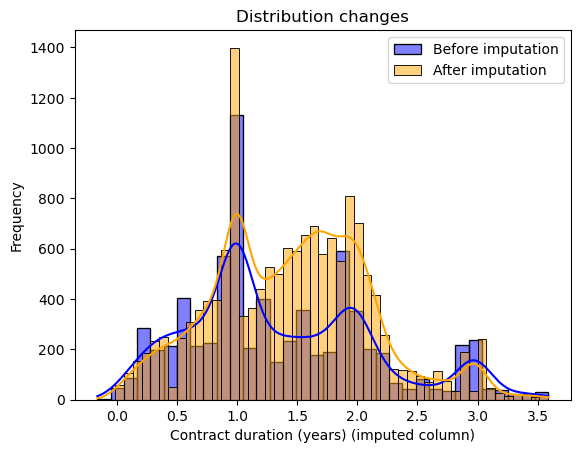

In [743]:
# distribution comparison
sns.histplot(df_highrisk['Contract duration (years)'], kde=True, color='blue', label='Before imputation')
sns.histplot(df_highrisk['Contract duration (years) IMPUTED'], kde=True, color='orange', label='After imputation')
plt.legend()
plt.title('Distribution changes')
plt.xlabel('Contract duration (years) (imputed column)')
plt.ylabel('Frequency')
plt.show()

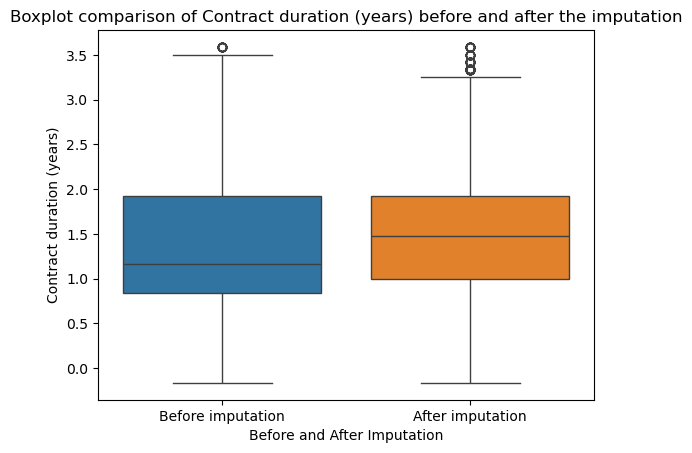

In [744]:
# boxplot
sns.boxplot(data=[df_highrisk['Contract duration (years)'], df_highrisk['Contract duration (years) IMPUTED']])
plt.xticks([0, 1], ['Before imputation', 'After imputation'])
plt.title('Boxplot comparison of Contract duration (years) before and after the imputation')
plt.xlabel('Before and After Imputation')
plt.ylabel('Contract duration (years)')
plt.show()

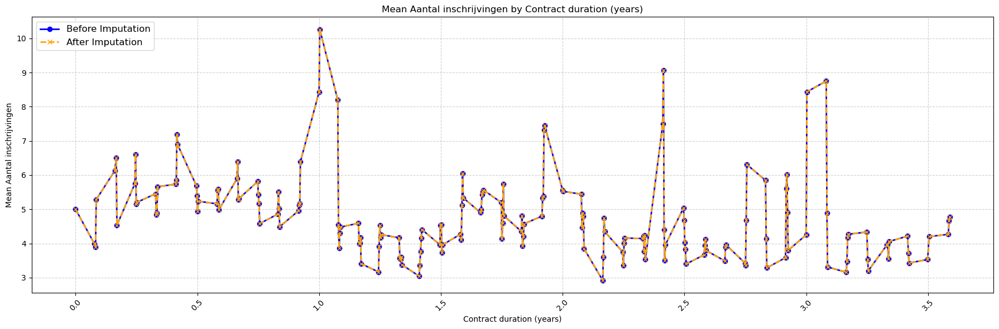

In [853]:
common_durations = set(df_highrisk['Contract duration (years)']).intersection(df_highrisk['Contract duration (years) IMPUTED'])

df_before_imputation = df_highrisk[df_highrisk['Contract duration (years)'].isin(common_durations)]
df_after_imputation = df_highrisk[df_highrisk['Contract duration (years) IMPUTED'].isin(common_durations)]

mean_before_imputation = df_before_imputation.groupby('Contract duration (years)')['Aantal inschrijvingen IMPUTED'].mean()
mean_after_imputation = df_after_imputation.groupby('Contract duration (years) IMPUTED')['Aantal inschrijvingen IMPUTED'].mean()

mean_before_imputation = mean_before_imputation.rolling(window=2).mean()
mean_after_imputation = mean_after_imputation.rolling(window=2).mean()

plt.figure(figsize=(18, 6))  # Significantly increasing figure width for more space between points
mean_before_imputation.plot(label='Before Imputation', color='blue', linestyle='-', linewidth=2, marker='o')
mean_after_imputation.plot(label='After Imputation', color='orange', linestyle='--', linewidth=2, marker='x')
plt.legend(loc='upper left', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)
plt.title('Mean Aantal inschrijvingen by Contract duration (years)')
plt.xlabel('Contract duration (years)')
plt.ylabel('Mean Aantal inschrijvingen')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

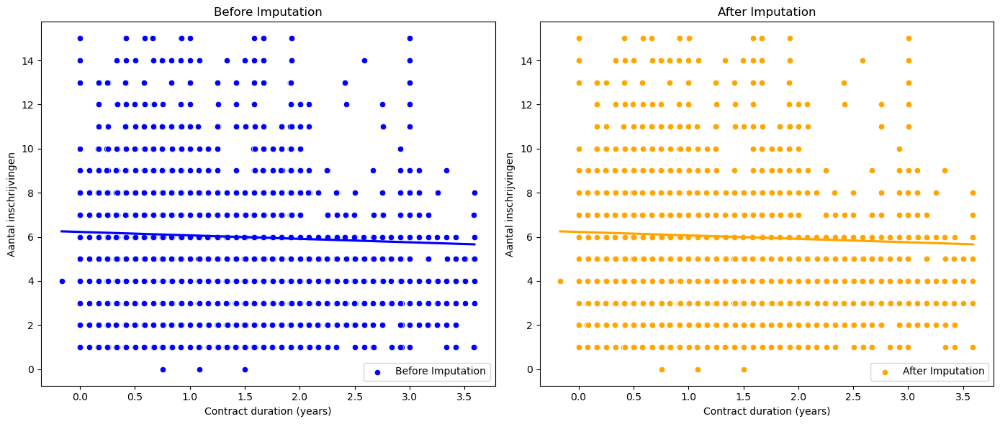

In [746]:
# extract data
x_before = df_highrisk['Contract duration (years)']
y_before = df_highrisk['Aantal inschrijvingen IMPUTED']
x_after = df_highrisk['Contract duration (years)']
y_after = df_highrisk['Aantal inschrijvingen IMPUTED']

# create figure
plt.figure(figsize=(14, 6))

# before Imputation
plt.subplot(1, 2, 1)
sns.scatterplot(x=x_before, y=y_before, color='blue', label='Before Imputation')
sns.regplot(x=x_before, y=y_before, scatter=False, color='blue', line_kws={"label":"Linear Fit"}, ci=None)
plt.title('Before Imputation')
plt.xlabel('Contract duration (years)')
plt.ylabel('Aantal inschrijvingen')
plt.legend()

# after Imputation
plt.subplot(1, 2, 2)
sns.scatterplot(x=x_after, y=y_after, color='orange', label='After Imputation')
sns.regplot(x=x_after, y=y_after, scatter=False, color='orange', line_kws={"label":"Linear Fit"}, ci=None)
plt.title('After Imputation')
plt.xlabel('Contract duration (years)')
plt.ylabel('Aantal inschrijvingen')
plt.legend()

plt.tight_layout()
plt.show()

In [747]:
df_highrisk_hg = df_highrisk.copy()

In the visualisations we see little difference with the old data, which means that the imputation didn't adjust the old data's structure which is good for our analysis.

# Data exploration

Data exploration across the whole dataset

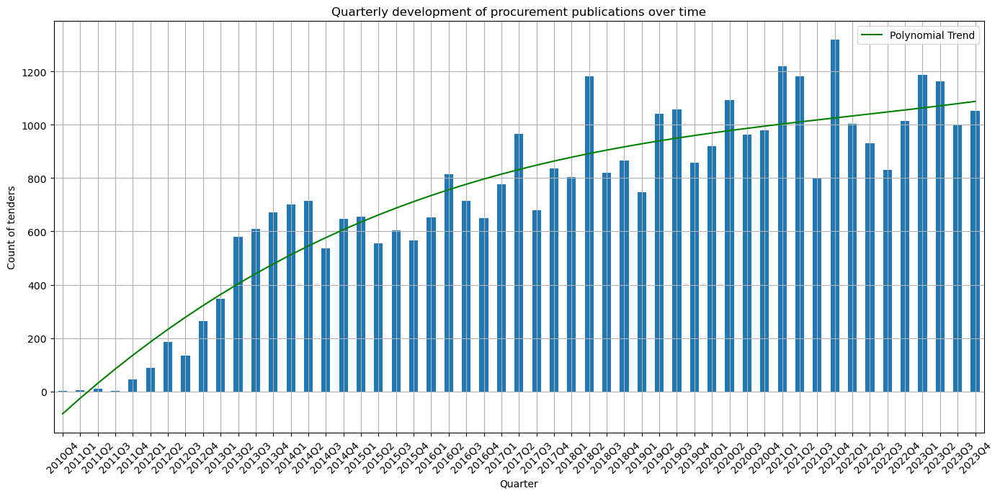

In [748]:
# before delving deep in the data, lets look at some general things
quarterly = df_tenderned.groupby('Publicatiemaand_kwartaal').size()
quarterly = quarterly.sort_index() #grouping, couod also do 

# PLOT
fig, ax = plt.subplots(figsize=(14,7))
quarterly.plot(kind='bar')
ax.set_title('Quarterly development of procurement publications over time')
ax.set_xlabel('Quarter')
ax.set_ylabel('Count of tenders')


# addition of trend line to suppor our statementd, went for polynomial fit instead of trend line because it is smoother
x_coords = np.arange(len(quarterly))

polynomial = np.polyfit(x=x_coords, y=quarterly, deg=3)
trend_poly = np.polyval(polynomial, x_coords)

# plot trend line
ax.plot(x_coords, trend_poly, color='Green', label='Polynomial Trend')
ax.set_xticks(x_coords)
ax.set_xticklabels([str(p) for p in quarterly.index], rotation=45)
ax.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

More and more tenders over time in total. Discussed this with RWS, and those confirm it. This is because organizations tend to become more and more transaparant in their procurement assignments

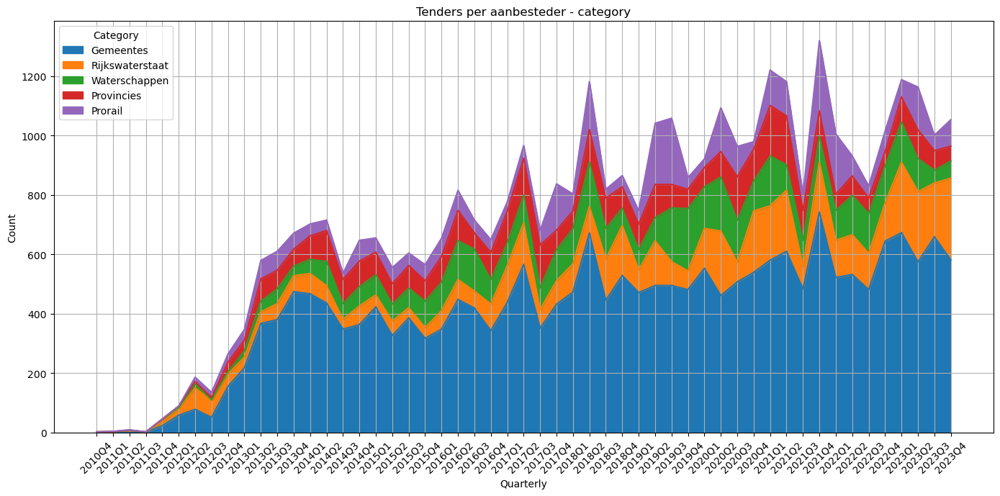

In [749]:
df_grouped = df_tenderned.groupby(['Publicatiemaand_kwartaal', 'Category AD']).size().reset_index(name='counts') # group the categories per half year
df_pivot = df_grouped.pivot(index='Publicatiemaand_kwartaal', columns='Category AD', values='counts')
df_pivot.index = df_pivot.index.astype(str) # convert index to string

# for ordering from highest to lowest, useful for figure
category_totals = df_pivot.sum().sort_values(ascending=False)
df_pivot_sorted = df_pivot[category_totals.index]

# Plot
fig, ax = plt.subplots(figsize=(14, 7))
df_pivot_sorted.plot(kind='area', stacked=True, ax=ax)
x_coords = np.arange(len(df_pivot.index))
ax.set_xticks(x_coords)
ax.set_xticklabels(df_pivot_sorted.index, rotation=45)
ax.set_xlabel('Quarterly')
ax.set_ylabel('Count')
ax.set_title('Tenders per aanbesteder - category')
plt.grid(True)
ax.legend(title='Category', loc='upper left')
plt.tight_layout()
plt.show()

We have mapped the procurers by different categories to get a bette view of who is the most active in the field, we will visualize this more.

Gemeentes are really active, which is not surprise, but also Rijkswaterstaat. Now we will look at individual players instead of categories.

In [750]:
top_5_aanbesteders = df_tenderned['Cleaned name AB'].value_counts().nlargest(5)
print(top_5_aanbesteders)
# PPO is on top

Cleaned name AB
ProRail                                                3485
Rijkswaterstaat Programma's, Projecten en Onderhoud    3384
Gemeente Amsterdam                                     1716
Gemeente Rotterdam                                     1231
Gemeente Den Haag                                      1067
Name: count, dtype: int64


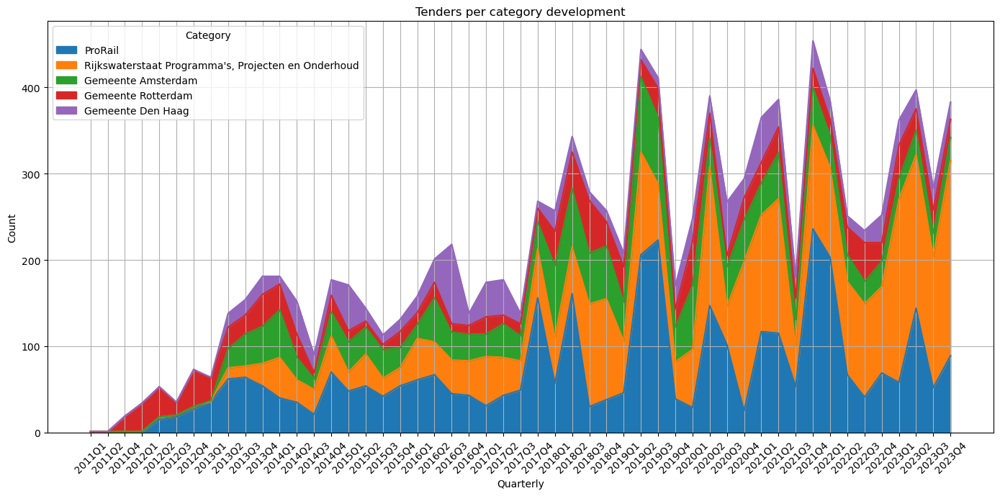

In [751]:
df_top5 = df_tenderned[df_tenderned['Cleaned name AB'].isin(top_5_aanbesteders.index)]

df_grouped = df_top5.groupby(['Publicatiemaand_kwartaal', 'Cleaned name AB']).size().reset_index(name='counts') # group the categories per half year
df_pivot = df_grouped.pivot(index='Publicatiemaand_kwartaal', columns='Cleaned name AB', values='counts')
df_pivot.index = df_pivot.index.astype(str) # convert index to string

# for ordering from highest to lowest, useful for figure
category_totals = df_pivot.sum().sort_values(ascending=False)
df_pivot_sorted = df_pivot[category_totals.index]

# Plot
fig, ax = plt.subplots(figsize=(14, 7))
df_pivot_sorted.plot(kind='area', stacked=True, ax=ax)
x_coords = np.arange(len(df_pivot.index))
ax.set_xticks(x_coords)
ax.set_xticklabels(df_pivot_sorted.index, rotation=45)
ax.set_xlabel('Quarterly')
ax.set_ylabel('Count')
ax.set_title('Tenders per category development')
plt.grid(True)
ax.legend(title='Category', loc='upper left')
plt.tight_layout()
plt.show()

# Choose dataset

## lowrisk datasets (default is low risk)

In [755]:
df_imp = df_lowrisk_hg.copy() # histgradient dataset

In [756]:
file_path_hg = '/Users/mohamedhajji/Documents/RWS full/RWS final data/lowrisk/df_lowrisk_hg.csv'

df_lowrisk_hg.to_csv(file_path_hg, index=False)

In [754]:
# csv_path = '/Users/mohamedhajji/Documents/RWS full/RWS final data/lowrisk/df_lowrisk_hg.csv'
# df_imp = pd.read_csv(csv_path)

# df_imp

,Id publicatie,Tenderned kenmerk,Publicatiemaand,Publicatiemaand_kwartaal,Publicatiemaand_jaar,Naam Aanbestedende dienst,Cleaned name AB,Category AD,Nationaal identificatienummer,Naam aanbesteding,...,Opdracht,Hoofdgunningscriterium,Datum gunning,Datum gunning_kwartaal,Datum gunning_jaar,Aantal inschrijvingen,Contract duration (years),Missing ratio,Aantal inschrijvingen IMPUTED,Contract duration (years) IMPUTED
0,80195,99236,2016-04-01,2016Q2,2016,Gemeente Den Haag,Gemeente Den Haag,Gemeentes,221909103,Veegwerk Hofstadgebieden,...,NaN,Beste prijs-kwaliteit verhouding,NaN,NaN,NaN,NaN,1.915068,0.101830,3.0,1.915068
1,80191,72027,2016-04-01,2016Q2,2016,Gemeente Den Haag,Gemeente Den Haag,Gemeentes,221909103,Leveren en leggen van vloerbedekking gemeente ...,...,NaN,Beste prijs-kwaliteit verhouding,NaN,NaN,NaN,10.0,3.917808,0.200000,10.0,3.917808
2,80424,87149,2016-04-01,2016Q2,2016,Waterschap Vechtstromen,Waterschap Vechtstromen,Waterschappen,331835633,"Renovatie, correctief onderhoud en inspecties ...",...,NaN,Beste prijs-kwaliteit verhouding,NaN,NaN,NaN,16.0,NaN,0.172058,16.0,3.255619
3,80424,87149,2016-04-01,2016Q2,2016,Waterschap Vechtstromen,Waterschap Vechtstromen,Waterschappen,331835633,"Renovatie, correctief onderhoud en inspecties ...",...,NaN,Beste prijs-kwaliteit verhouding,NaN,NaN,NaN,16.0,NaN,0.172058,16.0,3.255619
4,80424,87149,2016-04-01,2016Q2,2016,Waterschap Vechtstromen,Waterschap Vechtstromen,Waterschappen,331835633,"Renovatie, correctief onderhoud en inspecties ...",...,NaN,Beste prijs-kwaliteit verhouding,NaN,NaN,NaN,16.0,NaN,0.172058,16.0,3.255619
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13988,319284,415840,2023-12-01,2023Q4,2023,Rijkswaterstaat Centrale Informatievoorziening,Rijkswaterstaat Centrale Informatievoorziening,Rijkswaterstaat,362069499,Fysische metingen,...,"Perceel 7 heeft betrekking op de Waddenzee, No...",Beste prijs-kwaliteit verhouding,NaN,NaN,NaN,17.0,4.920548,0.104136,17.0,4.920548
13989,319284,415840,2023-12-01,2023Q4,2023,Rijkswaterstaat Centrale Informatievoorziening,Rijkswaterstaat Centrale Informatievoorziening,Rijkswaterstaat,362069499,Fysische metingen,...,"Perceel 7 heeft betrekking op de Waddenzee, No...",Beste prijs-kwaliteit verhouding,NaN,NaN,NaN,17.0,4.920548,0.104136,17.0,4.920548
13990,319284,415840,2023-12-01,2023Q4,2023,Rijkswaterstaat Centrale Informatievoorziening,Rijkswaterstaat Centrale Informatievoorziening,Rijkswaterstaat,362069499,Fysische metingen,...,"Perceel 7 heeft betrekking op de Waddenzee, No...",Beste prijs-kwaliteit verhouding,NaN,NaN,NaN,17.0,4.920548,0.104136,17.0,4.920548
13991,319284,415840,2023-12-01,2023Q4,2023,Rijkswaterstaat Centrale Informatievoorziening,Rijkswaterstaat Centrale Informatievoorziening,Rijkswaterstaat,362069499,Fysische metingen,...,"Perceel 7 heeft betrekking op de Waddenzee, No...",Beste prijs-kwaliteit verhouding,NaN,NaN,NaN,17.0,4.920548,0.104136,17.0,4.920548


## highrisk datasets

In [327]:

file_path_hg = '/Users/mohamedhajji/Documents/RWS full/RWS final data/highrisk/df_highrisk_hg.csv'

df_highrisk_hg.to_csv(file_path_hg, index=False)

In [ ]:
# file_path_hg = '/Users/mohamedhajji/Documents/RWS full/RWS final data/highrisk/df_highrisk_hg.csv'

# df_imp = pd.read_csv(file_path_hg)

# df_imp

# Missing data (part 2)

In [757]:
df_imp.columns

Index(['Id publicatie', 'Tenderned kenmerk', 'Publicatiemaand',
       'Publicatiemaand_kwartaal', 'Publicatiemaand_jaar',
       'Naam Aanbestedende dienst', 'Cleaned name AB', 'Category AD',
       'Nationaal identificatienummer', 'Naam aanbesteding', 'URL TenderNed',
       'Geimporteerd', 'Tsender', 'Aanbesteding id',
       'Sluitingsdatum aanmelding', 'Sluitingsdatum aanmelding_kwartaal',
       'Sluitingsdatum aanmelding_jaar', 'Sluitingsdatum aanbesteding',
       'Sluitingsdatum aanbesteding_kwartaal',
       'Sluitingsdatum aanbesteding_jaar', 'Aanvang opdracht',
       'Aanvang opdracht_kwartaal', 'Aanvang opdracht_jaar',
       'Voltooiing opdracht', 'Voltooiing opdracht_kwartaal',
       'Voltooiing opdracht_jaar', 'Termijn verkrijgen documenten',
       'Termijn verkrijgen documenten_kwartaal',
       'Termijn verkrijgen documenten_jaar', 'Verzending uitnodigingen',
       'Verzending uitnodigingen_kwartaal', 'Verzending uitnodigingen_jaar',
       'Tegen betaling documen

In [758]:
columns_for_analysis = [
    'Publicatiemaand', 'Cleaned name AB', 'Category AD', 
    'Aanvang opdracht', 'Voltooiing opdracht', 'Termijn verkrijgen documenten', 
    'Verzending uitnodigingen', 'Tegen betaling documenten verkrijgen', 
    'Personen aanwezig opening kluis', 'Nationaal of Europees', 
    'Publicatie soort', 'Juridisch kader', 'Type opdracht', 
    'Procedure', 'Hoofd CPV code', 'Opdracht categorie', 
    'Nutscode', 'Aard van de opdracht', 'GPA', 'Hoofdactiviteit', 
    'Hoofdgunningscriterium', 'Aantal inschrijvingen IMPUTED', 'Contract duration (years) IMPUTED']

df_imp = df_imp[columns_for_analysis].copy()


In [759]:
df_imp.columns

Index(['Publicatiemaand', 'Cleaned name AB', 'Category AD', 'Aanvang opdracht',
       'Voltooiing opdracht', 'Termijn verkrijgen documenten',
       'Verzending uitnodigingen', 'Tegen betaling documenten verkrijgen',
       'Personen aanwezig opening kluis', 'Nationaal of Europees',
       'Publicatie soort', 'Juridisch kader', 'Type opdracht', 'Procedure',
       'Hoofd CPV code', 'Opdracht categorie', 'Nutscode',
       'Aard van de opdracht', 'GPA', 'Hoofdactiviteit',
       'Hoofdgunningscriterium', 'Aantal inschrijvingen IMPUTED',
       'Contract duration (years) IMPUTED'],
      dtype='object')

In [760]:
# Calculate missing data
missing_data_summary = df_imp.isnull().sum().sort_values(ascending=False)
missing_data_percentage = (df_imp.isnull().sum() / len(df_imp)) * 100
missing_data_summary = missing_data_summary[missing_data_summary > 0]
missing_data_percentage = missing_data_percentage[missing_data_percentage > 0]

# create one dataframe
missing_data_df = pd.DataFrame({
    'Missing Values': missing_data_summary,
    'Percentage': missing_data_percentage
})

# display dataframe
print("Missing Data Summary for Columns in Analysis:")
print(missing_data_df)

Missing Data Summary for Columns in Analysis:
                               Missing Values  Percentage
Aanvang opdracht                         7684   54.913171
Hoofdactiviteit                          1229    8.782963
Hoofdgunningscriterium                   4977   35.567784
Nutscode                                    7    0.050025
Opdracht categorie                      12970   92.689202
Procedure                                 204    1.457872
Termijn verkrijgen documenten            8926   63.789037
Verzending uitnodigingen                13993  100.000000
Voltooiing opdracht                      7808   55.799328


In [761]:
df = df_imp.copy()

In [762]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 13993 entries, 4 to 29265
Data columns (total 23 columns):
 #   Column                                Non-Null Count  Dtype         
---  ------                                --------------  -----         
 0   Publicatiemaand                       13993 non-null  datetime64[ns]
 1   Cleaned name AB                       13993 non-null  object        
 2   Category AD                           13993 non-null  object        
 3   Aanvang opdracht                      6309 non-null   datetime64[ns]
 4   Voltooiing opdracht                   6185 non-null   datetime64[ns]
 5   Termijn verkrijgen documenten         5067 non-null   datetime64[ns]
 6   Verzending uitnodigingen              0 non-null      datetime64[ns]
 7   Tegen betaling documenten verkrijgen  13993 non-null  object        
 8   Personen aanwezig opening kluis       13993 non-null  object        
 9   Nationaal of Europees                 13993 non-null  object        
 10  Pub

## Change data type

In [763]:
datetime_cols = [
    'Publicatiemaand', 
    'Aanvang opdracht', 'Voltooiing opdracht', 
    'Termijn verkrijgen documenten'
]

# convert to datetime
for col in datetime_cols:
    df[col] = pd.to_datetime(df[col], errors='coerce')

# check
print(df[datetime_cols].dtypes)
print(df.head())

Publicatiemaand                  datetime64[ns]
Aanvang opdracht                 datetime64[ns]
Voltooiing opdracht              datetime64[ns]
Termijn verkrijgen documenten    datetime64[ns]
dtype: object
   Publicatiemaand          Cleaned name AB    Category AD Aanvang opdracht  \
4       2016-04-01        Gemeente Den Haag      Gemeentes       2016-08-01   
5       2016-04-01        Gemeente Den Haag      Gemeentes       2016-01-01   
18      2016-04-01  Waterschap Vechtstromen  Waterschappen              NaT   
19      2016-04-01  Waterschap Vechtstromen  Waterschappen              NaT   
20      2016-04-01  Waterschap Vechtstromen  Waterschappen              NaT   

   Voltooiing opdracht Termijn verkrijgen documenten Verzending uitnodigingen  \
4           2018-07-01                    2016-06-01                      NaT   
5           2019-12-01                    2015-09-01                      NaT   
18                 NaT                    2016-02-01                      Na

In [764]:
data_types = df.dtypes
grouped_by_dtype = {dtype: list(data_types[data_types == dtype].index) for dtype in data_types.unique()} # useful to know what datatypes, for the ML model later

for dtype, columns in grouped_by_dtype.items():
    print(f"{dtype}: {columns}")

datetime64[ns]: ['Publicatiemaand', 'Aanvang opdracht', 'Voltooiing opdracht', 'Termijn verkrijgen documenten', 'Verzending uitnodigingen']
object: ['Cleaned name AB', 'Category AD', 'Tegen betaling documenten verkrijgen', 'Personen aanwezig opening kluis', 'Nationaal of Europees', 'Publicatie soort', 'Juridisch kader', 'Type opdracht', 'Procedure', 'Hoofd CPV code', 'Opdracht categorie', 'Nutscode', 'Aard van de opdracht', 'GPA', 'Hoofdactiviteit', 'Hoofdgunningscriterium']
float64: ['Aantal inschrijvingen IMPUTED', 'Contract duration (years) IMPUTED']


In [765]:
datetime_cols = [
    'Publicatiemaand', 
    'Aanvang opdracht', 'Voltooiing opdracht', 
    'Termijn verkrijgen documenten'
]

for col in datetime_cols:
    df[col] = pd.to_datetime(df[col], format='%d-%m-%Y', errors='coerce')
    df[col + '_year'] = df[col].dt.year
    df[col + '_month'] = df[col].dt.month
    df[col + '_day'] = df[col].dt.day
    df.drop(columns=col, inplace=True)

categorical_cols = [
    'Cleaned name AB', 'Category AD', 'Verzending uitnodigingen', 
    'Tegen betaling documenten verkrijgen', 'Personen aanwezig opening kluis', 
    'Nationaal of Europees', 'Publicatie soort', 'Juridisch kader', 
    'Type opdracht', 'Procedure', 'Opdracht categorie', 
    'Nutscode', 'Aard van de opdracht', 'GPA', 'Hoofdactiviteit', 
    'Hoofdgunningscriterium', 'Hoofd CPV code'
]

# One-hot encode 
encoder = OneHotEncoder(sparse_output=False, handle_unknown='ignore')
encoded_features = encoder.fit_transform(df[categorical_cols])
encoded_df = pd.DataFrame(encoded_features, columns=encoder.get_feature_names_out(categorical_cols)) # one hot encoding

df.drop(columns=categorical_cols, inplace=True)
df = pd.concat([df.reset_index(drop=True), encoded_df.reset_index(drop=True)], axis=1)

In [766]:
data_types = df.dtypes
grouped_by_dtype = {dtype: list(data_types[data_types == dtype].index) for dtype in data_types.unique()} # useful to know what datatypes, for the ML model later

for dtype, columns in grouped_by_dtype.items():
    print(f"{dtype}: {columns}")

float64: ['Aantal inschrijvingen IMPUTED', 'Contract duration (years) IMPUTED', 'Aanvang opdracht_year', 'Aanvang opdracht_month', 'Aanvang opdracht_day', 'Voltooiing opdracht_year', 'Voltooiing opdracht_month', 'Voltooiing opdracht_day', 'Termijn verkrijgen documenten_year', 'Termijn verkrijgen documenten_month', 'Termijn verkrijgen documenten_day', 'Cleaned name AB_ABG-organisatie', 'Cleaned name AB_Avri', 'Cleaned name AB_BAR-gemeente', 'Cleaned name AB_Bizob', 'Cleaned name AB_Blink GRR', 'Cleaned name AB_GAD Regio Gooi en Vechtstreek', 'Cleaned name AB_GEM Bloemendalerpolder C.V.', 'Cleaned name AB_Gemeenschappelijke Regeling Nieuw Reijerwaard', 'Cleaned name AB_Gemeenschappelijke Regeling Omgevingsdienst Midden- en West-Brabant', 'Cleaned name AB_Gemeenschappelijke Regeling Omgevingsdienst Regio Utrecht', 'Cleaned name AB_Gemeenschappelijke regeling Veiligheidsregio Brabant-Noord, onderdeel Brandweer', 'Cleaned name AB_Gemeente Aa en Hunze', 'Cleaned name AB_Gemeente Aalsmeer', '

## Correlation analysis (determine importance of the columns)

In [767]:
# calculate Pearson 
pearson_correlation = df.corr(method='pearson')['Aantal inschrijvingen IMPUTED'].drop('Aantal inschrijvingen IMPUTED')

# calculate Spearman correlation 
spearman_correlation = df.corr(method='spearman')['Aantal inschrijvingen IMPUTED'].drop('Aantal inschrijvingen IMPUTED')

# Combine results into a single DataFrame
correlation_results = pd.DataFrame({
    'Pearson Correlation': pearson_correlation,
    'Spearman Correlation': spearman_correlation
})

# Display the correlation results
print("Correlation with 'Aantal inschrijvingen IMPUTED':")
print(correlation_results)



Correlation with 'Aantal inschrijvingen IMPUTED':
                                   Pearson Correlation  Spearman Correlation
Contract duration (years) IMPUTED            -0.050011             -0.068811
Publicatiemaand_year                         -0.173561             -0.186971
Publicatiemaand_month                        -0.008345             -0.011877
Publicatiemaand_day                                NaN                   NaN
Aanvang opdracht_year                        -0.135344             -0.189629
...                                                ...                   ...
Hoofdgunningscriterium_nan                    0.074139              0.146616
Hoofd CPV code_45                             0.013119              0.047997
Hoofd CPV code_50                            -0.254884             -0.305675
Hoofd CPV code_71                             0.310897              0.348214
Hoofd CPV code_90                            -0.167924             -0.200412

[780 rows x 2 columns]


Filtered Correlation with 'Aantal inschrijvingen IMPUTED':
                                                    Pearson Correlation  \
Publicatiemaand_year                                          -0.173561   
Aanvang opdracht_year                                         -0.135344   
Voltooiing opdracht_year                                      -0.160167   
Termijn verkrijgen documenten_year                            -0.112785   
Cleaned name AB_Gemeente Assen                                 0.260551   
Cleaned name AB_Gemeente Eindhoven                            -0.089744   
Cleaned name AB_Gemeente Zwolle                                0.059354   
Cleaned name AB_Rijkswaterstaat Programma's, Pr...            -0.136203   
Cleaned name AB_Waterschap Aa en Maas                          0.139421   
Cleaned name AB_Waterschap Brabantse Delta                     0.146768   
Cleaned name AB_Waterschap Vechtstromen                        0.144324   
Cleaned name AB_Waterschap Zuiderzeeland 

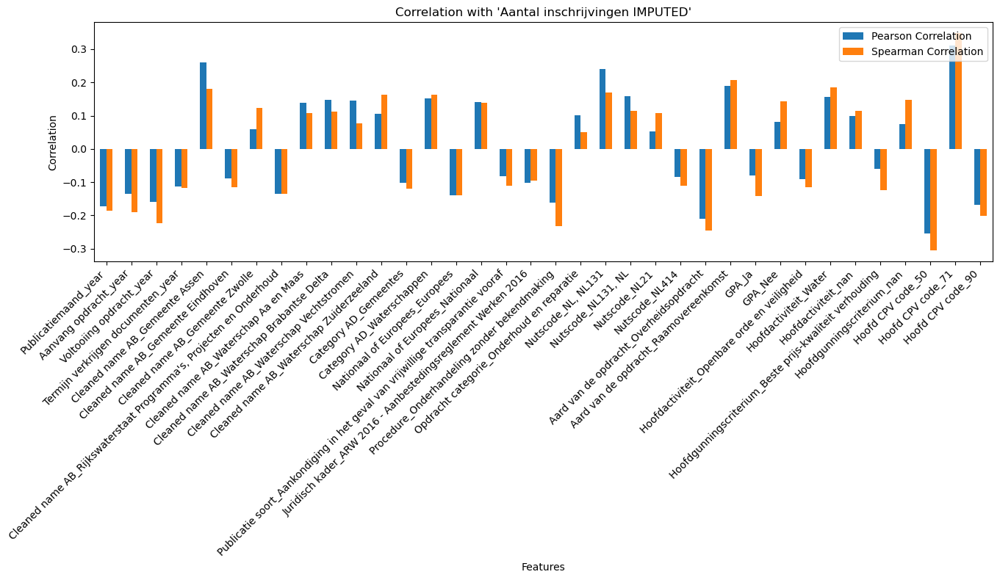

In [768]:
# Filter the df  absolute higher then 0.1
filtered_correlation_results = correlation_results[
    (correlation_results['Pearson Correlation'].abs() > 0.1) | 
    (correlation_results['Spearman Correlation'].abs() > 0.1)
]

print("Filtered Correlation with 'Aantal inschrijvingen IMPUTED':")
print(filtered_correlation_results)

# Plot
filtered_correlation_results.plot(kind='bar', figsize=(14, 8))
plt.title("Correlation with 'Aantal inschrijvingen IMPUTED'")
plt.xlabel('Features')
plt.ylabel('Correlation')
plt.xticks(rotation=45, ha='right')
plt.legend(loc='upper right')
plt.tight_layout()
plt.show()

it becomes visible that for example for GPA if it is 'JA' the correlation is negative and if the GPA is no the correlation is almost equall but just the opposite so carelessly aggreagating will make it look like there is no or almost no correlation. Because of this we will showcase the impact of each feature through its absolute correlation

In [769]:
aggregated_results = {}

# take base column names to aggregate on
base_column_names = set(col.split('_')[0] for col in df.columns if col != 'Aantal inschrijvingen IMPUTED')

for base_name in base_column_names:
    relevant_columns = [col for col in df.columns if col.startswith(base_name)]
    if base_name in categorical_cols:
        aggregated_results[base_name] = {
            'Pearson Correlation': abs(pearson_correlation[relevant_columns]).mean(),
            'Spearman Correlation': abs(spearman_correlation[relevant_columns]).mean()
        }
    else:
        for col in relevant_columns:
            aggregated_results[col] = {
                'Pearson Correlation': abs(pearson_correlation[col]),
                'Spearman Correlation': abs(spearman_correlation[col])
            }

# turn into df
aggregated_results_df = pd.DataFrame(aggregated_results).T

print("Aggregated Correlation with 'Aantal inschrijvingen IMPUTED':")
aggregated_results_df


Aggregated Correlation with 'Aantal inschrijvingen IMPUTED':


,Pearson Correlation,Spearman Correlation
Juridisch kader,0.078702,0.079984
Category AD,0.062573,0.089347
Cleaned name AB,0.016953,0.018048
Hoofd CPV code,0.186706,0.225574
Aard van de opdracht,0.064294,0.076030
Hoofdactiviteit,0.049176,0.062714
Personen aanwezig opening kluis,0.005988,0.007463
Procedure,0.047563,0.061232
Voltooiing opdracht_year,0.160167,0.224666
Voltooiing opdracht_month,0.035563,0.007383


,index,Correlation_Type,Correlation_Value
0,Juridisch kader,Pearson Correlation,0.078702
1,Category AD,Pearson Correlation,0.062573
2,Cleaned name AB,Pearson Correlation,0.016953
3,Hoofd CPV code,Pearson Correlation,0.186706
4,Aard van de opdracht,Pearson Correlation,0.064294
5,Hoofdactiviteit,Pearson Correlation,0.049176
6,Personen aanwezig opening kluis,Pearson Correlation,0.005988
7,Procedure,Pearson Correlation,0.047563
8,Voltooiing opdracht_year,Pearson Correlation,0.160167
9,Voltooiing opdracht_month,Pearson Correlation,0.035563


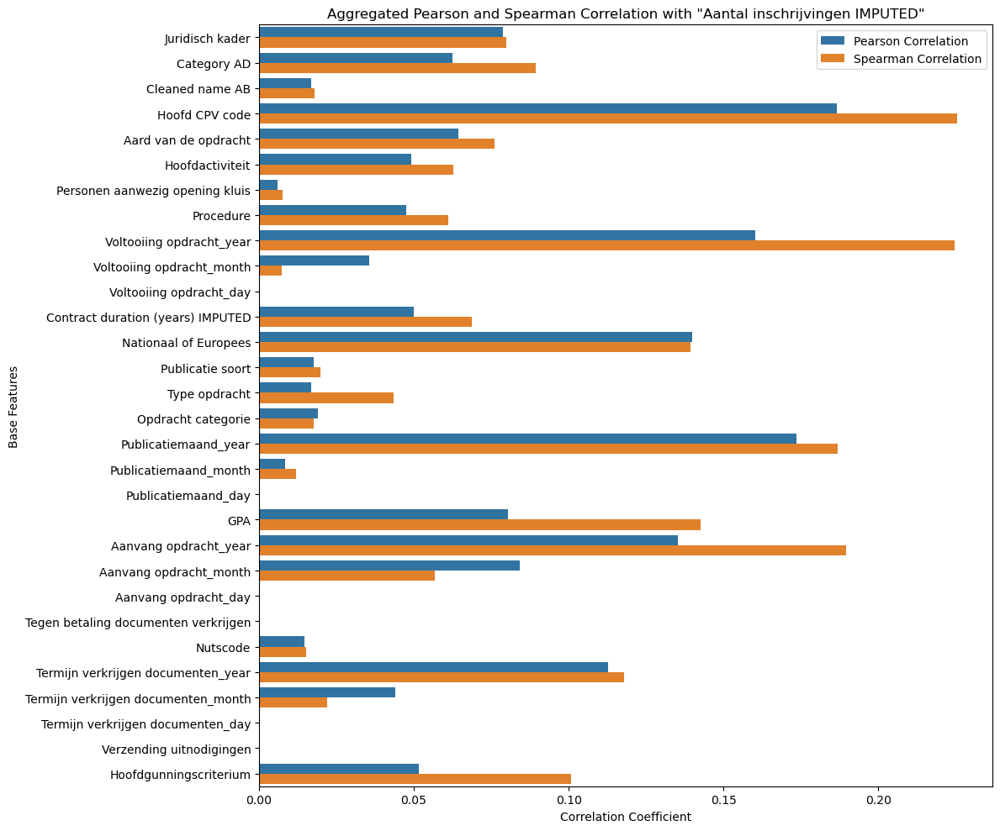

In [770]:
# Reset index
aggregated_results_df.reset_index(inplace=True)

# melt df
aggregated_results_df = aggregated_results_df.melt(id_vars='index', var_name='Correlation_Type', value_name='Correlation_Value')

display(aggregated_results_df)

plt.figure(figsize=(12, 10))
sns.barplot(data=aggregated_results_df, y='index', x='Correlation_Value', hue='Correlation_Type', orient='h')
plt.title('Aggregated Pearson and Spearman Correlation with "Aantal inschrijvingen IMPUTED"')
plt.ylabel('Base Features')
plt.xlabel('Correlation Coefficient')
plt.legend(loc='best')
plt.tight_layout()
plt.show()

This shows that the influence of contract duration is minimal about 0.05 correlation coefficient. The highest correlations are from the years (so each column with years). 

In [771]:
# deterimine columns with nan values
nan_values_corr = aggregated_results_df[aggregated_results_df['Correlation_Value'].isna()]

print("Rows with NaN values in Correlation_Value:")
nan_values_corr['index']

Rows with NaN values in Correlation_Value:


10                 Voltooiing opdracht_day
18                     Publicatiemaand_day
22                    Aanvang opdracht_day
23    Tegen betaling documenten verkrijgen
27       Termijn verkrijgen documenten_day
28                Verzending uitnodigingen
40                 Voltooiing opdracht_day
48                     Publicatiemaand_day
52                    Aanvang opdracht_day
53    Tegen betaling documenten verkrijgen
57       Termijn verkrijgen documenten_day
58                Verzending uitnodigingen
Name: index, dtype: object

In [772]:
df_imp = df_imp.drop(columns=['Tegen betaling documenten verkrijgen'])

You can see that the days have no correlation with the amount of registrations, together with Tegen betaling documenten verkrijgen. In the rest of the code this will no longer be considered


In [773]:
pearson_indices = aggregated_results_df[(aggregated_results_df['Correlation_Value'].abs() < 0.05) & (aggregated_results_df['Correlation_Type'] == 'Pearson Correlation')]['index']
spearman_indices = aggregated_results_df[(aggregated_results_df['Correlation_Value'].abs() < 0.05) & (aggregated_results_df['Correlation_Type'] == 'Spearman Correlation')]['index']

pearson_not_in_spearman = set(pearson_indices) - set(spearman_indices)
spearman_not_in_pearson = set(spearman_indices) - set(pearson_indices)

print(f'pearson: {pearson_indices}')
print(f'spearman: {spearman_indices}')


print(f'in pearson not in spearman: {pearson_not_in_spearman}')
print(f'in spearman but not in pearson: {spearman_not_in_pearson}')

pearson: 2                         Cleaned name AB
5                         Hoofdactiviteit
6         Personen aanwezig opening kluis
7                               Procedure
9               Voltooiing opdracht_month
13                       Publicatie soort
14                          Type opdracht
15                     Opdracht categorie
17                  Publicatiemaand_month
24                               Nutscode
26    Termijn verkrijgen documenten_month
Name: index, dtype: object
spearman: 32                        Cleaned name AB
36        Personen aanwezig opening kluis
39              Voltooiing opdracht_month
43                       Publicatie soort
44                          Type opdracht
45                     Opdracht categorie
47                  Publicatiemaand_month
54                               Nutscode
56    Termijn verkrijgen documenten_month
Name: index, dtype: object
in pearson not in spearman: {'Procedure', 'Hoofdactiviteit'}
in spearman but not in pea

the values not in spearman, but in pearson may exhibit more of a linear relationship with Aantal inschrijvingen then a non-linear relationsship

and vice versa

## Last Check for missing data

In [774]:
matching_values = missing_data_df[missing_data_df.index.isin(pearson_indices) | missing_data_df.index.isin(spearman_indices)]

matching_values_list = matching_values.index.tolist()
matching_values_list

['Hoofdactiviteit', 'Nutscode', 'Opdracht categorie', 'Procedure']

low correlation but will be kept in the data based on amount of missinf data

In [775]:
# Removing the matching columns from df_imp
# df_imp_filtered = df_imp.drop(columns=matching_values_list, errors='ignore')

# columns_to_drop = missing_data_summary[missing_data_summary['Percentage'] > 5]

In [776]:
missing_data = df_imp.isnull().sum()
missing_data_percentage = (df_imp.isnull().sum() / len(df)) * 100

missing_data_summary = pd.DataFrame({
    'Missing Data': missing_data,
    'Percentage': missing_data_percentage
})

print("Missing Data Summary:")
missing_data_summary

Missing Data Summary:


,Missing Data,Percentage
Publicatiemaand,0,0.000000
Cleaned name AB,0,0.000000
Category AD,0,0.000000
Aanvang opdracht,7684,54.913171
Voltooiing opdracht,7808,55.799328
Termijn verkrijgen documenten,8926,63.789037
Verzending uitnodigingen,13993,100.000000
Personen aanwezig opening kluis,0,0.000000
Nationaal of Europees,0,0.000000
Publicatie soort,0,0.000000


Eeventhough correlation is high missing data is more then 50% which even with imputation could introduce to much bias so remove them 

In [778]:
threshold = 20
columns_to_drop = missing_data_summary[missing_data_summary['Percentage'] > threshold].index
df_imp_filtered_dropped = df_imp.drop(columns=columns_to_drop)

print(f"Columns dropped: {list(columns_to_drop)}")

Columns dropped: ['Aanvang opdracht', 'Voltooiing opdracht', 'Termijn verkrijgen documenten', 'Verzending uitnodigingen', 'Opdracht categorie', 'Hoofdgunningscriterium']


In [779]:
columns_to_impute= missing_data_summary[(missing_data_summary['Percentage'] > 0) & (missing_data_summary['Percentage'] <= 5)].index

print(f"Columns to impute: {list(columns_to_impute)}")

Columns to impute: ['Procedure', 'Nutscode']


In [780]:
threthreshold = 20
columns_to_impute_rf = missing_data_summary[(missing_data_summary['Percentage'] > 5) & (missing_data_summary['Percentage'] <= threshold)].index

print(f"Columns to impute: {list(columns_to_impute_rf)}")

Columns to impute: ['Hoofdactiviteit']


### Mode imputation

In [781]:
def impute_specific_columns(df, columns_to_impute):
    for column in columns_to_impute:
        if column in df.columns and df[column].dtype == 'object':  # Check if the column is categorical
            mode_value = df[column].mode()[0]  # Find the mode (most frequent value)
            df[column].fillna(mode_value, inplace=True)  # Fill missing values with the mode
            print(f'Imputed column {column} with mode value: {mode_value}')
    return df

# impute missing values based on column
df_imputed = impute_specific_columns(df_imp_filtered_dropped, columns_to_impute)

print("DataFrame after imputation:")
print(df_imputed)

Imputed column Procedure with mode value: Openbaar
Imputed column Nutscode with mode value: NL
DataFrame after imputation:
      Publicatiemaand                                 Cleaned name AB  \
4          2016-04-01                               Gemeente Den Haag   
5          2016-04-01                               Gemeente Den Haag   
18         2016-04-01                         Waterschap Vechtstromen   
19         2016-04-01                         Waterschap Vechtstromen   
20         2016-04-01                         Waterschap Vechtstromen   
...               ...                                             ...   
29261      2023-12-01  Rijkswaterstaat Centrale Informatievoorziening   
29262      2023-12-01  Rijkswaterstaat Centrale Informatievoorziening   
29263      2023-12-01  Rijkswaterstaat Centrale Informatievoorziening   
29264      2023-12-01  Rijkswaterstaat Centrale Informatievoorziening   
29265      2023-12-01  Rijkswaterstaat Centrale Informatievoorziening   



/var/folders/4w/2tspj8b910d0wfksxgqd4km80000gn/T/ipykernel_27675/2277991959.py:5: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[column].fillna(mode_value, inplace=True)  # Fill missing values with the mode


Distribution of Procedure before imputation:


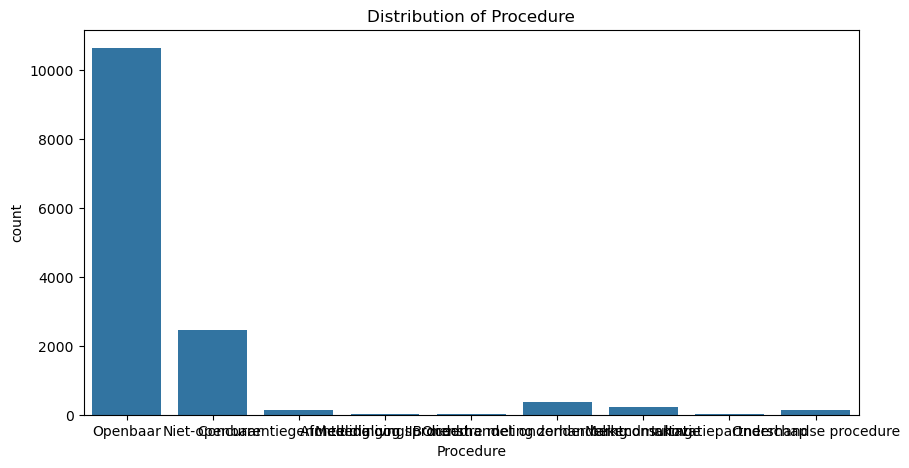

Distribution of Procedure after imputation:


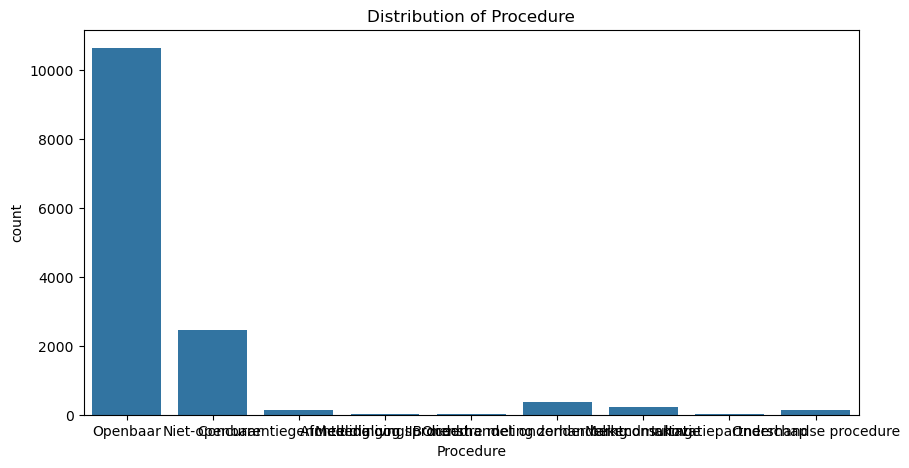

Distribution of Nutscode before imputation:


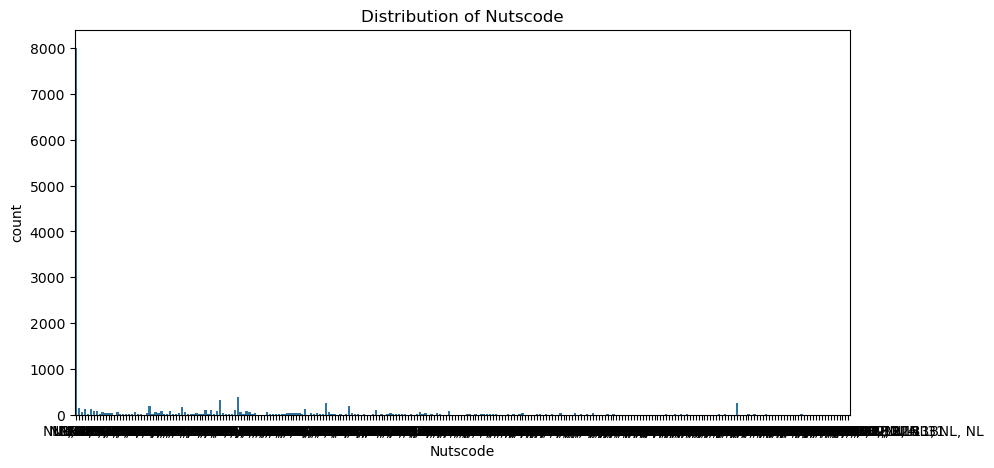

Distribution of Nutscode after imputation:


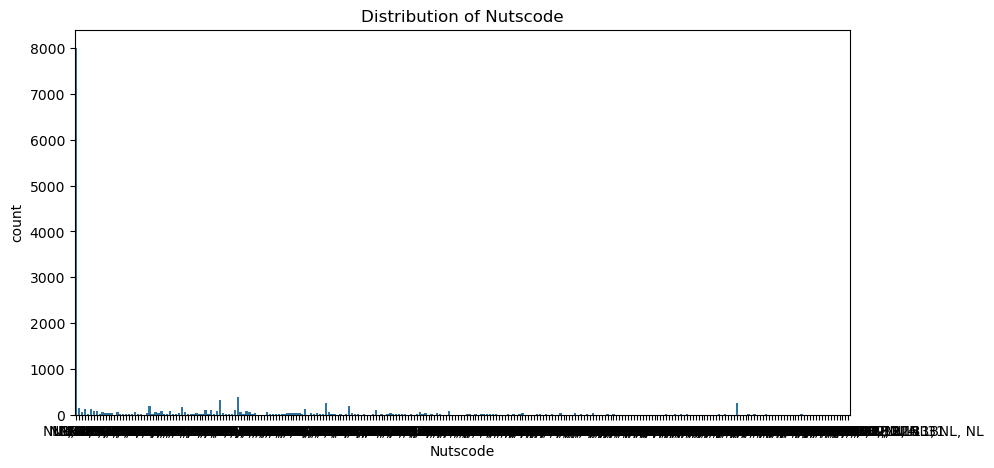

In [782]:
def plot_distributions(df, column):
    plt.figure(figsize=(10, 5))
    sns.countplot(x=column, data=df)
    plt.title(f'Distribution of {column}')
    plt.show()

# Plot distributions before and after imputation for columns to impute
for column in columns_to_impute:
    print(f'Distribution of {column} before imputation:')
    plot_distributions(df_imp_filtered_dropped, column)
    
    print(f'Distribution of {column} after imputation:')
    plot_distributions(df_imputed, column)


seem to have stayed the same ( which is expected because of the low amount of missing data)

## Last imputation

In [783]:
df_imputed.columns

Index(['Publicatiemaand', 'Cleaned name AB', 'Category AD',
       'Personen aanwezig opening kluis', 'Nationaal of Europees',
       'Publicatie soort', 'Juridisch kader', 'Type opdracht', 'Procedure',
       'Hoofd CPV code', 'Nutscode', 'Aard van de opdracht', 'GPA',
       'Hoofdactiviteit', 'Aantal inschrijvingen IMPUTED',
       'Contract duration (years) IMPUTED'],
      dtype='object')

In [784]:
df = df_imputed.copy()

In [785]:
data_types = df.dtypes
grouped_by_dtype = {dtype: list(data_types[data_types == dtype].index) for dtype in data_types.unique()} # useful to know what datatypes, for the ML model later

for dtype, columns in grouped_by_dtype.items():
    print(f"{dtype}: {columns}")

datetime64[ns]: ['Publicatiemaand']
object: ['Cleaned name AB', 'Category AD', 'Personen aanwezig opening kluis', 'Nationaal of Europees', 'Publicatie soort', 'Juridisch kader', 'Type opdracht', 'Procedure', 'Hoofd CPV code', 'Nutscode', 'Aard van de opdracht', 'GPA', 'Hoofdactiviteit']
float64: ['Aantal inschrijvingen IMPUTED', 'Contract duration (years) IMPUTED']


In [786]:
for col in df.select_dtypes(include=['datetime64', 'datetime64[ns]']).columns:
    df[col] = pd.to_datetime(df[col], format='%d-%m-%Y', errors='coerce')
    df[col + '_year'] = df[col].dt.year
    df[col + '_month'] = df[col].dt.month
    df[col + '_day'] = df[col].dt.day
    df.drop(columns=col, inplace=True)

df = pd.concat([df.reset_index(drop=True), encoded_df.reset_index(drop=True)], axis=1)

In [787]:
data_types = df.dtypes
grouped_by_dtype = {dtype: list(data_types[data_types == dtype].index) for dtype in data_types.unique()} # useful to know what datatypes, for the ML model later

for dtype, columns in grouped_by_dtype.items():
    print(f"{dtype}: {columns}")

object: ['Cleaned name AB', 'Category AD', 'Personen aanwezig opening kluis', 'Nationaal of Europees', 'Publicatie soort', 'Juridisch kader', 'Type opdracht', 'Procedure', 'Hoofd CPV code', 'Nutscode', 'Aard van de opdracht', 'GPA', 'Hoofdactiviteit']
float64: ['Aantal inschrijvingen IMPUTED', 'Contract duration (years) IMPUTED', 'Cleaned name AB_ABG-organisatie', 'Cleaned name AB_Avri', 'Cleaned name AB_BAR-gemeente', 'Cleaned name AB_Bizob', 'Cleaned name AB_Blink GRR', 'Cleaned name AB_GAD Regio Gooi en Vechtstreek', 'Cleaned name AB_GEM Bloemendalerpolder C.V.', 'Cleaned name AB_Gemeenschappelijke Regeling Nieuw Reijerwaard', 'Cleaned name AB_Gemeenschappelijke Regeling Omgevingsdienst Midden- en West-Brabant', 'Cleaned name AB_Gemeenschappelijke Regeling Omgevingsdienst Regio Utrecht', 'Cleaned name AB_Gemeenschappelijke regeling Veiligheidsregio Brabant-Noord, onderdeel Brandweer', 'Cleaned name AB_Gemeente Aa en Hunze', 'Cleaned name AB_Gemeente Aalsmeer', 'Cleaned name AB_Gemee

### Random forest classifier

In [788]:
# fine-tuning parameters
param_grid = {
    'n_estimators': [50, 100],
    'max_depth': [None, 10, 15],
    'min_samples_split': [5, 10],
    'min_samples_leaf': [2, 4, 6]
}

In [789]:
def prepare_data(df, column):
    print(f'Start imputation for {column}')
    
    # Split data into train and prediction 
    df_train = df[df[column].notna()]
    df_predict = df[df[column].isna()]
    
    # Prepare data
    X = df_train.drop(columns=columns_to_impute)
    y = df_train[column]
    X_predict = df_predict.drop(columns=columns_to_impute)
    
    # encode categorical features
    X = pd.get_dummies(X, drop_first=True)
    X_predict = pd.get_dummies(X_predict, drop_first=True)
    
    # ensure unique names
    X.columns = ['{}_{}'.format(col, i) for i, col in enumerate(X.columns)]
    X_predict.columns = ['{}_{}'.format(col, i) for i, col in enumerate(X_predict.columns)]
    
    X_predict = X_predict.reindex(columns=X.columns, fill_value=0)
    
    return X, y, X_predict


In [790]:
def split_and_encode(X, y):
    # split into train and test
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    
    # encode target variable
    le = LabelEncoder()
    y_train_encoded = le.fit_transform(y_train)
    y_test_encoded = le.transform(y_test)
    
    return X_train, X_test, y_train_encoded, y_test_encoded, le


In [791]:
def grid_search_and_train(X_train, y_train_encoded):
    class_weights = class_weight.compute_class_weight(class_weight='balanced', classes=np.unique(y_train_encoded), y=y_train_encoded)
    class_weights = {i: class_weights[i] for i in range(len(class_weights))}
    
    # perform parameter tuning with GridSearchCV with k-fold cross-validation
    rf = RandomForestClassifier(random_state=42, class_weight=class_weights)
    grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=StratifiedKFold(n_splits=5), scoring='accuracy', n_jobs=-1)
    grid_search.fit(X_train, y_train_encoded)
    
    # best model
    best_rf = grid_search.best_estimator_
    best_params = grid_search.best_params_
    print(f'Best parameters: {best_params}')
    
    return best_rf


In [792]:
def train_and_predict(df, X, y, X_predict, best_rf, le, column):
    # train best model full training data
    y_encoded = le.fit_transform(y.values.ravel())
    best_rf.fit(X, y_encoded)
    
    # predict
    if not X_predict.empty:
        predicted_values_encoded = best_rf.predict(X_predict)
        predicted_values = le.inverse_transform(predicted_values_encoded)
    
        # fill the missing with predictions
        df.loc[df[column].isna(), column] = predicted_values

    return df


In [793]:
def evaluate_model(best_rf, X, y_encoded, X_test, y_test_encoded, column):
    # perform k-fold cross-validation
    kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    
    cv_accuracy = cross_val_score(best_rf, X, y_encoded, cv=kfold, scoring='accuracy').mean()
    cv_precision = cross_val_score(best_rf, X, y_encoded, cv=kfold, scoring='precision_weighted').mean()
    cv_recall = cross_val_score(best_rf, X, y_encoded, cv=kfold, scoring='recall_weighted').mean()
    cv_f1 = cross_val_score(best_rf, X, y_encoded, cv=kfold, scoring='f1_weighted').mean()
    
    y_pred_test = best_rf.predict(X_test)
    
    accuracy = accuracy_score(y_test_encoded, y_pred_test)
    precision = precision_score(y_test_encoded, y_pred_test, average='weighted')
    recall = recall_score(y_test_encoded, y_pred_test, average='weighted')
    f1 = f1_score(y_test_encoded, y_pred_test, average='weighted')
    conf_matrix = confusion_matrix(y_test_encoded, y_pred_test)
    
    print(f"Evaluation metrics for {column}:")
    print(f"Cross-validated Accuracy: {cv_accuracy}")
    print(f"Cross-validated Precision: {cv_precision}")
    print(f"Cross-validated Recall: {cv_recall}")
    print(f"Cross-validated F1 Score: {cv_f1}")
    print(f"Accuracy: {accuracy}")
    print(f"Precision: {precision}")
    print(f"Recall: {recall}")
    print(f"F1 Score: {f1}")
    
    plt.figure(figsize=(10, 7))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=le.classes_, yticklabels=le.classes_)
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(f'Confusion Matrix for {column}')
    plt.show()
    
    return {
        'cv_accuracy': cv_accuracy,
        'cv_precision': cv_precision,
        'cv_recall': cv_recall,
        'cv_f1': cv_f1,
        'accuracy': accuracy,
        'precision': precision,
        'recall': recall,
        'f1': f1,
        'conf_matrix': conf_matrix
    }

Start imputation for Hoofdactiviteit


/opt/anaconda3/envs/environment/lib/python3.11/site-packages/sklearn/model_selection/_split.py:737: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(


Best parameters: {'max_depth': 15, 'min_samples_leaf': 2, 'min_samples_split': 10, 'n_estimators': 100}


/opt/anaconda3/envs/environment/lib/python3.11/site-packages/sklearn/model_selection/_split.py:737: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(
/opt/anaconda3/envs/environment/lib/python3.11/site-packages/sklearn/model_selection/_split.py:737: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(
/opt/anaconda3/envs/environment/lib/python3.11/site-packages/sklearn/model_selection/_split.py:737: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(
/opt/anaconda3/envs/environment/lib/python3.11/site-packages/sklearn/model_selection/_split.py:737: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(


Evaluation metrics for Hoofdactiviteit:
Cross-validated Accuracy: 0.9996082751690756
Cross-validated Precision: 0.9996084720297113
Cross-validated Recall: 0.9996082751690756
Cross-validated F1 Score: 0.999604659301529
Accuracy: 1.0
Precision: 1.0
Recall: 1.0
F1 Score: 1.0


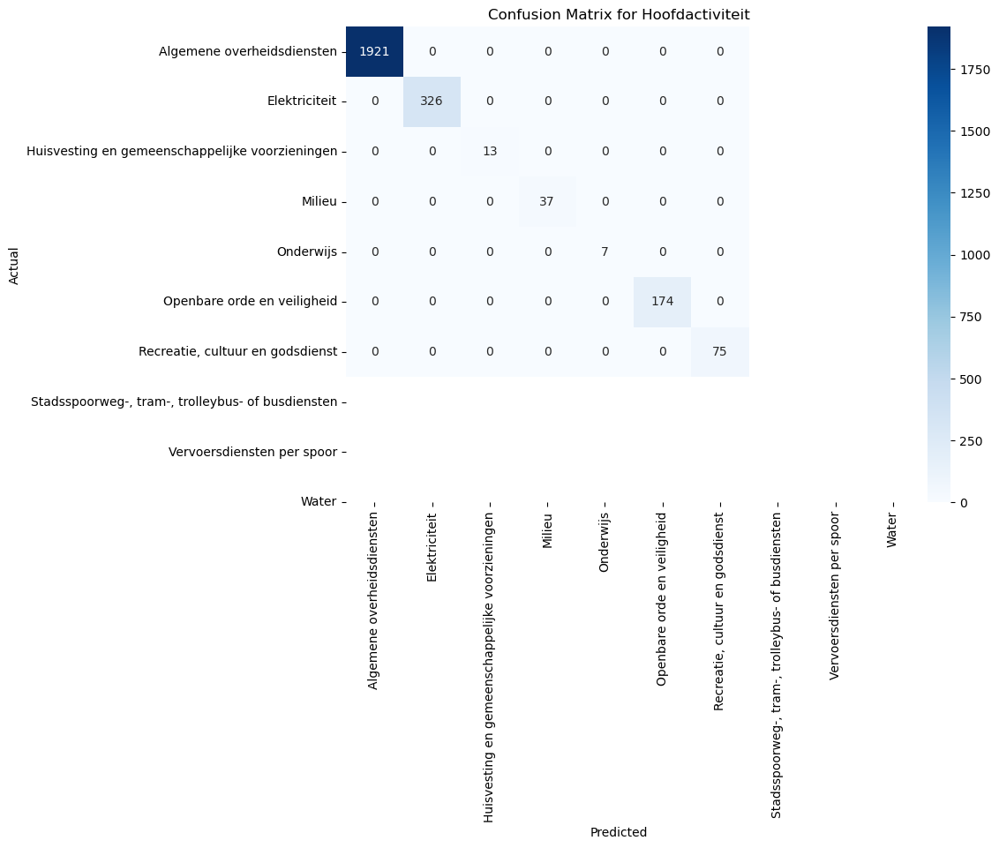

In [794]:
for column in columns_to_impute_rf:
    # prepare data for the current column
    X, y, X_predict = prepare_data(df, column)

    # split and encode
    X_train, X_test, y_train_encoded, y_test_encoded, le = split_and_encode(X, y)
    
    # perform grid search and train 
    best_rf = grid_search_and_train(X_train, y_train_encoded)
    
    metrics = evaluate_model(best_rf, X_train, y_train_encoded, X_test, y_test_encoded, column)
    
    # train and predict
    df = train_and_predict(df, X, y, X_predict, best_rf, le, column)


In [795]:
df = df.reindex(df_imp_filtered_dropped.index)

df_imp_filtered_dropped[columns_to_impute] = df[columns_to_impute]

print("DataFrame after imputation:")
display(df_imp_filtered_dropped.head(5))

DataFrame after imputation:


,Publicatiemaand,Cleaned name AB,Category AD,Personen aanwezig opening kluis,Nationaal of Europees,Publicatie soort,Juridisch kader,Type opdracht,Procedure,Hoofd CPV code,Nutscode,Aard van de opdracht,GPA,Hoofdactiviteit,Aantal inschrijvingen IMPUTED,Contract duration (years) IMPUTED
4,2016-04-01,Gemeente Den Haag,Gemeentes,Nee,Europees,"Kennisgeving van aanvullende informatie, infor...",ARW 2016 - Aanbestedingsreglement Werken 2016,Diensten,Openbaar,90,NL,Overheidsopdracht,Ja,Algemene overheidsdiensten,3.0,1.915068
5,2016-04-01,Gemeente Den Haag,Gemeentes,Nee,Europees,Aankondiging van een gegunde opdracht,Aanbestedingswet 2012,Leveringen,Openbaar,45,NL,Overheidsopdracht,Ja,Algemene overheidsdiensten,10.0,3.917808
18,2016-04-01,Waterschap Vechtstromen,Waterschappen,Nee,Europees,Aankondiging van een gegunde opdracht,Aanbestedingswet 2012,Diensten,Openbaar,50,NL,Raamovereenkomst,Ja,Algemene overheidsdiensten,16.0,3.255619
19,2016-04-01,Waterschap Vechtstromen,Waterschappen,Nee,Europees,Aankondiging van een gegunde opdracht,Aanbestedingswet 2012,Diensten,Openbaar,50,NL,Raamovereenkomst,Ja,Algemene overheidsdiensten,16.0,3.255619
20,2016-04-01,Waterschap Vechtstromen,Waterschappen,Nee,Europees,Aankondiging van een gegunde opdracht,Aanbestedingswet 2012,Diensten,Openbaar,50,NL,Raamovereenkomst,Ja,Algemene overheidsdiensten,16.0,3.255619


In [796]:
missing_values = df_imp_filtered_dropped.isnull().sum()

if missing_values.any():
    print('There are no columns with missing values left')
else:
    print('There are still missing values')              


There are no columns with missing values left


# Save fully imputed to csv

In [857]:
df_full_imputed = df_imp_filtered_dropped.copy()

In [858]:
if 'Contract duration (years) IMPUTED' in df_full_imputed.columns:
    df_full_imputed.rename(columns={'Contract duration (years) IMPUTED': 'Contract duration (years)'}, inplace=True)

if 'Aantal inschrijvingen IMPUTED' in df_full_imputed.columns:
    df_full_imputed.rename(columns={'Aantal inschrijvingen IMPUTED': 'Aantal inschrijvingen'}, inplace=True)

df_full_imputed['Hoofd CPV code'] = df_full_imputed['Hoofd CPV code'].astype(str)

df_full_imputed.dtypes

Publicatiemaand                    datetime64[ns]
Cleaned name AB                            object
Category AD                                object
Personen aanwezig opening kluis            object
Nationaal of Europees                      object
Publicatie soort                           object
Juridisch kader                            object
Type opdracht                              object
Procedure                                  object
Hoofd CPV code                             object
Nutscode                                   object
Aard van de opdracht                       object
GPA                                        object
Hoofdactiviteit                            object
Aantal inschrijvingen                     float64
Contract duration (years)                 float64
dtype: object

In [859]:
file_path_FI = '/Users/mohamedhajji/Documents/RWS full/RWS final data/df_full_imputed.csv'

df_full_imputed.to_csv(file_path_FI, index=False)

#  Final analysis

In [860]:

df_fi = df_full_imputed.copy()

In [15]:
file_path_FI = '/Users/mohamedhajji/Documents/RWS full/RWS final data/df_full_imputed.csv'

df_fi = pd.read_csv(file_path_FI)

df_fi.head()

,Publicatiemaand,Cleaned name AB,Category AD,Personen aanwezig opening kluis,Nationaal of Europees,Publicatie soort,Juridisch kader,Type opdracht,Procedure,Hoofd CPV code,Nutscode,Aard van de opdracht,GPA,Hoofdactiviteit,Aantal inschrijvingen,Contract duration (years)
0,2016-04-01,Gemeente Den Haag,Gemeentes,Nee,Europees,"Kennisgeving van aanvullende informatie, infor...",ARW 2016 - Aanbestedingsreglement Werken 2016,Diensten,Openbaar,90,NL,Overheidsopdracht,Ja,Algemene overheidsdiensten,3.0,1.915068
1,2016-04-01,Gemeente Den Haag,Gemeentes,Nee,Europees,Aankondiging van een gegunde opdracht,Aanbestedingswet 2012,Leveringen,Openbaar,45,NL,Overheidsopdracht,Ja,Algemene overheidsdiensten,10.0,3.917808
2,2016-04-01,Waterschap Vechtstromen,Waterschappen,Nee,Europees,Aankondiging van een gegunde opdracht,Aanbestedingswet 2012,Diensten,Openbaar,50,NL,Raamovereenkomst,Ja,Algemene overheidsdiensten,16.0,3.255619
3,2016-04-01,Waterschap Vechtstromen,Waterschappen,Nee,Europees,Aankondiging van een gegunde opdracht,Aanbestedingswet 2012,Diensten,Openbaar,50,NL,Raamovereenkomst,Ja,Algemene overheidsdiensten,16.0,3.255619
4,2016-04-01,Waterschap Vechtstromen,Waterschappen,Nee,Europees,Aankondiging van een gegunde opdracht,Aanbestedingswet 2012,Diensten,Openbaar,50,NL,Raamovereenkomst,Ja,Algemene overheidsdiensten,16.0,3.255619


## Descriptive analysis

In [19]:
df_fi.describe()

,Hoofd CPV code,Aantal inschrijvingen,Contract duration (years)
count,13993.000000,13993.000000,13993.000000
mean,62.846923,6.051240,2.471621
std,13.954216,4.373518,1.052229
min,45.000000,0.000000,0.000000
25%,50.000000,3.000000,1.915068
50%,71.000000,5.000000,2.329874
75%,71.000000,8.000000,3.002740
max,90.000000,23.000000,7.005479


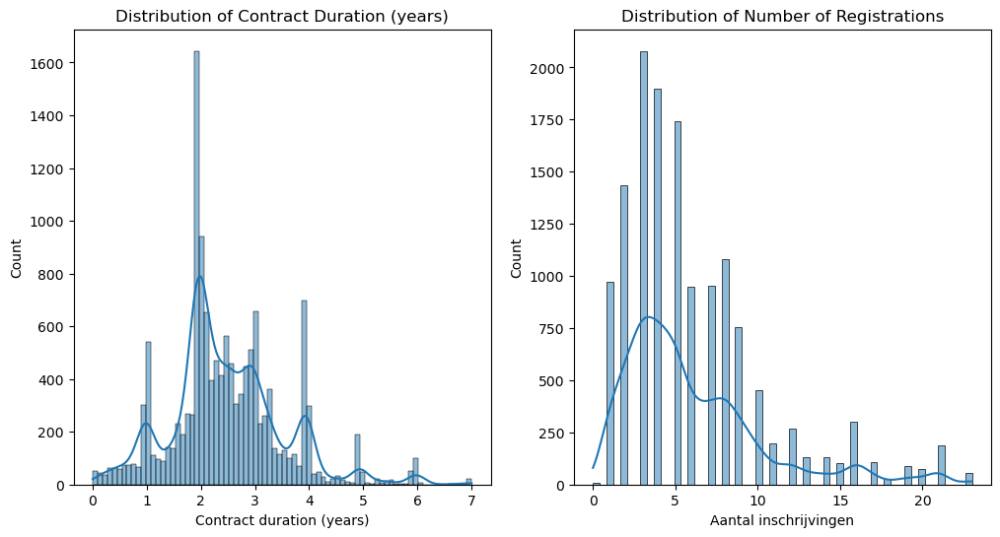

In [20]:
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
sns.histplot(df_fi['Contract duration (years)'], kde=True)
plt.title('Distribution of Contract Duration (years)')

plt.subplot(1, 2, 2)
sns.histplot(df_fi['Aantal inschrijvingen'], kde=True)
plt.title('Distribution of Number of Registrations')

plt.show()

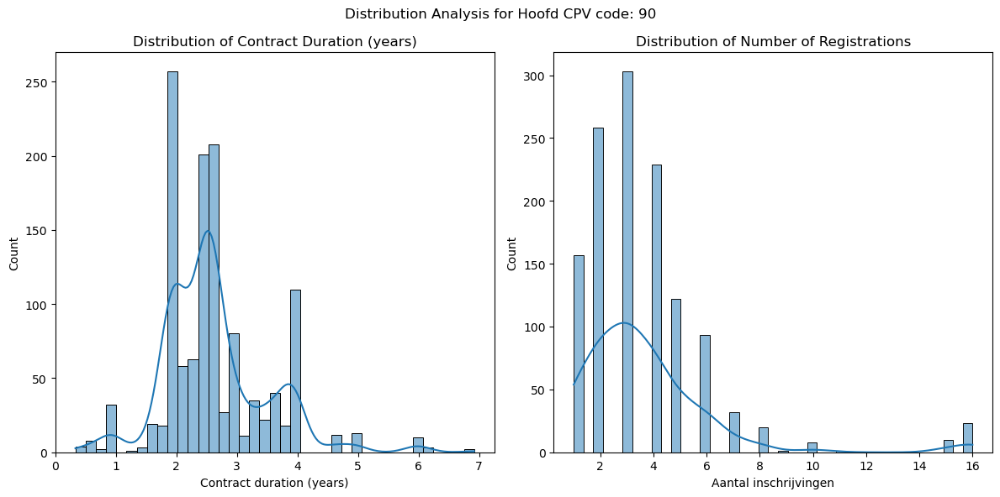

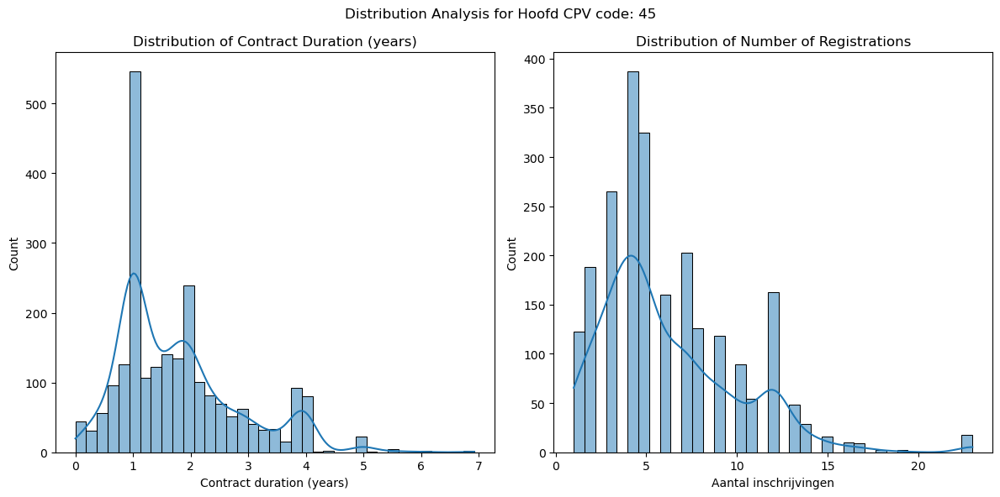

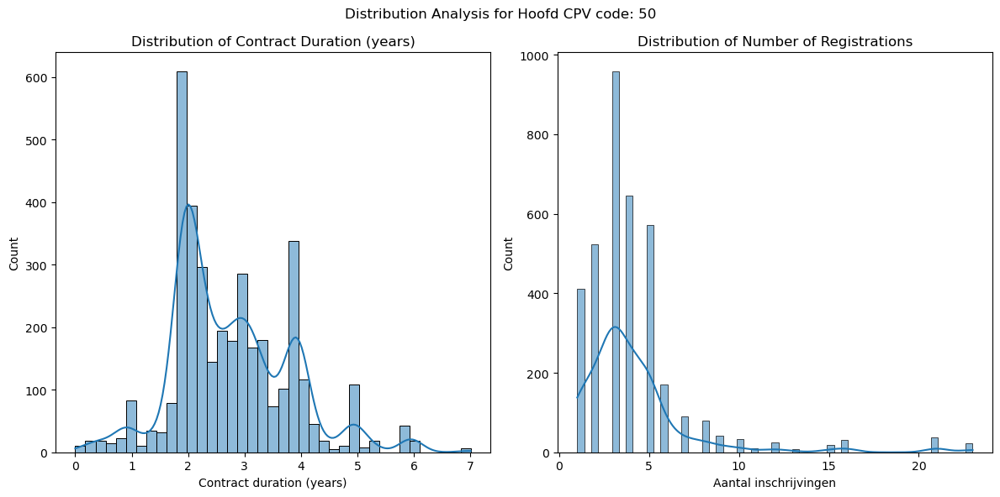

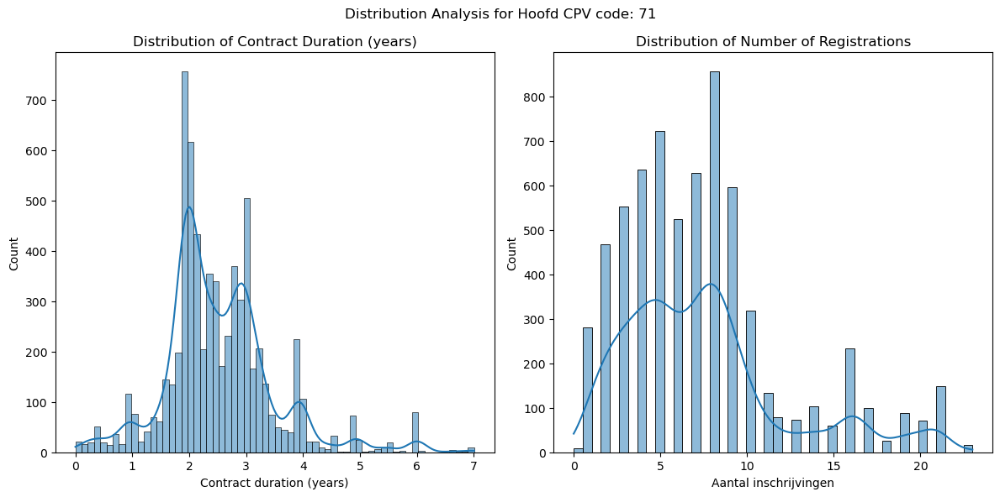

In [21]:
def plot_distributions(data, **kwargs):
    cpv_code = kwargs.get('col_name')
    data = data[data['Hoofd CPV code'] == cpv_code]
    
    plt.figure(figsize=(12, 6))

    #  for contract duration
    plt.subplot(1, 2, 1)
    sns.histplot(data['Contract duration (years)'], kde=True)
    plt.title('Distribution of Contract Duration (years)')

    # for number of registrations
    plt.subplot(1, 2, 2)
    sns.histplot(data['Aantal inschrijvingen'], kde=True)
    plt.title('Distribution of Number of Registrations')

    plt.suptitle(f'Distribution Analysis for Hoofd CPV code: {cpv_code}')
    plt.tight_layout()
    plt.show()

cpv_codes = df_fi['Hoofd CPV code'].unique()

for cpv_code in cpv_codes:
    plot_distributions(df_fi, col_name=cpv_code)


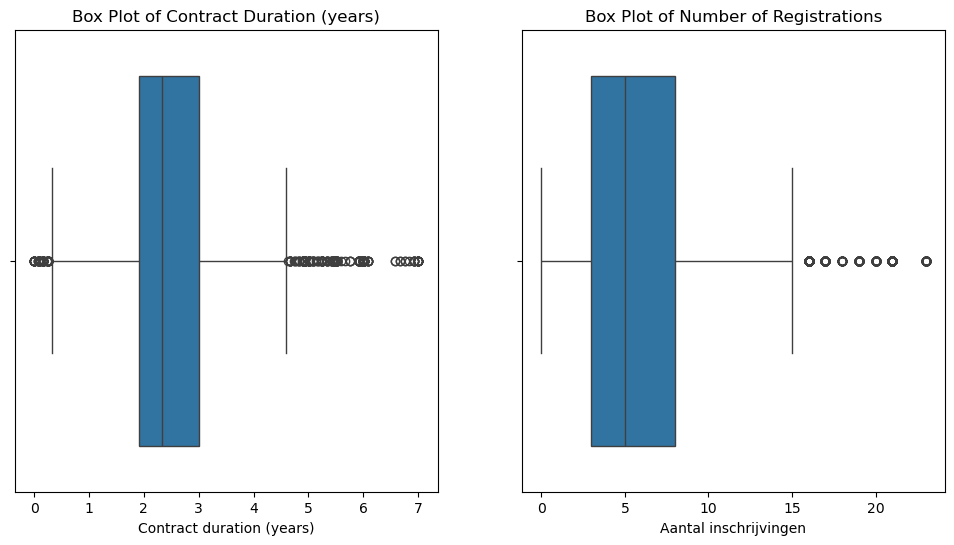

In [22]:
# boxplot
plt.figure(figsize=(12, 6))

# for contract duration
plt.subplot(1, 2, 1)
sns.boxplot(x=df_fi['Contract duration (years)'])
plt.title('Box Plot of Contract Duration (years)')

# for number of registrations
plt.subplot(1, 2, 2)
sns.boxplot(x=df_fi['Aantal inschrijvingen'])
plt.title('Box Plot of Number of Registrations')

plt.show()

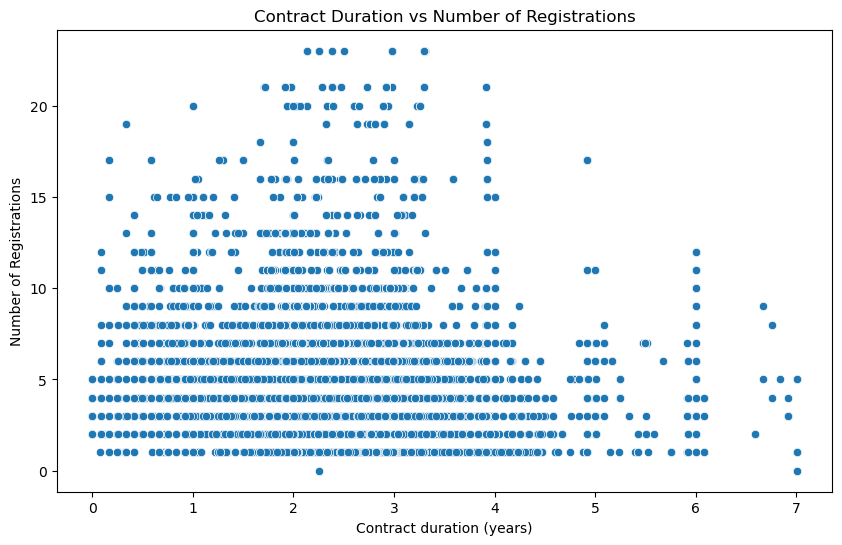

In [23]:
# trend analysis
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Contract duration (years)', y='Aantal inschrijvingen', data=df_fi)
plt.title('Contract Duration vs Number of Registrations')
plt.xlabel('Contract duration (years)')
plt.ylabel('Number of Registrations')
plt.show()

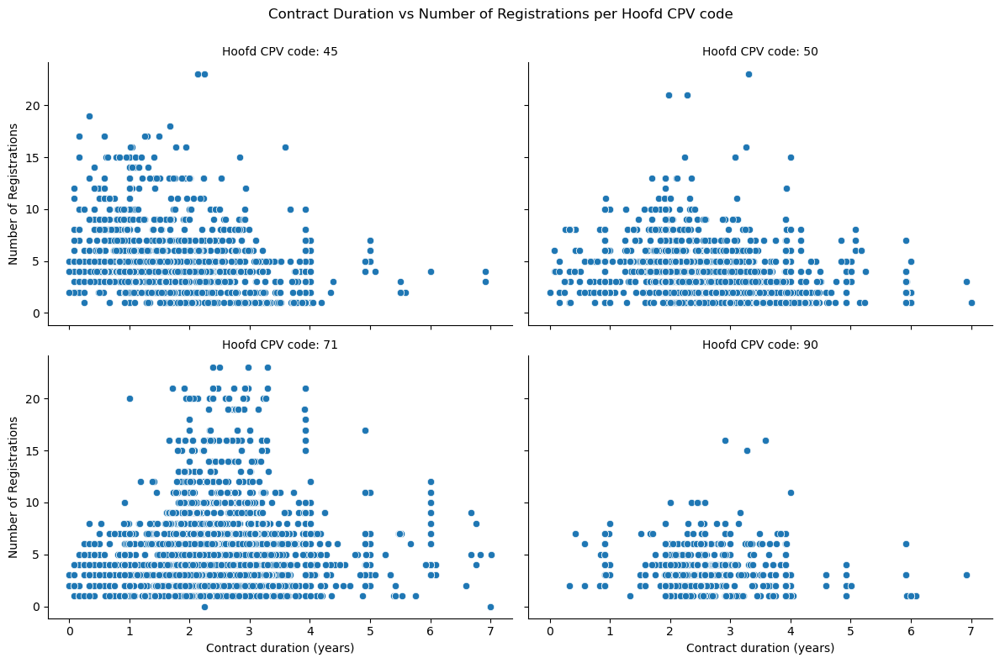

In [24]:
g = sns.FacetGrid(df_fi, col='Hoofd CPV code', col_wrap=2, height=4, aspect=1.5)
g.map(sns.scatterplot, 'Contract duration (years)', 'Aantal inschrijvingen')

g.set_axis_labels('Contract duration (years)', 'Number of Registrations')
g.set_titles(col_template='Hoofd CPV code: {col_name}')

plt.subplots_adjust(top=0.9)
g.fig.suptitle('Contract Duration vs Number of Registrations per Hoofd CPV code')

plt.show()



## Correlation analysis

### Full data

In [16]:
df_corr = df_fi.copy()

In [17]:
df_corr.head()

,Publicatiemaand,Cleaned name AB,Category AD,Personen aanwezig opening kluis,Nationaal of Europees,Publicatie soort,Juridisch kader,Type opdracht,Procedure,Hoofd CPV code,Nutscode,Aard van de opdracht,GPA,Hoofdactiviteit,Aantal inschrijvingen,Contract duration (years)
0,2016-04-01,Gemeente Den Haag,Gemeentes,Nee,Europees,"Kennisgeving van aanvullende informatie, infor...",ARW 2016 - Aanbestedingsreglement Werken 2016,Diensten,Openbaar,90,NL,Overheidsopdracht,Ja,Algemene overheidsdiensten,3.0,1.915068
1,2016-04-01,Gemeente Den Haag,Gemeentes,Nee,Europees,Aankondiging van een gegunde opdracht,Aanbestedingswet 2012,Leveringen,Openbaar,45,NL,Overheidsopdracht,Ja,Algemene overheidsdiensten,10.0,3.917808
2,2016-04-01,Waterschap Vechtstromen,Waterschappen,Nee,Europees,Aankondiging van een gegunde opdracht,Aanbestedingswet 2012,Diensten,Openbaar,50,NL,Raamovereenkomst,Ja,Algemene overheidsdiensten,16.0,3.255619
3,2016-04-01,Waterschap Vechtstromen,Waterschappen,Nee,Europees,Aankondiging van een gegunde opdracht,Aanbestedingswet 2012,Diensten,Openbaar,50,NL,Raamovereenkomst,Ja,Algemene overheidsdiensten,16.0,3.255619
4,2016-04-01,Waterschap Vechtstromen,Waterschappen,Nee,Europees,Aankondiging van een gegunde opdracht,Aanbestedingswet 2012,Diensten,Openbaar,50,NL,Raamovereenkomst,Ja,Algemene overheidsdiensten,16.0,3.255619


In [18]:
data_types = df_corr.dtypes
grouped_by_dtype = {dtype: list(data_types[data_types == dtype].index) for dtype in data_types.unique()} # useful to know what datatypes, for the ML model later

for dtype, columns in grouped_by_dtype.items():
    print(f"{dtype}: {columns}")

object: ['Publicatiemaand', 'Cleaned name AB', 'Category AD', 'Personen aanwezig opening kluis', 'Nationaal of Europees', 'Publicatie soort', 'Juridisch kader', 'Type opdracht', 'Procedure', 'Nutscode', 'Aard van de opdracht', 'GPA', 'Hoofdactiviteit']
int64: ['Hoofd CPV code']
float64: ['Aantal inschrijvingen', 'Contract duration (years)']


In [19]:
datetime_cols = ['Publicatiemaand']

for col in datetime_cols:
    df_corr[col] = pd.to_datetime(df_corr[col], format='%Y-%m-%d', errors='coerce')
    df_corr[col + '_year'] = df_corr[col].dt.year
    df_corr[col + '_month'] = df_corr[col].dt.month
    df_corr.drop(columns=col, inplace=True)

categorical_cols = [
    'Cleaned name AB', 'Category AD', 
    'Personen aanwezig opening kluis', 
    'Nationaal of Europees', 'Publicatie soort', 'Juridisch kader', 
    'Type opdracht', 'Procedure',
    'Nutscode', 'Aard van de opdracht', 'GPA', 'Hoofdactiviteit', 
    'Hoofd CPV code'
]

# One-hot encode
encoder = OneHotEncoder(sparse_output=False, handle_unknown='ignore')
encoded_features = encoder.fit_transform(df_corr[categorical_cols])
encoded_df = pd.DataFrame(encoded_features, columns=encoder.get_feature_names_out(categorical_cols)) # one hot encoding

df_corr.drop(columns=categorical_cols, inplace=True)
df_corr = pd.concat([df_corr.reset_index(drop=True), encoded_df.reset_index(drop=True)], axis=1)

In [20]:
df_corr.head()

,Aantal inschrijvingen,Contract duration (years),Publicatiemaand_year,Publicatiemaand_month,Cleaned name AB_ABG-organisatie,Cleaned name AB_Avri,Cleaned name AB_BAR-gemeente,Cleaned name AB_Bizob,Cleaned name AB_Blink GRR,Cleaned name AB_GAD Regio Gooi en Vechtstreek,...,Hoofdactiviteit_Openbare orde en veiligheid,"Hoofdactiviteit_Recreatie, cultuur en godsdienst","Hoofdactiviteit_Stadsspoorweg-, tram-, trolleybus- of busdiensten",Hoofdactiviteit_Vervoersdiensten per spoor,Hoofdactiviteit_Water,Hoofdactiviteit_nan,Hoofd CPV code_45,Hoofd CPV code_50,Hoofd CPV code_71,Hoofd CPV code_90
0,3.0,1.915068,2016,4,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,10.0,3.917808,2016,4,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
2,16.0,3.255619,2016,4,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
3,16.0,3.255619,2016,4,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
4,16.0,3.255619,2016,4,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


In [21]:
data_types = df_corr.dtypes
grouped_by_dtype = {dtype: list(data_types[data_types == dtype].index) for dtype in data_types.unique()} # useful to know what datatypes, for the ML model later

for dtype, columns in grouped_by_dtype.items():
    print(f"{dtype}: {columns}")

float64: ['Aantal inschrijvingen', 'Contract duration (years)', 'Cleaned name AB_ABG-organisatie', 'Cleaned name AB_Avri', 'Cleaned name AB_BAR-gemeente', 'Cleaned name AB_Bizob', 'Cleaned name AB_Blink GRR', 'Cleaned name AB_GAD Regio Gooi en Vechtstreek', 'Cleaned name AB_GEM Bloemendalerpolder C.V.', 'Cleaned name AB_Gemeenschappelijke Regeling Nieuw Reijerwaard', 'Cleaned name AB_Gemeenschappelijke Regeling Omgevingsdienst Midden- en West-Brabant', 'Cleaned name AB_Gemeenschappelijke Regeling Omgevingsdienst Regio Utrecht', 'Cleaned name AB_Gemeenschappelijke regeling Veiligheidsregio Brabant-Noord, onderdeel Brandweer', 'Cleaned name AB_Gemeente Aa en Hunze', 'Cleaned name AB_Gemeente Aalsmeer', 'Cleaned name AB_Gemeente Alkmaar', 'Cleaned name AB_Gemeente Almelo', 'Cleaned name AB_Gemeente Almere', 'Cleaned name AB_Gemeente Alphen aan den Rijn', 'Cleaned name AB_Gemeente Alphen-Chaam', 'Cleaned name AB_Gemeente Altena', 'Cleaned name AB_Gemeente Amersfoort', 'Cleaned name AB_Geme

Correlation with 'Aantal inschrijvingen':
                                 Pearson Correlation  Spearman Correlation
Contract duration (years)                  -0.050011             -0.068811
Publicatiemaand_year                       -0.173561             -0.186971
Publicatiemaand_month                      -0.008345             -0.011877
Cleaned name AB_ABG-organisatie             0.001336              0.007883
Cleaned name AB_Avri                        0.010015              0.012975
...                                              ...                   ...
Hoofdactiviteit_nan                         0.098607              0.113491
Hoofd CPV code_45                           0.013119              0.047997
Hoofd CPV code_50                          -0.254884             -0.305675
Hoofd CPV code_71                           0.310897              0.348214
Hoofd CPV code_90                          -0.167924             -0.200412

[678 rows x 2 columns]


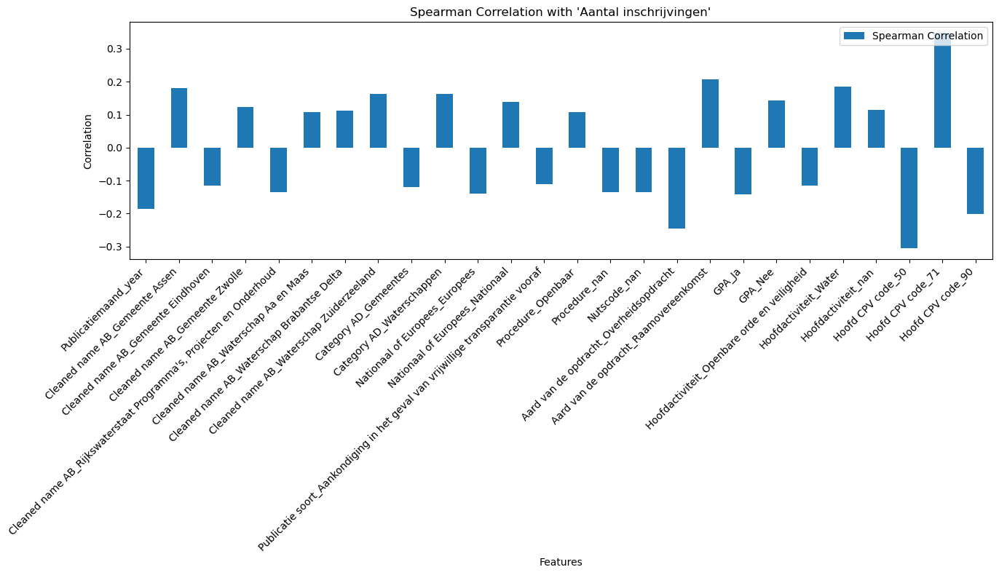

In [22]:
# Calculate Pearson correlation 
pearson_correlation = df_corr.corr(method='pearson')['Aantal inschrijvingen'].drop('Aantal inschrijvingen')

# Calculate Spearman correlation 
spearman_correlation = df_corr.corr(method='spearman')['Aantal inschrijvingen'].drop('Aantal inschrijvingen')

correlation_results = pd.DataFrame({
    'Pearson Correlation': pearson_correlation,
    'Spearman Correlation': spearman_correlation
})

print("Correlation with 'Aantal inschrijvingen':")
print(correlation_results)

# filter correlation absolute more then 0.1 
filtered_correlation_results = correlation_results[
    (correlation_results['Spearman Correlation'].abs() > 0.1)
]

filtered_correlation_results = filtered_correlation_results.reset_index()

filtered_correlation_results.set_index('index', inplace=True)
filtered_correlation_results[['Spearman Correlation']].plot(kind='bar', figsize=(14, 8), color=['#1f77b4'])
plt.title("Spearman Correlation with 'Aantal inschrijvingen'")
plt.xlabel('Features')
plt.ylabel('Correlation')
plt.xticks(rotation=45, ha='right')
plt.legend(loc='upper right')
plt.tight_layout()
plt.show()

it becomes visible that for example for GPA if it is 'JA' the correlation is negative and if the GPA is no the correlation is almost equall but just the opposite so carelessly aggreagating will make it look like there is no or almost no correlation. Because of this we will showcase the impact of each feature through its absolute correlation

In [23]:
aggregated_results = {}

base_column_names = set(col.split('_')[0] for col in df_corr.columns if col != 'Aantal inschrijvingen')

for base_name in base_column_names:
    relevant_columns = [col for col in df_corr.columns if col.startswith(base_name)]
    if base_name in categorical_cols:
        aggregated_results[base_name] = {
            'Pearson Correlation': abs(pearson_correlation[relevant_columns]).mean(),
            'Spearman Correlation': abs(spearman_correlation[relevant_columns]).mean()
        }
    else:
        for col in relevant_columns:
            aggregated_results[col] = {
                'Pearson Correlation': abs(pearson_correlation[col]),
                'Spearman Correlation': abs(spearman_correlation[col])
            }

aggregated_results_df = pd.DataFrame(aggregated_results).T

aggregated_results_df.reset_index(inplace=True)
aggregated_results_df = pd.melt(aggregated_results_df, id_vars='index', var_name='Correlation_Type', value_name='Correlation_Value')

print("Aggregated Correlation with 'Aantal inschrijvingen':")
print(aggregated_results_df)


Aggregated Correlation with 'Aantal inschrijvingen':
                              index      Correlation_Type  Correlation_Value
0                   Hoofdactiviteit   Pearson Correlation           0.049176
1             Nationaal of Europees   Pearson Correlation           0.139828
2                   Cleaned name AB   Pearson Correlation           0.016953
3                   Juridisch kader   Pearson Correlation           0.078702
4                         Procedure   Pearson Correlation           0.039061
5         Contract duration (years)   Pearson Correlation           0.050011
6   Personen aanwezig opening kluis   Pearson Correlation           0.005988
7                       Category AD   Pearson Correlation           0.062573
8                          Nutscode   Pearson Correlation           0.009657
9              Aard van de opdracht   Pearson Correlation           0.064294
10                              GPA   Pearson Correlation           0.080347
11                    T

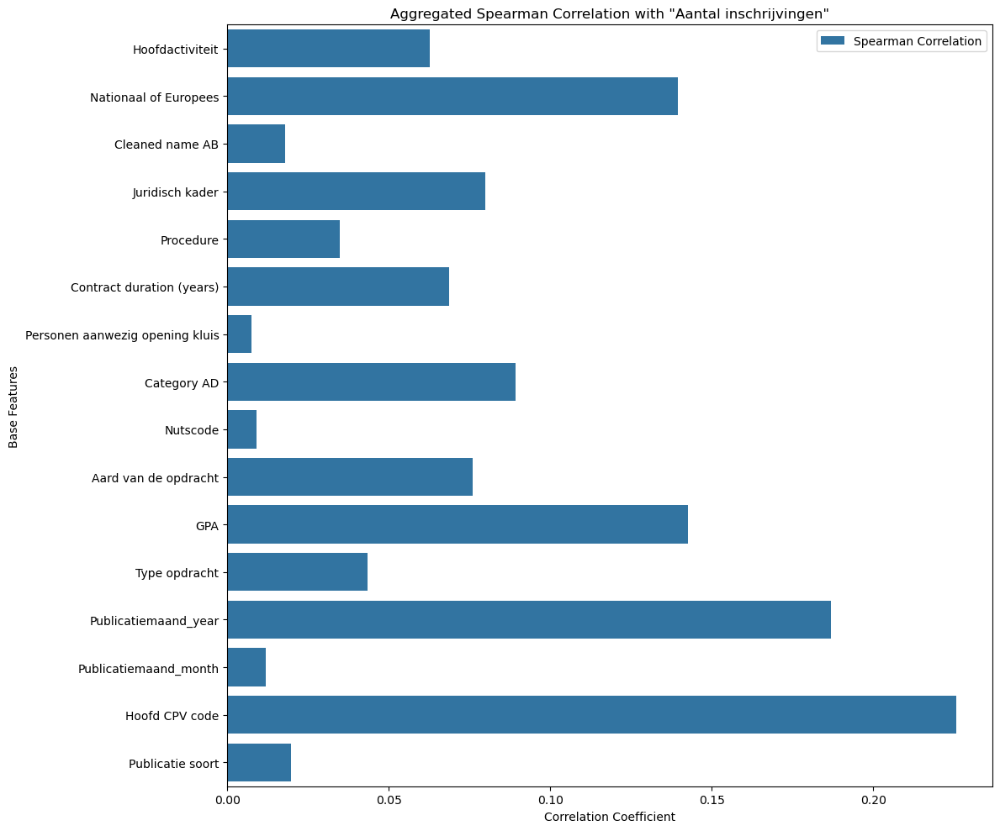

In [24]:
aggregated_results_df.reset_index(inplace=True)

spearman_results_df = aggregated_results_df[aggregated_results_df['Correlation_Type'] == 'Spearman Correlation']

plt.figure(figsize=(12, 10))
sns.barplot(data=spearman_results_df, y='index', x='Correlation_Value', hue='Correlation_Type', orient='h', palette=['#1f77b4'])
plt.title('Aggregated Spearman Correlation with "Aantal inschrijvingen"')
plt.ylabel('Base Features')
plt.xlabel('Correlation Coefficient')
plt.legend(loc='best')
plt.tight_layout()
plt.show()


In [46]:
spearman_results_df

,level_0,index,Correlation_Type,Correlation_Value
16,16,Hoofdactiviteit,Spearman Correlation,0.062714
17,17,Nationaal of Europees,Spearman Correlation,0.139386
18,18,Cleaned name AB,Spearman Correlation,0.018048
19,19,Juridisch kader,Spearman Correlation,0.079984
20,20,Procedure,Spearman Correlation,0.034945
21,21,Contract duration (years),Spearman Correlation,0.068811
22,22,Personen aanwezig opening kluis,Spearman Correlation,0.007463
23,23,Category AD,Spearman Correlation,0.089347
24,24,Nutscode,Spearman Correlation,0.009117
25,25,Aard van de opdracht,Spearman Correlation,0.076030


/var/folders/4w/2tspj8b910d0wfksxgqd4km80000gn/T/ipykernel_39054/867743058.py:13: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)


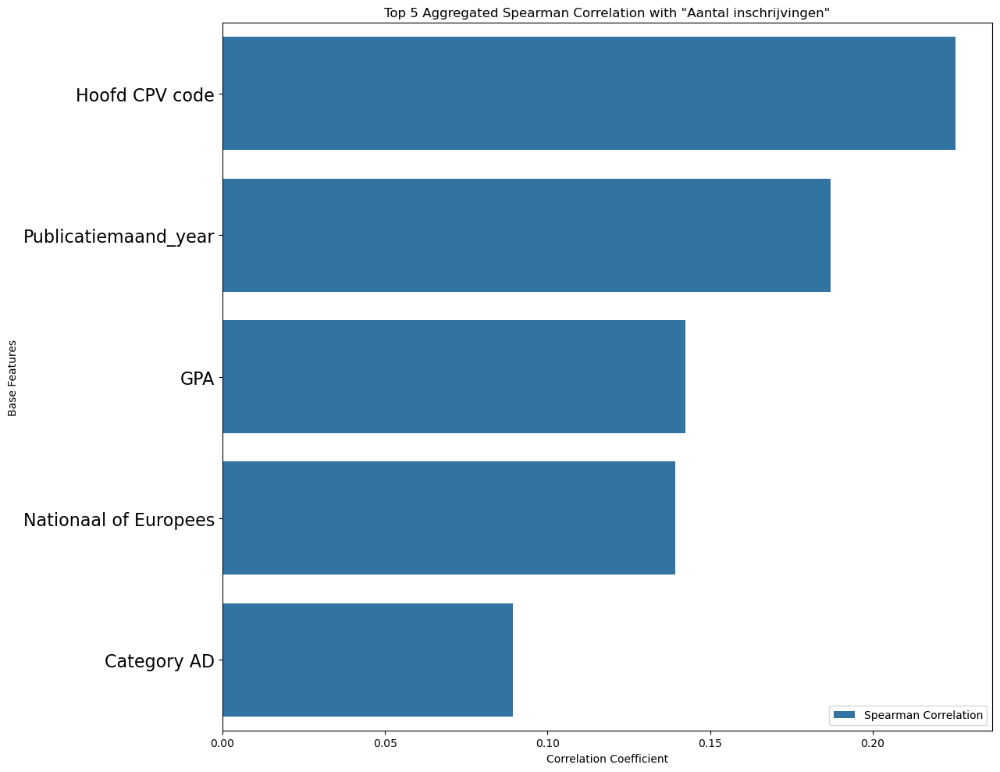

In [25]:
# get the top 5 
top_5_spearman = aggregated_results_df[aggregated_results_df['Correlation_Type'] == 'Spearman Correlation'].nlargest(5, 'Correlation_Value')

plt.figure(figsize=(12, 10))
ax = sns.barplot(data=top_5_spearman, y='index', x='Correlation_Value', hue='Correlation_Type', orient='h', palette=['#1f77b4'])
plt.title('Top 5 Aggregated Spearman Correlation with "Aantal inschrijvingen"')
plt.ylabel('Base Features')
plt.xlabel('Correlation Coefficient')
plt.legend(loc='best')
plt.tight_layout()

# increase font
ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)

plt.show()



### Group based on CPV code

#### Change data type

In [26]:
df_fi['Publicatiemaand'] = pd.to_datetime(df_fi['Publicatiemaand'], errors='coerce')

print(df_fi['Publicatiemaand'].dtypes)

df_fi.info()

datetime64[ns]
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13993 entries, 0 to 13992
Data columns (total 16 columns):
 #   Column                           Non-Null Count  Dtype         
---  ------                           --------------  -----         
 0   Publicatiemaand                  13993 non-null  datetime64[ns]
 1   Cleaned name AB                  13993 non-null  object        
 2   Category AD                      13993 non-null  object        
 3   Personen aanwezig opening kluis  13993 non-null  object        
 4   Nationaal of Europees            13993 non-null  object        
 5   Publicatie soort                 13993 non-null  object        
 6   Juridisch kader                  13993 non-null  object        
 7   Type opdracht                    13993 non-null  object        
 8   Procedure                        6322 non-null   object        
 9   Hoofd CPV code                   13993 non-null  int64         
 10  Nutscode                         6322 non-n

In [27]:
def preprocess_data_auto(df, exclude_col=None):
    
    datetime_cols = df.select_dtypes(include=['datetime64']).columns.tolist()
    
    for col in datetime_cols:
        df[col + '_year'] = df[col].dt.year
        df[col + '_month'] = df[col].dt.month
        df.drop(columns=col, inplace=True)
    
    categorical_cols = df.select_dtypes(include=['object', 'category']).columns.tolist()
    print(categorical_cols)
    
    if exclude_col and exclude_col in categorical_cols:
        categorical_cols = [col for col in categorical_cols if col != exclude_col]
    
    encoder = OneHotEncoder(sparse_output=False, handle_unknown='ignore')
    encoded_features = encoder.fit_transform(df[categorical_cols])
    encoded_df = pd.DataFrame(encoded_features, columns=encoder.get_feature_names_out(categorical_cols))
    
    df.drop(columns=categorical_cols, inplace=True)
    df = pd.concat([df.reset_index(drop=True), encoded_df.reset_index(drop=True)], axis=1)
    
    return df

In [28]:
df_corr = preprocess_data_auto(df_fi, exclude_col='Hoofd CPV code')

display(df_corr)

['Cleaned name AB', 'Category AD', 'Personen aanwezig opening kluis', 'Nationaal of Europees', 'Publicatie soort', 'Juridisch kader', 'Type opdracht', 'Procedure', 'Nutscode', 'Aard van de opdracht', 'GPA', 'Hoofdactiviteit']


,Hoofd CPV code,Aantal inschrijvingen,Contract duration (years),Publicatiemaand_year,Publicatiemaand_month,Cleaned name AB_ABG-organisatie,Cleaned name AB_Avri,Cleaned name AB_BAR-gemeente,Cleaned name AB_Bizob,Cleaned name AB_Blink GRR,...,Hoofdactiviteit_Elektriciteit,Hoofdactiviteit_Huisvesting en gemeenschappelijke voorzieningen,Hoofdactiviteit_Milieu,Hoofdactiviteit_Onderwijs,Hoofdactiviteit_Openbare orde en veiligheid,"Hoofdactiviteit_Recreatie, cultuur en godsdienst","Hoofdactiviteit_Stadsspoorweg-, tram-, trolleybus- of busdiensten",Hoofdactiviteit_Vervoersdiensten per spoor,Hoofdactiviteit_Water,Hoofdactiviteit_nan
0,90,3.0,1.915068,2016,4,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,45,10.0,3.917808,2016,4,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,50,16.0,3.255619,2016,4,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,50,16.0,3.255619,2016,4,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,50,16.0,3.255619,2016,4,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13988,71,17.0,4.920548,2023,12,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13989,71,17.0,4.920548,2023,12,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13990,71,17.0,4.920548,2023,12,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13991,71,17.0,4.920548,2023,12,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [29]:
cpv_counts = df_corr['Hoofd CPV code'].value_counts().reset_index()

cpv_counts.columns = ['Hoofd CPV code', 'count']

low_amount = cpv_counts[cpv_counts['count'] < 100]

print(cpv_counts)

print(low_amount)

   Hoofd CPV code  count
0              71   6722
1              50   3679
2              45   2335
3              90   1257
Empty DataFrame
Columns: [Hoofd CPV code, count]
Index: []


### Determine correlation per cpv group

In [30]:
correlation_dfs = {}

grouped = df_corr.groupby('Hoofd CPV code')

for name, group in grouped:
    print(name)
    
    # calculate spearman correlations
    pearson_correlation = group.corr(method='pearson')['Aantal inschrijvingen'].drop(['Aantal inschrijvingen', 'Hoofd CPV code'])
    spearman_correlation = group.corr(method='spearman')['Aantal inschrijvingen'].drop(['Aantal inschrijvingen', 'Hoofd CPV code'])
    
    correlation_results = pd.DataFrame({
        'Variable': pearson_correlation.index,
        'Pearson Correlation': pearson_correlation.values,
        'Spearman Correlation': spearman_correlation.values
    })
    
    correlation_dfs[str(name)] = correlation_results


45
50
71
90


In [31]:
for cpv_code in correlation_dfs.keys():
    print("Processing CPV code:", cpv_code)
    df = correlation_dfs[cpv_code]

    clean_df = df.dropna(subset=['Pearson Correlation', 'Spearman Correlation'])
    display(clean_df)

Processing CPV code: 45


,Variable,Pearson Correlation,Spearman Correlation
0,Contract duration (years),-0.313631,-0.372514
1,Publicatiemaand_year,-0.199316,-0.173179
2,Publicatiemaand_month,0.053705,0.034469
4,Cleaned name AB_Avri,0.042361,0.033844
5,Cleaned name AB_BAR-gemeente,-0.012785,-0.002596
...,...,...,...
669,"Hoofdactiviteit_Recreatie, cultuur en godsdienst",-0.011070,-0.002247
670,"Hoofdactiviteit_Stadsspoorweg-, tram-, trolley...",-0.011238,0.000656
671,Hoofdactiviteit_Vervoersdiensten per spoor,0.404322,0.442320
672,Hoofdactiviteit_Water,-0.013051,-0.006186


Processing CPV code: 50


,Variable,Pearson Correlation,Spearman Correlation
0,Contract duration (years),-0.092051,-0.158846
1,Publicatiemaand_year,-0.311748,-0.195707
2,Publicatiemaand_month,-0.017773,-0.048067
3,Cleaned name AB_ABG-organisatie,-0.001290,0.008400
4,Cleaned name AB_Avri,-0.022224,-0.036445
...,...,...,...
668,Hoofdactiviteit_Openbare orde en veiligheid,-0.107386,-0.162040
670,"Hoofdactiviteit_Stadsspoorweg-, tram-, trolley...",-0.022955,-0.020104
671,Hoofdactiviteit_Vervoersdiensten per spoor,-0.062593,-0.060487
672,Hoofdactiviteit_Water,-0.008586,0.000037


Processing CPV code: 71


,Variable,Pearson Correlation,Spearman Correlation
0,Contract duration (years),0.088125,0.120485
1,Publicatiemaand_year,-0.107097,-0.149619
2,Publicatiemaand_month,-0.017517,-0.014364
3,Cleaned name AB_ABG-organisatie,0.000179,0.006490
5,Cleaned name AB_BAR-gemeente,-0.044219,-0.050681
...,...,...,...
668,Hoofdactiviteit_Openbare orde en veiligheid,-0.084303,-0.101184
670,"Hoofdactiviteit_Stadsspoorweg-, tram-, trolley...",-0.012628,-0.015468
671,Hoofdactiviteit_Vervoersdiensten per spoor,-0.164204,-0.185440
672,Hoofdactiviteit_Water,0.156075,0.221785


Processing CPV code: 90


,Variable,Pearson Correlation,Spearman Correlation
0,Contract duration (years),0.091119,0.031959
1,Publicatiemaand_year,-0.314072,-0.301514
2,Publicatiemaand_month,-0.012795,-0.026852
4,Cleaned name AB_Avri,0.139716,0.111896
5,Cleaned name AB_BAR-gemeente,-0.056132,-0.072962
...,...,...,...
663,Hoofdactiviteit_Algemene overheidsdiensten,0.005859,-0.130287
665,Hoofdactiviteit_Huisvesting en gemeenschappeli...,-0.034717,0.066892
666,Hoofdactiviteit_Milieu,-0.041341,-0.061500
670,"Hoofdactiviteit_Stadsspoorweg-, tram-, trolley...",-0.050652,-0.075351


### Plot (raw) correlations

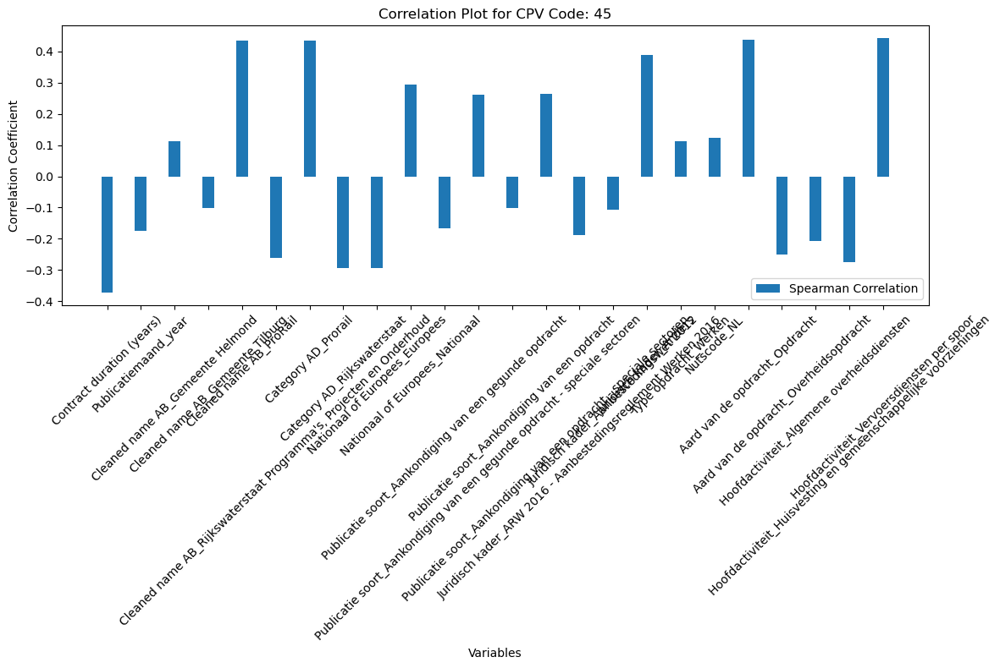

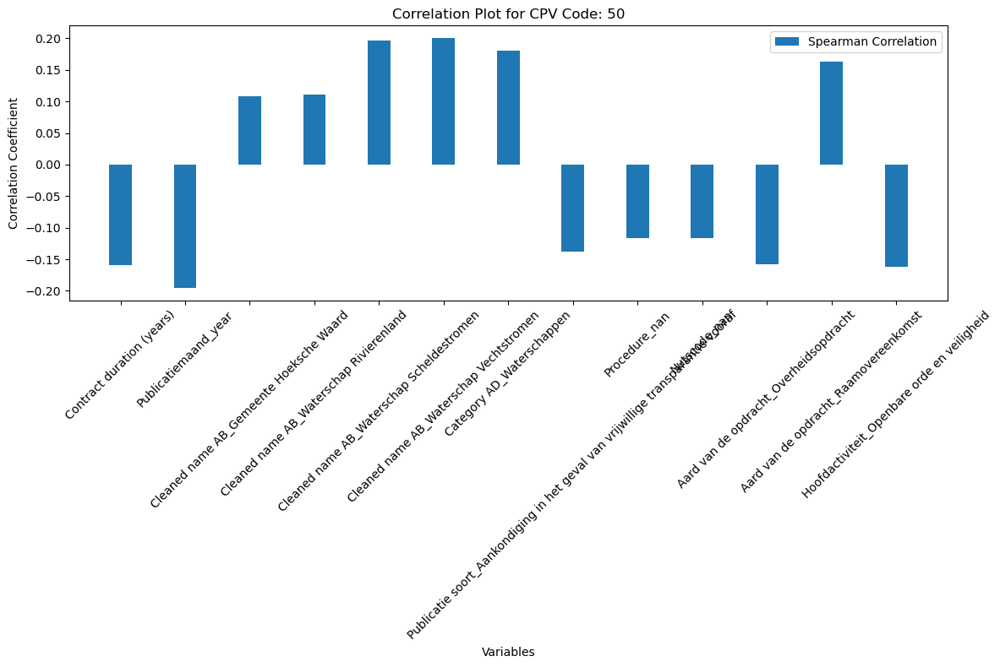

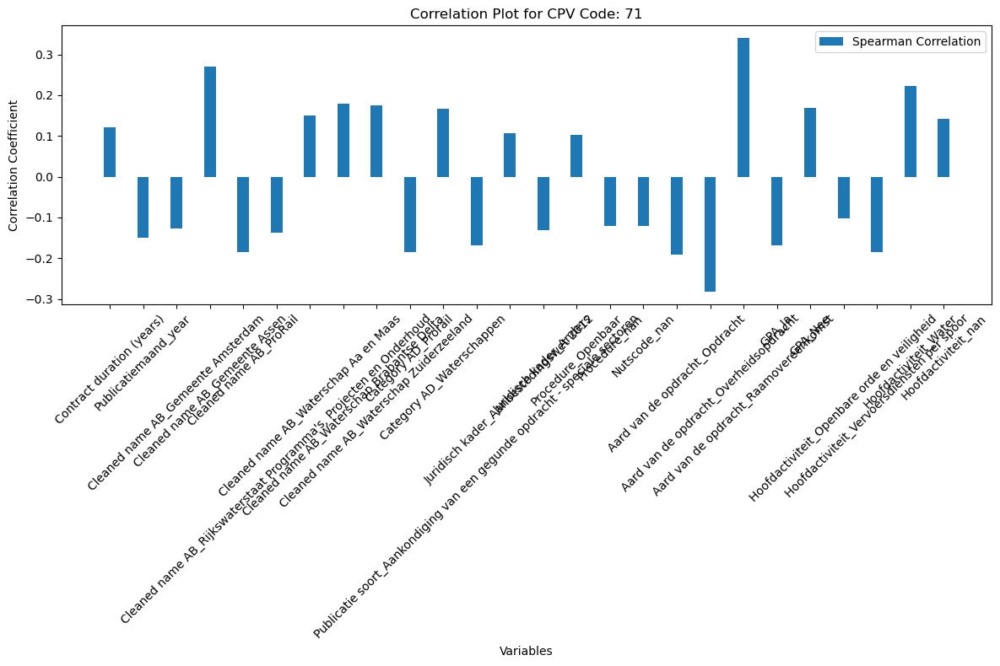

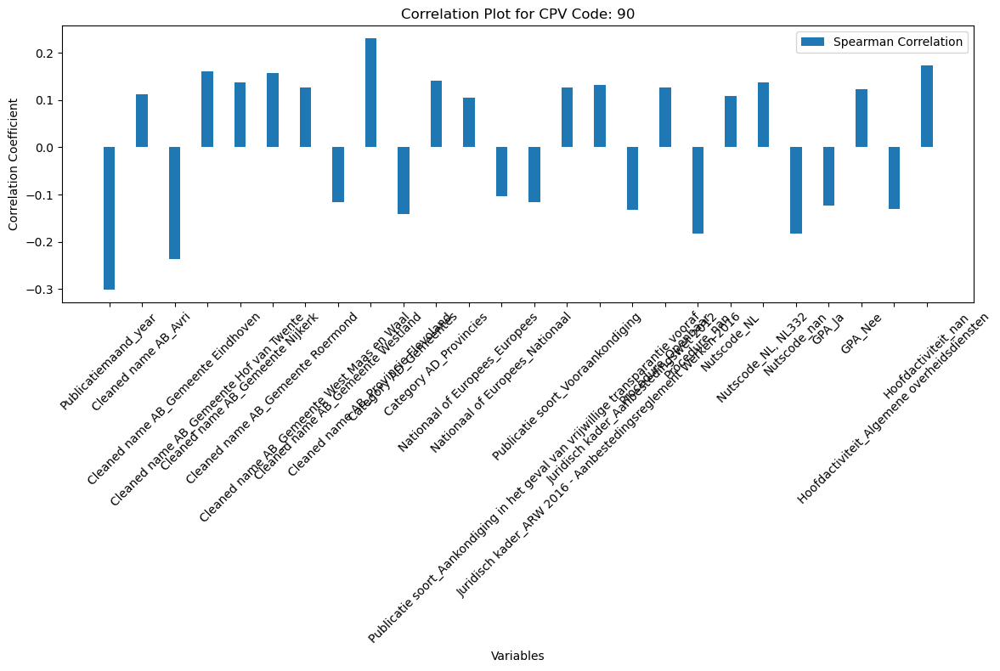

In [32]:
for cpv_code, df in correlation_dfs.items():
    df_filtered = df[df['Spearman Correlation'].abs() > 0.1]
    
    if not df_filtered.empty:
        plt.figure(figsize=(12, 8))  
        plt.title(f'Correlation Plot for CPV Code: {cpv_code}')
        
        bar_width = 0.35
        index = np.arange(len(df_filtered))  

        plt.bar(index, df_filtered['Spearman Correlation'], width=bar_width, label='Spearman Correlation', color='#1f77b4')

        plt.xlabel('Variables')
        plt.ylabel('Correlation Coefficient')
        plt.xticks(index, df_filtered['Variable'], rotation=45)  # Set variable names to x-ticks
        plt.legend()

        plt.tight_layout()
        plt.show()




### Aggregated correlations (based on mean absolute value)

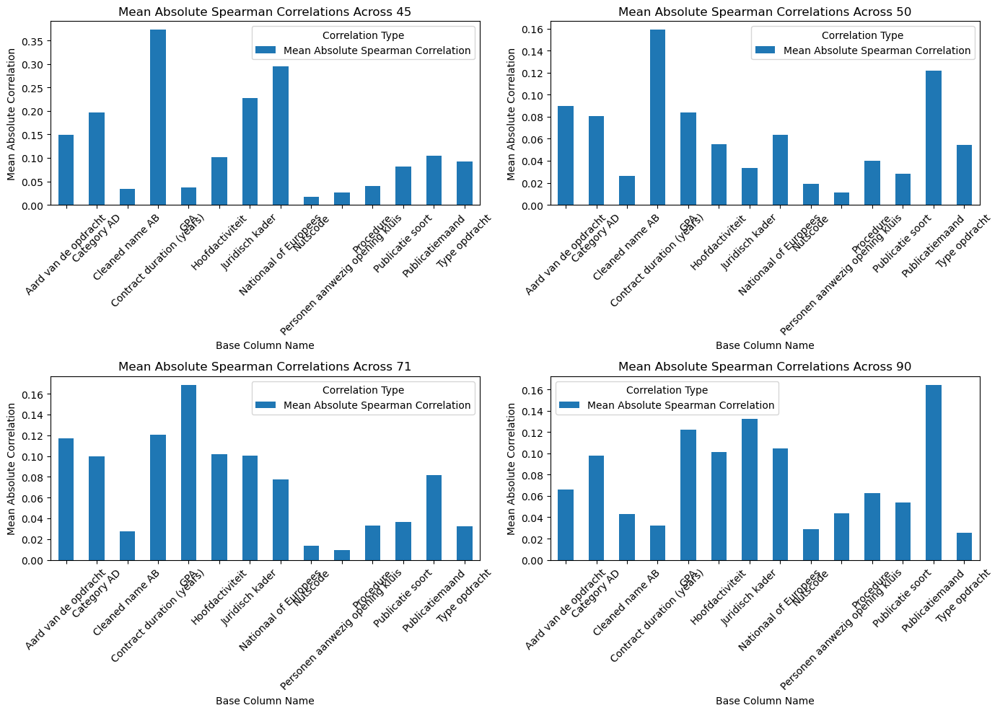

Aggregated Correlation Results for CPV Code: 45
                                 Mean Absolute Spearman Correlation
Aard van de opdracht                                       0.148381
Category AD                                                0.196226
Cleaned name AB                                            0.033479
Contract duration (years)                                  0.372514
GPA                                                        0.037653
Hoofdactiviteit                                            0.100916
Juridisch kader                                            0.227584
Nationaal of Europees                                      0.294339
Nutscode                                                   0.017374
Personen aanwezig opening kluis                            0.025984
Procedure                                                  0.040494
Publicatie soort                                           0.080729
Publicatiemaand                                            0.103824


In [33]:
all_aggregated_correlation_dfs = {}

for cpv_code, df in correlation_dfs.items():
    aggregated_correlations = {}

    df['Base Column Name'] = df['Variable'].apply(lambda x: x.split('_')[0])

    grouped = df.groupby('Base Column Name')

    for name, group in grouped:
        mean_spearman_abs = group['Spearman Correlation'].abs().mean()
        
        aggregated_correlations[name] = {
            'Mean Absolute Spearman Correlation': mean_spearman_abs
        }

    aggregated_correlation_df = pd.DataFrame.from_dict(aggregated_correlations, orient='index')

    all_aggregated_correlation_dfs[cpv_code] = aggregated_correlation_df

fig, axs = plt.subplots(2, 2, figsize=(14, 10))
axs = axs.flatten()

for i, (cpv_code, aggregated_correlation_df) in enumerate(all_aggregated_correlation_dfs.items()):
    ax = axs[i]

    aggregated_correlation_df.plot(kind='bar', ax=ax, color=['#1f77b4'])

    ax.set_title(f'Mean Absolute Spearman Correlations Across {cpv_code}')
    ax.set_xlabel('Base Column Name')
    ax.set_ylabel('Mean Absolute Correlation')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45)  # Rotate x-ticks for better readability
    ax.legend(title="Correlation Type")

plt.tight_layout()

plt.show()

for cpv_code, aggregated_correlation_df in all_aggregated_correlation_dfs.items():
    print(f"Aggregated Correlation Results for CPV Code: {cpv_code}")
    print(aggregated_correlation_df)


In [34]:
cpv_counts = df_fi['Hoofd CPV code'].value_counts().reset_index()

cpv_counts.columns = ['Hoofd CPV code', 'count']

low_amount = cpv_counts[cpv_counts['count'] < 100]

print(cpv_counts)

print(low_amount)

   Hoofd CPV code  count
0              71   6722
1              50   3679
2              45   2335
3              90   1257
Empty DataFrame
Columns: [Hoofd CPV code, count]
Index: []


In [43]:
file_path_correlation = '/Users/mohamedhajji/Documents/RWS full/RWS final data/all_aggregated_correlation_df.csv'

# all_aggregated_correlation_dfs.to_csv(file_path_correlation)

# Base directory for saving CSV files
base_dir = '/Users/mohamedhajji/Documents/RWS full/RWS final data/'

# Iterate over the dictionary and save each DataFrame as a CSV file
for key, df in all_aggregated_correlation_dfs.items():
    file_path = base_dir + key + '_correlation_df.csv'  # Creates a unique path for each DataFrame
    df.to_csv(file_path, index=False)  # Save DataFrame to CSV without the index
    print(key)
    display(df)



45


,Mean Absolute Spearman Correlation
Aard van de opdracht,0.148381
Category AD,0.196226
Cleaned name AB,0.033479
Contract duration (years),0.372514
GPA,0.037653
Hoofdactiviteit,0.100916
Juridisch kader,0.227584
Nationaal of Europees,0.294339
Nutscode,0.017374
Personen aanwezig opening kluis,0.025984


50


,Mean Absolute Spearman Correlation
Aard van de opdracht,0.089449
Category AD,0.080448
Cleaned name AB,0.026038
Contract duration (years),0.158846
GPA,0.083932
Hoofdactiviteit,0.055230
Juridisch kader,0.033156
Nationaal of Europees,0.063793
Nutscode,0.019175
Personen aanwezig opening kluis,0.011094


71


,Mean Absolute Spearman Correlation
Aard van de opdracht,0.116955
Category AD,0.099645
Cleaned name AB,0.027627
Contract duration (years),0.120485
GPA,0.168489
Hoofdactiviteit,0.101799
Juridisch kader,0.100310
Nationaal of Europees,0.077432
Nutscode,0.013466
Personen aanwezig opening kluis,0.009374


90


,Mean Absolute Spearman Correlation
Aard van de opdracht,0.065816
Category AD,0.097578
Cleaned name AB,0.043337
Contract duration (years),0.031959
GPA,0.122365
Hoofdactiviteit,0.101346
Juridisch kader,0.132411
Nationaal of Europees,0.104341
Nutscode,0.029018
Personen aanwezig opening kluis,0.043600


### Top 5 features with highest mean absolute correlation

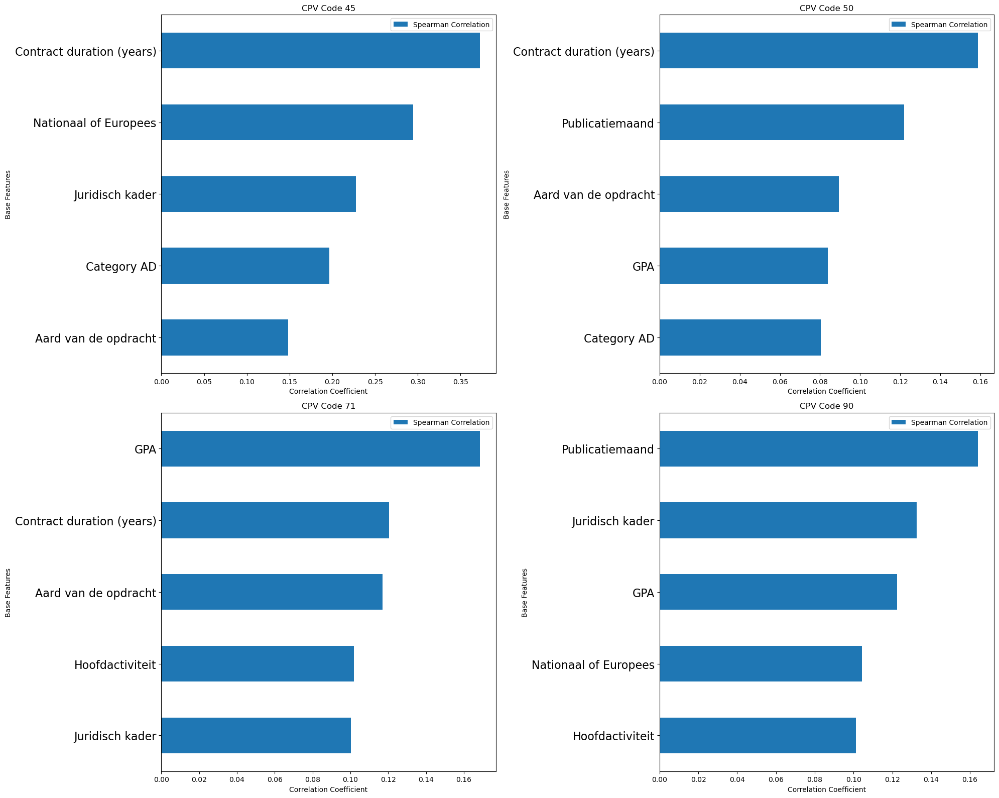

Aggregated Correlation Results for CPV Code: 45
                                 Mean Absolute Spearman Correlation
Aard van de opdracht                                       0.148381
Category AD                                                0.196226
Cleaned name AB                                            0.033479
Contract duration (years)                                  0.372514
GPA                                                        0.037653
Hoofdactiviteit                                            0.100916
Juridisch kader                                            0.227584
Nationaal of Europees                                      0.294339
Nutscode                                                   0.017374
Personen aanwezig opening kluis                            0.025984
Procedure                                                  0.040494
Publicatie soort                                           0.080729
Publicatiemaand                                            0.103824


In [44]:
def plot_top_correlations(cpv_code, df, ax):
    aggregated_correlations = {}

    df['Base Column Name'] = df['Variable'].apply(lambda x: x.split('_')[0])

    grouped = df.groupby('Base Column Name')

    # calculate mean absolute spearman correlations for each group
    for name, group in grouped:
        mean_spearman_abs = group['Spearman Correlation'].abs().mean()
        
        aggregated_correlations[name] = {
            'Mean Absolute Spearman Correlation': mean_spearman_abs
        }

    aggregated_correlation_df = pd.DataFrame.from_dict(aggregated_correlations, orient='index')

    # sort based on correlation and take top 5
    top_5_spearman = aggregated_correlation_df.nlargest(5, 'Mean Absolute Spearman Correlation')

    top_5_spearman = top_5_spearman.sort_values(by='Mean Absolute Spearman Correlation', ascending=True)

    top_5_spearman.plot(kind='barh', stacked=False, color=['#1f77b4'], ax=ax)
    
    ax.set_title(f'CPV Code {cpv_code}')
    ax.set_xlabel('Correlation Coefficient')
    ax.set_ylabel('Base Features')
    
    ax.legend(['Spearman Correlation'])

    ax.set_yticklabels(ax.get_yticklabels(), fontsize=16)

fig, axes = plt.subplots(2, 2, figsize=(20, 16))

axes = axes.flatten()

for i, (cpv_code, df) in enumerate(correlation_dfs.items()):
    if i < 4:  
        plot_top_correlations(cpv_code, df, axes[i])

plt.tight_layout()
plt.show()

for cpv_code, aggregated_correlation_df in all_aggregated_correlation_dfs.items():
    print(f"Aggregated Correlation Results for CPV Code: {cpv_code}")
    print(aggregated_correlation_df)

In [45]:
top_correlations_summary = [] 

for cpv_code, df in correlation_dfs.items():
    aggregated_correlations = {}

    df['Base Column Name'] = df['Variable'].apply(lambda x: x.split('_')[0])

    grouped = df.groupby('Base Column Name')

    for name, group in grouped:
        mean_pearson_abs = group['Pearson Correlation'].abs().mean()
        mean_spearman_abs = group['Spearman Correlation'].abs().mean()
        
        aggregated_correlations[name] = {
            'Mean Absolute Pearson Correlation': mean_pearson_abs,
            'Mean Absolute Spearman Correlation': mean_spearman_abs
        }

    aggregated_correlation_df = pd.DataFrame.from_dict(aggregated_correlations, orient='index')

    top_pearson = aggregated_correlation_df.nlargest(5, 'Mean Absolute Pearson Correlation')
    top_pearson = top_pearson['Mean Absolute Pearson Correlation']

    top_spearman = aggregated_correlation_df.nlargest(5, 'Mean Absolute Spearman Correlation')
    top_spearman = top_spearman['Mean Absolute Spearman Correlation']

    top_correlations_summary.append({
        'CPV Code': cpv_code,
        'Top 5 Pearson': top_pearson.index.tolist(),
        'Top 5 Spearman': top_spearman.index.tolist()
    })

top_correlations_summary_df = pd.DataFrame(top_correlations_summary)

print(top_correlations_summary_df)


  CPV Code                                      Top 5 Pearson  \
0       45  [Contract duration (years), Nationaal of Europ...   
1       50  [Publicatiemaand, Category AD, Contract durati...   
2       71  [Nationaal of Europees, Aard van de opdracht, ...   
3       90  [Category AD, Publicatiemaand, GPA, Contract d...   

                                      Top 5 Spearman  
0  [Contract duration (years), Nationaal of Europ...  
1  [Contract duration (years), Publicatiemaand, A...  
2  [GPA, Contract duration (years), Aard van de o...  
3  [Publicatiemaand, Juridisch kader, GPA, Nation...  


## Tree based analysis

In [840]:
file_path_FI = '/Users/mohamedhajji/Documents/RWS full/RWS final data/df_full_imputed.csv'

df_fi = pd.read_csv(file_path_FI)

df_fi.head()

,Publicatiemaand,Cleaned name AB,Category AD,Personen aanwezig opening kluis,Nationaal of Europees,Publicatie soort,Juridisch kader,Type opdracht,Procedure,Hoofd CPV code,Nutscode,Aard van de opdracht,GPA,Hoofdactiviteit,Aantal inschrijvingen,Contract duration (years)
0,2016-04-01,Gemeente Den Haag,Gemeentes,Nee,Europees,"Kennisgeving van aanvullende informatie, infor...",ARW 2016 - Aanbestedingsreglement Werken 2016,Diensten,Openbaar,90,NL,Overheidsopdracht,Ja,Algemene overheidsdiensten,3.0,1.915068
1,2016-04-01,Gemeente Den Haag,Gemeentes,Nee,Europees,Aankondiging van een gegunde opdracht,Aanbestedingswet 2012,Leveringen,Openbaar,45,NL,Overheidsopdracht,Ja,Algemene overheidsdiensten,10.0,3.917808
2,2016-04-01,Waterschap Vechtstromen,Waterschappen,Nee,Europees,Aankondiging van een gegunde opdracht,Aanbestedingswet 2012,Diensten,Openbaar,50,NL,Raamovereenkomst,Ja,Algemene overheidsdiensten,16.0,3.255619
3,2016-04-01,Waterschap Vechtstromen,Waterschappen,Nee,Europees,Aankondiging van een gegunde opdracht,Aanbestedingswet 2012,Diensten,Openbaar,50,NL,Raamovereenkomst,Ja,Algemene overheidsdiensten,16.0,3.255619
4,2016-04-01,Waterschap Vechtstromen,Waterschappen,Nee,Europees,Aankondiging van een gegunde opdracht,Aanbestedingswet 2012,Diensten,Openbaar,50,NL,Raamovereenkomst,Ja,Algemene overheidsdiensten,16.0,3.255619


In [841]:
df_fi['Publicatiemaand'] = pd.to_datetime(df_fi['Publicatiemaand'], errors='coerce')

# Verify the conversion
print(df_fi['Publicatiemaand'].dtypes)

df_fi.info()

datetime64[ns]
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13993 entries, 0 to 13992
Data columns (total 16 columns):
 #   Column                           Non-Null Count  Dtype         
---  ------                           --------------  -----         
 0   Publicatiemaand                  13993 non-null  datetime64[ns]
 1   Cleaned name AB                  13993 non-null  object        
 2   Category AD                      13993 non-null  object        
 3   Personen aanwezig opening kluis  13993 non-null  object        
 4   Nationaal of Europees            13993 non-null  object        
 5   Publicatie soort                 13993 non-null  object        
 6   Juridisch kader                  13993 non-null  object        
 7   Type opdracht                    13993 non-null  object        
 8   Procedure                        6322 non-null   object        
 9   Hoofd CPV code                   13993 non-null  int64         
 10  Nutscode                         6322 non-n

In [842]:
df_model = df_fi.copy()

df_model

,Publicatiemaand,Cleaned name AB,Category AD,Personen aanwezig opening kluis,Nationaal of Europees,Publicatie soort,Juridisch kader,Type opdracht,Procedure,Hoofd CPV code,Nutscode,Aard van de opdracht,GPA,Hoofdactiviteit,Aantal inschrijvingen,Contract duration (years)
0,2016-04-01,Gemeente Den Haag,Gemeentes,Nee,Europees,"Kennisgeving van aanvullende informatie, infor...",ARW 2016 - Aanbestedingsreglement Werken 2016,Diensten,Openbaar,90,NL,Overheidsopdracht,Ja,Algemene overheidsdiensten,3.0,1.915068
1,2016-04-01,Gemeente Den Haag,Gemeentes,Nee,Europees,Aankondiging van een gegunde opdracht,Aanbestedingswet 2012,Leveringen,Openbaar,45,NL,Overheidsopdracht,Ja,Algemene overheidsdiensten,10.0,3.917808
2,2016-04-01,Waterschap Vechtstromen,Waterschappen,Nee,Europees,Aankondiging van een gegunde opdracht,Aanbestedingswet 2012,Diensten,Openbaar,50,NL,Raamovereenkomst,Ja,Algemene overheidsdiensten,16.0,3.255619
3,2016-04-01,Waterschap Vechtstromen,Waterschappen,Nee,Europees,Aankondiging van een gegunde opdracht,Aanbestedingswet 2012,Diensten,Openbaar,50,NL,Raamovereenkomst,Ja,Algemene overheidsdiensten,16.0,3.255619
4,2016-04-01,Waterschap Vechtstromen,Waterschappen,Nee,Europees,Aankondiging van een gegunde opdracht,Aanbestedingswet 2012,Diensten,Openbaar,50,NL,Raamovereenkomst,Ja,Algemene overheidsdiensten,16.0,3.255619
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13988,2023-12-01,Rijkswaterstaat Centrale Informatievoorziening,Rijkswaterstaat,Nee,Europees,Aankondiging gegunde opdracht - algemene richt...,Aanbestedingswet 2012,Diensten,NaN,71,NaN,Overheidsopdracht,Ja,Huisvesting en gemeenschappelijke voorzieningen,17.0,4.920548
13989,2023-12-01,Rijkswaterstaat Centrale Informatievoorziening,Rijkswaterstaat,Nee,Europees,Aankondiging gegunde opdracht - algemene richt...,Aanbestedingswet 2012,Diensten,NaN,71,NaN,Overheidsopdracht,Ja,Huisvesting en gemeenschappelijke voorzieningen,17.0,4.920548
13990,2023-12-01,Rijkswaterstaat Centrale Informatievoorziening,Rijkswaterstaat,Nee,Europees,Aankondiging gegunde opdracht - algemene richt...,Aanbestedingswet 2012,Diensten,NaN,71,NaN,Overheidsopdracht,Ja,Huisvesting en gemeenschappelijke voorzieningen,17.0,4.920548
13991,2023-12-01,Rijkswaterstaat Centrale Informatievoorziening,Rijkswaterstaat,Nee,Europees,Aankondiging gegunde opdracht - algemene richt...,Aanbestedingswet 2012,Diensten,NaN,71,NaN,Overheidsopdracht,Ja,Huisvesting en gemeenschappelijke voorzieningen,17.0,4.920548


### Preprocess df

In [843]:
df_feature = preprocess_data_auto(df_model, exclude_col= 'Hoofd CPV code')

df_feature

['Cleaned name AB', 'Category AD', 'Personen aanwezig opening kluis', 'Nationaal of Europees', 'Publicatie soort', 'Juridisch kader', 'Type opdracht', 'Procedure', 'Nutscode', 'Aard van de opdracht', 'GPA', 'Hoofdactiviteit']


,Hoofd CPV code,Aantal inschrijvingen,Contract duration (years),Publicatiemaand_year,Publicatiemaand_month,Cleaned name AB_ABG-organisatie,Cleaned name AB_Avri,Cleaned name AB_BAR-gemeente,Cleaned name AB_Bizob,Cleaned name AB_Blink GRR,...,Hoofdactiviteit_Elektriciteit,Hoofdactiviteit_Huisvesting en gemeenschappelijke voorzieningen,Hoofdactiviteit_Milieu,Hoofdactiviteit_Onderwijs,Hoofdactiviteit_Openbare orde en veiligheid,"Hoofdactiviteit_Recreatie, cultuur en godsdienst","Hoofdactiviteit_Stadsspoorweg-, tram-, trolleybus- of busdiensten",Hoofdactiviteit_Vervoersdiensten per spoor,Hoofdactiviteit_Water,Hoofdactiviteit_nan
0,90,3.0,1.915068,2016,4,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,45,10.0,3.917808,2016,4,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,50,16.0,3.255619,2016,4,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,50,16.0,3.255619,2016,4,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,50,16.0,3.255619,2016,4,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13988,71,17.0,4.920548,2023,12,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13989,71,17.0,4.920548,2023,12,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13990,71,17.0,4.920548,2023,12,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13991,71,17.0,4.920548,2023,12,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### per industry (CPV code)

#### Average per contract duration per cpv

In [845]:
def calculate_average_registrations(df, contract_durations):
    avg_registrations = []
    for duration in contract_durations:
        mask = (df['Contract duration (years)'] >= (duration - 0.5)) & (df['Contract duration (years)'] <= (duration + 0.5))
        if df[mask].empty:
            closest_duration = df['Contract duration (years)'].iloc[(df['Contract duration (years)'] - duration).abs().argsort()[:1]].values[0]
            avg_value = df[df['Contract duration (years)'] == closest_duration]['Aantal inschrijvingen'].mean()
        else:
            avg_value = df[mask]['Aantal inschrijvingen'].mean()
        avg_registrations.append(avg_value)
    return avg_registrations

def average_registrations_per_cpv(df):
    unique_cpv_codes = df['Hoofd CPV code'].unique()
    results = {}
    contract_durations = np.arange(0, 10)  # From 0 to 10 years

    for cpv_code in unique_cpv_codes:
        df_cpv = df[df['Hoofd CPV code'] == cpv_code]
        avg_registrations = calculate_average_registrations(df_cpv, contract_durations)
        
        for i in range(1, len(avg_registrations)):
            if np.isnan(avg_registrations[i]):
                avg_registrations[i] = avg_registrations[i-1]
        
        results[cpv_code] = avg_registrations
    
    return results

results = average_registrations_per_cpv(df_feature)

results_df = pd.DataFrame(results, index=np.arange(0, 10))
print(results_df)


         90        45        50        71
0  4.500000  6.553719  4.217391  3.355932
1  3.911111  7.618954  4.523256  3.983945
2  3.354508  5.345938  4.441119  7.829330
3  3.645545  4.489960  4.467112  8.180499
4  5.182857  4.038647  3.360606  6.466546
5  2.240000  5.347826  3.664430  7.117647
6  2.076923  2.833333  2.300000  6.935484
7  3.000000  3.500000  1.666667  2.941176
8  3.000000  3.500000  1.000000  5.000000
9  3.000000  3.500000  1.000000  5.000000


In [846]:

missing_data = df_feature.isna().sum()

columns_with_missing_data = missing_data[missing_data > 0]

if not columns_with_missing_data.empty:
    print("Columns with missing values:")
    for column, missing_count in columns_with_missing_data.items():
        print(f"{column}: {missing_count} missing values")
else:
    print("No columns have missing values.")

No columns have missing values.


In [847]:
df_feature

,Hoofd CPV code,Aantal inschrijvingen,Contract duration (years),Publicatiemaand_year,Publicatiemaand_month,Cleaned name AB_ABG-organisatie,Cleaned name AB_Avri,Cleaned name AB_BAR-gemeente,Cleaned name AB_Bizob,Cleaned name AB_Blink GRR,...,Hoofdactiviteit_Elektriciteit,Hoofdactiviteit_Huisvesting en gemeenschappelijke voorzieningen,Hoofdactiviteit_Milieu,Hoofdactiviteit_Onderwijs,Hoofdactiviteit_Openbare orde en veiligheid,"Hoofdactiviteit_Recreatie, cultuur en godsdienst","Hoofdactiviteit_Stadsspoorweg-, tram-, trolleybus- of busdiensten",Hoofdactiviteit_Vervoersdiensten per spoor,Hoofdactiviteit_Water,Hoofdactiviteit_nan
0,90,3.0,1.915068,2016,4,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,45,10.0,3.917808,2016,4,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,50,16.0,3.255619,2016,4,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,50,16.0,3.255619,2016,4,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,50,16.0,3.255619,2016,4,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13988,71,17.0,4.920548,2023,12,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13989,71,17.0,4.920548,2023,12,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13990,71,17.0,4.920548,2023,12,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13991,71,17.0,4.920548,2023,12,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### XGBoost

In [848]:
def extract_datetime_features(df, datetime_cols):
    for col in datetime_cols:
        if not np.issubdtype(df[col].dtype, np.datetime64):
            df[col] = pd.to_datetime(df[col])
        df[col + '_year'] = df[col].dt.year
        df[col + '_month'] = df[col].dt.month
        df[col + '_day'] = df[col].dt.day
    df = df.drop(columns=datetime_cols)  
    return df

# define parameters
param_grid_xgb = {
    'model__n_estimators': [100, 200, 300],
    'model__learning_rate': [0.01, 0.05, 0.1],
    'model__max_depth': [3, 5, 7]
}

In [849]:
def process_and_plot_for_cpv(cpv_code, df, avg_registrations_df):
    try:
        # filter data based on needed CPV code 
        df_cpv = df[df['Hoofd CPV code'] == cpv_code]

        # determine average
        avg_registrations = df_cpv['Aantal inschrijvingen'].mean()

        # separate features and target
        X = df_cpv.drop('Aantal inschrijvingen', axis=1)
        y = df_cpv['Aantal inschrijvingen']

        # extract datetime features
        datetime_cols = X.select_dtypes(include=['datetime']).columns
        X = extract_datetime_features(X, datetime_cols)

        categorical_cols = X.select_dtypes(include=['object', 'category']).columns
        numeric_cols = X.select_dtypes(include=['number']).columns

        preprocessor = ColumnTransformer(
            transformers=[
                ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_cols)
            ],
            remainder='passthrough'  # passthrough numeric columns
        )

        # XGBoost
        model_xgb = xgb.XGBRegressor(random_state=0)

        # pipeline
        pipeline_xgb = Pipeline(steps=[('preprocessor', preprocessor),
                                       ('model', model_xgb)
                                      ])

        # split the data
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

        print(f"Number of data points in the training set: {len(X_train)}")
        print(f"Number of data points in the testing set: {len(X_test)}")

        # GridSearchCV for XGBoost
        grid_search_xgb = GridSearchCV(estimator=pipeline_xgb, param_grid=param_grid_xgb, cv=5, scoring='neg_mean_squared_error', verbose=1, n_jobs=-1)

        # GridSearchCV to data
        grid_search_xgb.fit(X_train, y_train)

        # get best parameters and best score for XGBoost
        best_params_xgb = grid_search_xgb.best_params_
        best_score_xgb = grid_search_xgb.best_score_

        print(f"CPV Code: {cpv_code}")
        print(f"Best parameters for XGBoost: {best_params_xgb}")
        print(f"Best cross-validation score for XGBoost: {best_score_xgb}")

        # use best estimator
        best_model_xgb = grid_search_xgb.best_estimator_
        y_pred_xgb = best_model_xgb.predict(X_test)
        
        # round to integer
        y_pred_xgb = np.round(y_pred_xgb).astype(int)
        
        # determine MSE, RMSE, MAE, and R2
        mse_xgb = mean_squared_error(y_test, y_pred_xgb)
        rmse_xgb = np.sqrt(mse_xgb)
        mae_xgb = mean_absolute_error(y_test, y_pred_xgb)
        r2_xgb = r2_score(y_test, y_pred_xgb)

        print(f"Test Mean Absolute Error with best XGBoost model for {cpv_code}: {mae_xgb}")
        print(f"Test Root Mean Squared Error with best XGBoost model for {cpv_code}: {rmse_xgb}")
        print(f"Test Mean Squared Error with best XGBoost model for {cpv_code}: {mse_xgb}")
        print(f"Test R-squared with best XGBoost model for {cpv_code}: {r2_xgb}")

        plt.figure(figsize=(10, 6))
        plt.scatter(X_test['Contract duration (years)'], y_test, color='blue', label='Actual')
        plt.scatter(X_test['Contract duration (years)'], y_pred_xgb, color='red', label='Predicted')
        plt.xlabel('Contract duration (years)')
        plt.ylabel('Aantal inschrijvingen')
        plt.title(f'Effect of Contract Duration on Number of Registrations for XGBoost - CPV {cpv_code}')
        plt.legend()
        plt.show()

        # determine maximum duration train
        max_contract_duration = X_train['Contract duration (years)'].max()

        # range of contract durations from 0 to the maximum
        contract_durations = np.arange(0, max_contract_duration + 1).reshape(-1, 1)
        contract_durations_df = pd.DataFrame(contract_durations, columns=['Contract duration (years)'])

        # prepare df for prediction
        template_row = X_train.iloc[0].copy()
        template_df = pd.DataFrame([template_row] * len(contract_durations_df), index=contract_durations_df.index)
        template_df['Contract duration (years)'] = contract_durations_df['Contract duration (years)']

        # generate predictions
        predicted_registrations_xgb = best_model_xgb.predict(template_df)

        # standard deviation of the errors 
        errors_xgb = y_test - y_pred_xgb
        std_error_xgb = errors_xgb.std()

        # upper and lower bounds 
        upper_bound_xgb = predicted_registrations_xgb + std_error_xgb
        lower_bound_xgb = predicted_registrations_xgb - std_error_xgb

        # get average registrations for  CPV 
        avg_registrations_per_duration = avg_registrations_df[cpv_code].values

        plt.figure(figsize=(10, 6))
        plt.plot(contract_durations, predicted_registrations_xgb, color='green', label='Predicted')
        plt.fill_between(contract_durations.flatten(), lower_bound_xgb, upper_bound_xgb, color='green', alpha=0.2, label='Error Margin')
        plt.plot(contract_durations, avg_registrations_per_duration[:len(contract_durations)], color='blue', linestyle='--', label='Average Registrations')
        plt.xlabel('Contract duration (years)')
        plt.ylabel('Aantal inschrijvingen')
        plt.title(f'Predicted Number of Registrations for Contract Durations for CPV {cpv_code} with Error Margins')
        plt.legend()
        plt.show()
    
    except Exception as e:
        print(f"An error occurred while processing CPV {cpv_code}: {e}")


Number of data points in the training set: 1005
Number of data points in the testing set: 252
Fitting 5 folds for each of 27 candidates, totalling 135 fits
CPV Code: 90
Best parameters for XGBoost: {'model__learning_rate': 0.1, 'model__max_depth': 7, 'model__n_estimators': 300}
Best cross-validation score for XGBoost: -1.581287247149143
Test Mean Absolute Error with best XGBoost model for 90: 0.746031746031746
Test Root Mean Squared Error with best XGBoost model for 90: 1.2408394495995603
Test Mean Squared Error with best XGBoost model for 90: 1.5396825396825398
Test R-squared with best XGBoost model for 90: 0.8017019688648404


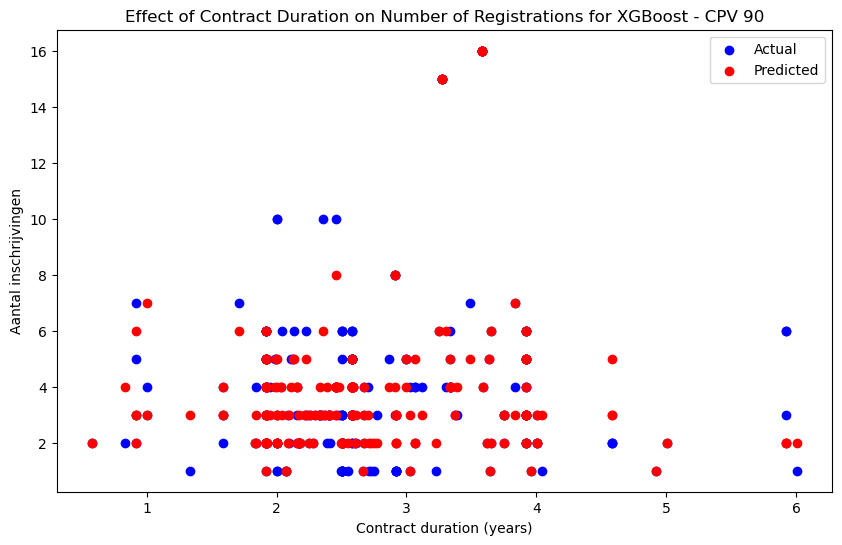

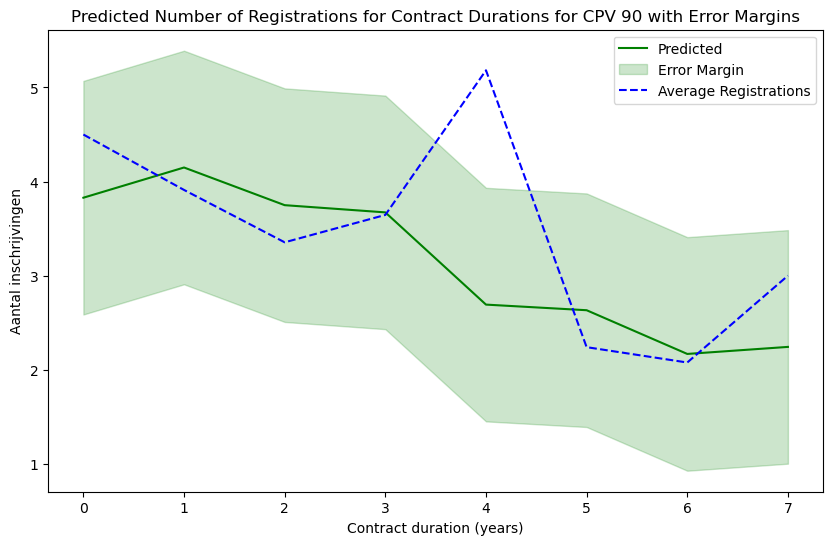

Number of data points in the training set: 1868
Number of data points in the testing set: 467
Fitting 5 folds for each of 27 candidates, totalling 135 fits
CPV Code: 45
Best parameters for XGBoost: {'model__learning_rate': 0.1, 'model__max_depth': 7, 'model__n_estimators': 300}
Best cross-validation score for XGBoost: -3.4219582264063035
Test Mean Absolute Error with best XGBoost model for 45: 1.0985010706638116
Test Root Mean Squared Error with best XGBoost model for 45: 1.6996031782735141
Test Mean Squared Error with best XGBoost model for 45: 2.8886509635974305
Test R-squared with best XGBoost model for 45: 0.7836295170274428


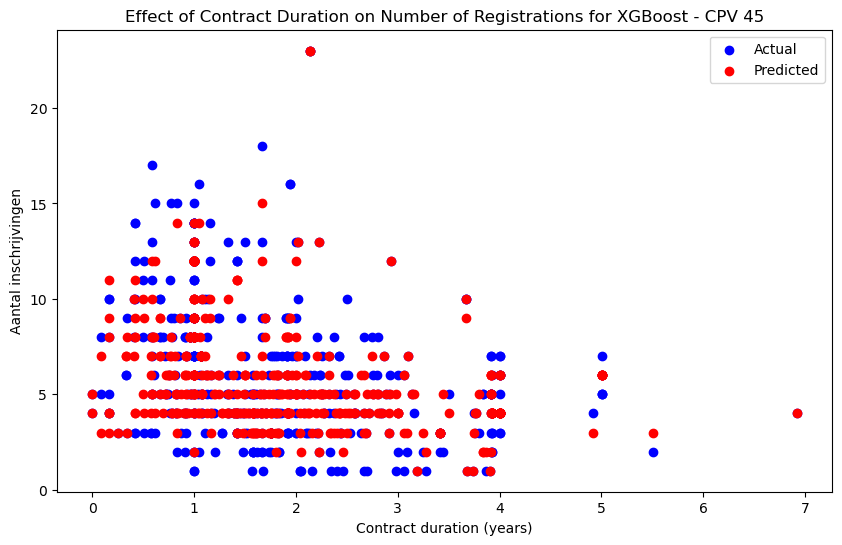

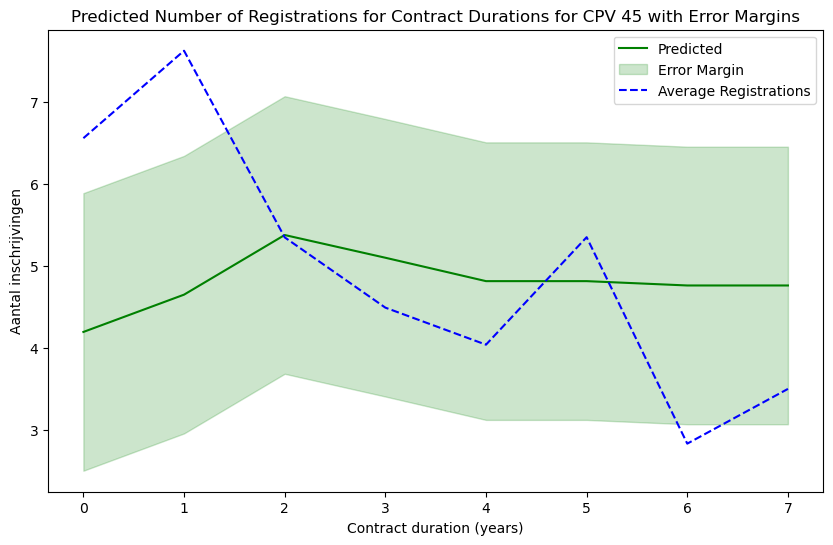

Number of data points in the training set: 2943
Number of data points in the testing set: 736
Fitting 5 folds for each of 27 candidates, totalling 135 fits
CPV Code: 50
Best parameters for XGBoost: {'model__learning_rate': 0.1, 'model__max_depth': 7, 'model__n_estimators': 300}
Best cross-validation score for XGBoost: -1.8227447042154616
Test Mean Absolute Error with best XGBoost model for 50: 0.8709239130434783
Test Root Mean Squared Error with best XGBoost model for 50: 1.4767215450920768
Test Mean Squared Error with best XGBoost model for 50: 2.1807065217391304
Test R-squared with best XGBoost model for 50: 0.8172940815457866


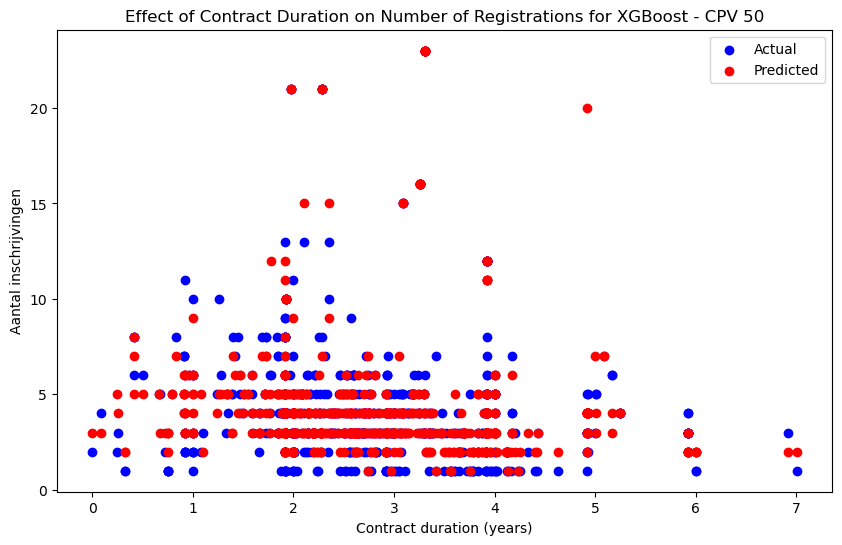

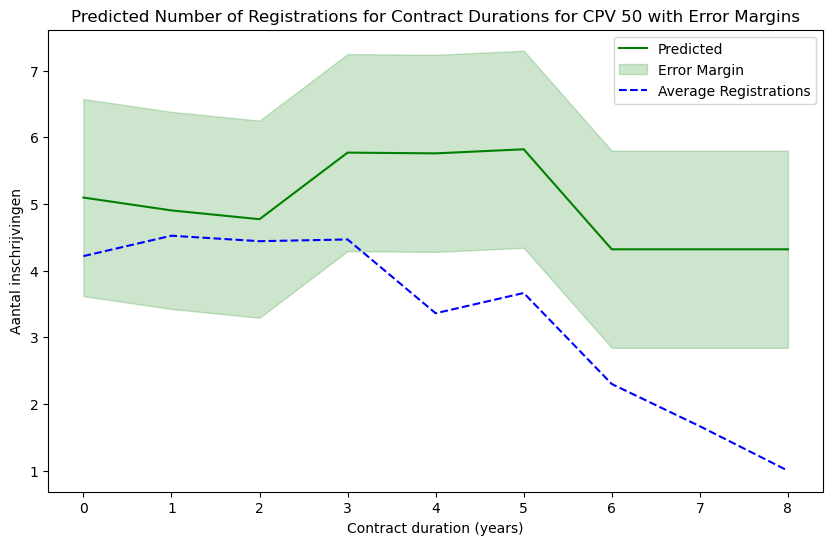

Number of data points in the training set: 5377
Number of data points in the testing set: 1345
Fitting 5 folds for each of 27 candidates, totalling 135 fits
CPV Code: 71
Best parameters for XGBoost: {'model__learning_rate': 0.1, 'model__max_depth': 7, 'model__n_estimators': 300}
Best cross-validation score for XGBoost: -4.750234718801186
Test Mean Absolute Error with best XGBoost model for 71: 1.250557620817844
Test Root Mean Squared Error with best XGBoost model for 71: 2.038295081716261
Test Mean Squared Error with best XGBoost model for 71: 4.154646840148699
Test R-squared with best XGBoost model for 71: 0.797428152092569


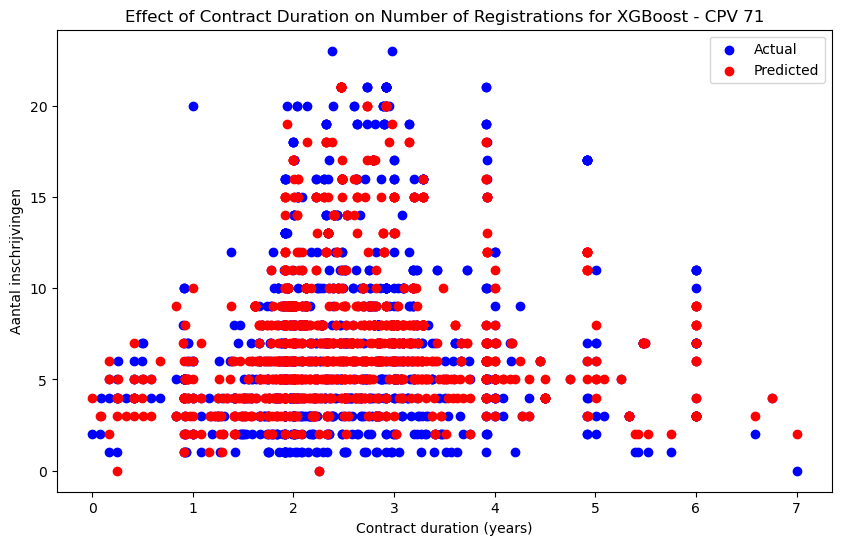

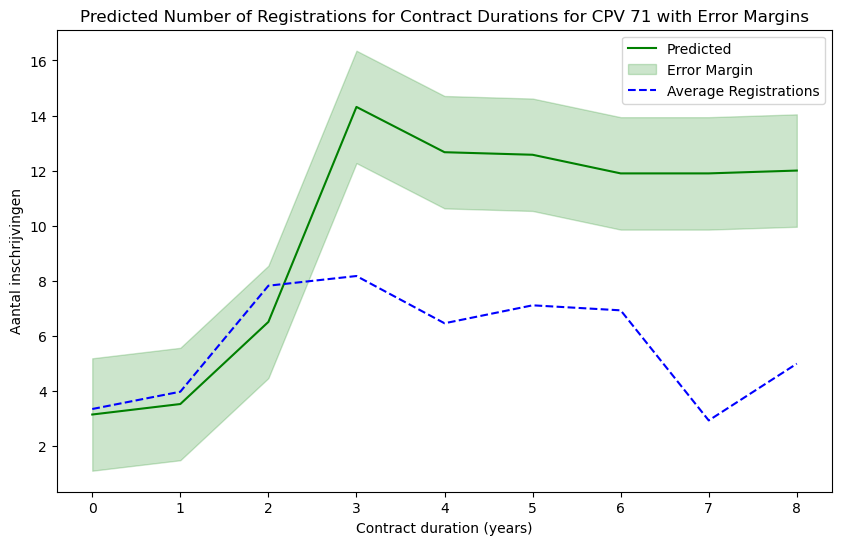

In [850]:
unique_cpv_codes = df_feature['Hoofd CPV code'].unique()

avg_registrations_dict = average_registrations_per_cpv(df_feature)

avg_registrations_df = pd.DataFrame(avg_registrations_dict, index=np.arange(0, 10))

for cpv_code in unique_cpv_codes:
    process_and_plot_for_cpv(cpv_code, df_feature, avg_registrations_df)

### GBM

Number of data points in the training set: 1005
Number of data points in the testing set: 252
Fitting 5 folds for each of 27 candidates, totalling 135 fits
CPV Code: 90
Best parameters for GBM: {'model__learning_rate': 0.1, 'model__max_depth': 7, 'model__n_estimators': 300}
Best cross-validation score for GBM: -1.5464828110695163
Test Mean Absolute Error with best GBM model for 90: 0.6547619047619048
Test Root Mean Squared Error with best GBM model for 90: 1.1598439960779618
Test Mean Squared Error with best GBM model for 90: 1.3452380952380953
Test R-squared with best GBM model for 90: 0.8267447614566517


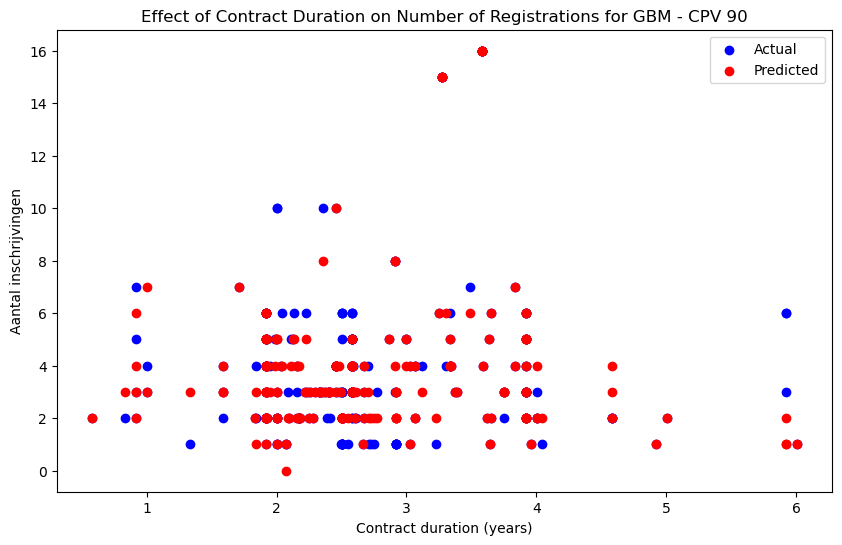

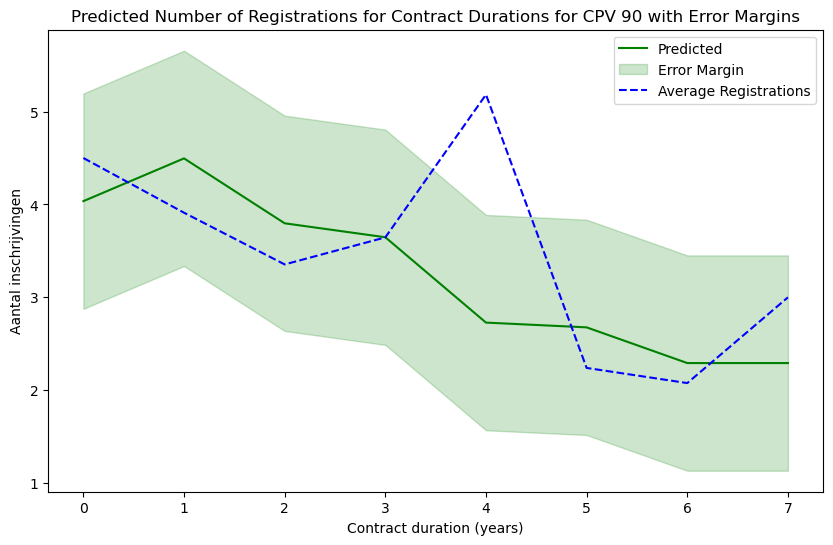

Number of data points in the training set: 1868
Number of data points in the testing set: 467
Fitting 5 folds for each of 27 candidates, totalling 135 fits
CPV Code: 45
Best parameters for GBM: {'model__learning_rate': 0.1, 'model__max_depth': 7, 'model__n_estimators': 300}
Best cross-validation score for GBM: -3.261724879330732
Test Mean Absolute Error with best GBM model for 45: 1.0428265524625269
Test Root Mean Squared Error with best GBM model for 45: 1.6353954265818396
Test Mean Squared Error with best GBM model for 45: 2.674518201284797
Test R-squared with best GBM model for 45: 0.7996688411914573


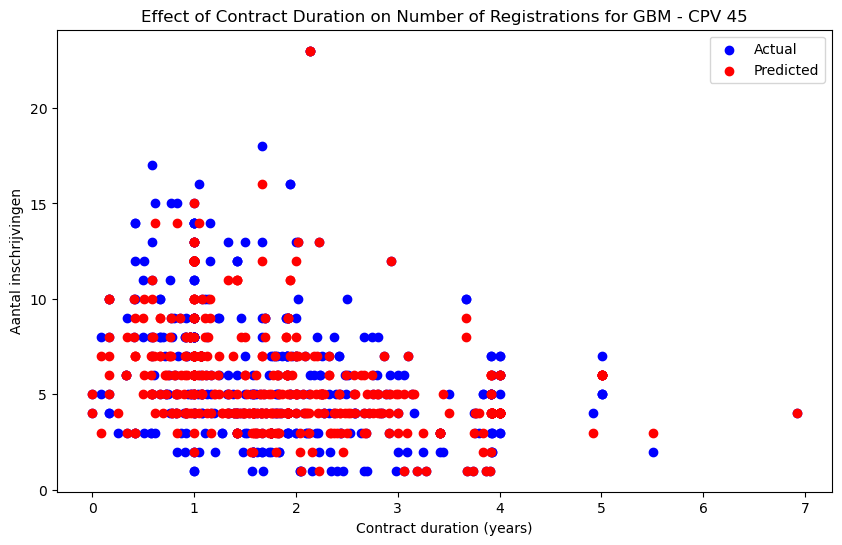

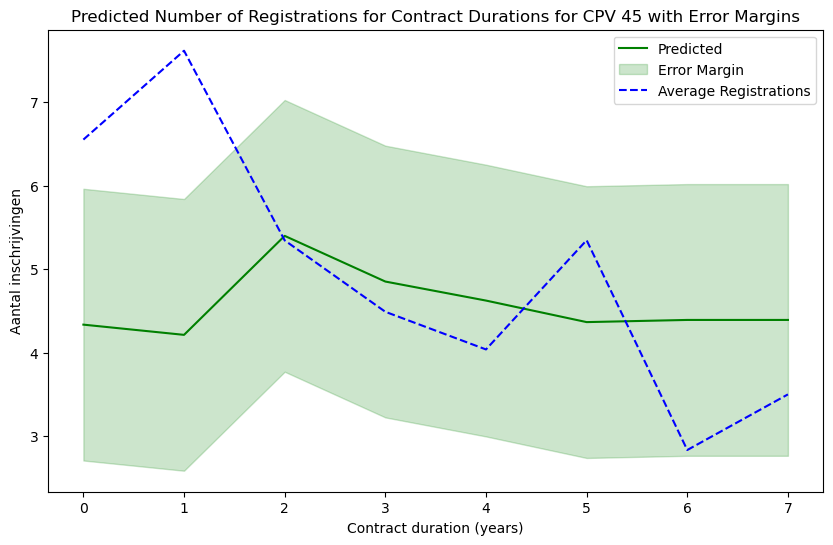

Number of data points in the training set: 2943
Number of data points in the testing set: 736
Fitting 5 folds for each of 27 candidates, totalling 135 fits
CPV Code: 50
Best parameters for GBM: {'model__learning_rate': 0.1, 'model__max_depth': 7, 'model__n_estimators': 300}
Best cross-validation score for GBM: -1.7997144271393115
Test Mean Absolute Error with best GBM model for 50: 0.8464673913043478
Test Root Mean Squared Error with best GBM model for 50: 1.4950098152942297
Test Mean Squared Error with best GBM model for 50: 2.235054347826087
Test R-squared with best GBM model for 50: 0.8127406630173327


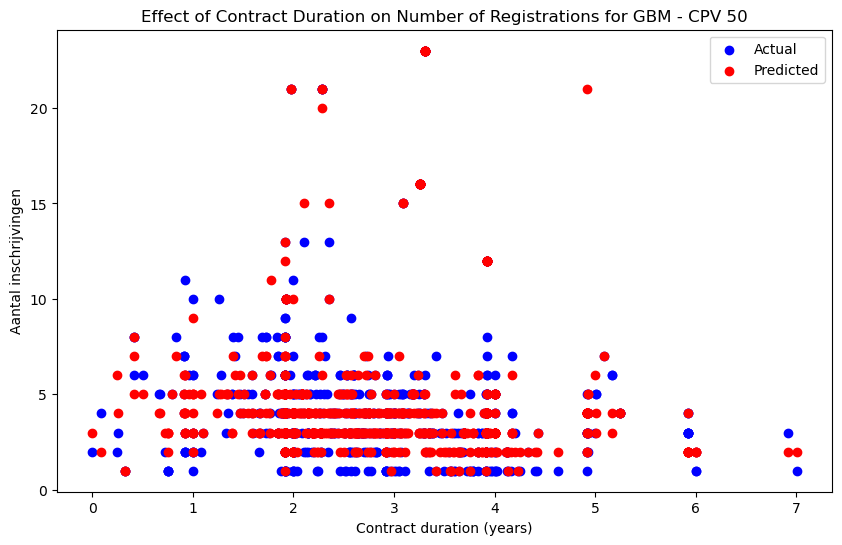

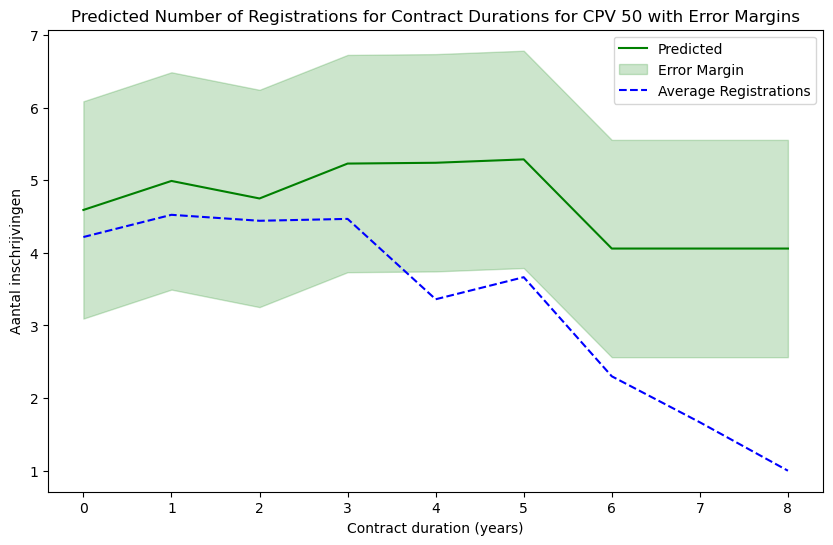

Number of data points in the training set: 5377
Number of data points in the testing set: 1345
Fitting 5 folds for each of 27 candidates, totalling 135 fits
CPV Code: 71
Best parameters for GBM: {'model__learning_rate': 0.1, 'model__max_depth': 7, 'model__n_estimators': 300}
Best cross-validation score for GBM: -4.365872947051587
Test Mean Absolute Error with best GBM model for 71: 1.1531598513011152
Test Root Mean Squared Error with best GBM model for 71: 1.8786612333626775
Test Mean Squared Error with best GBM model for 71: 3.529368029739777
Test R-squared with best GBM model for 71: 0.8279154327099901


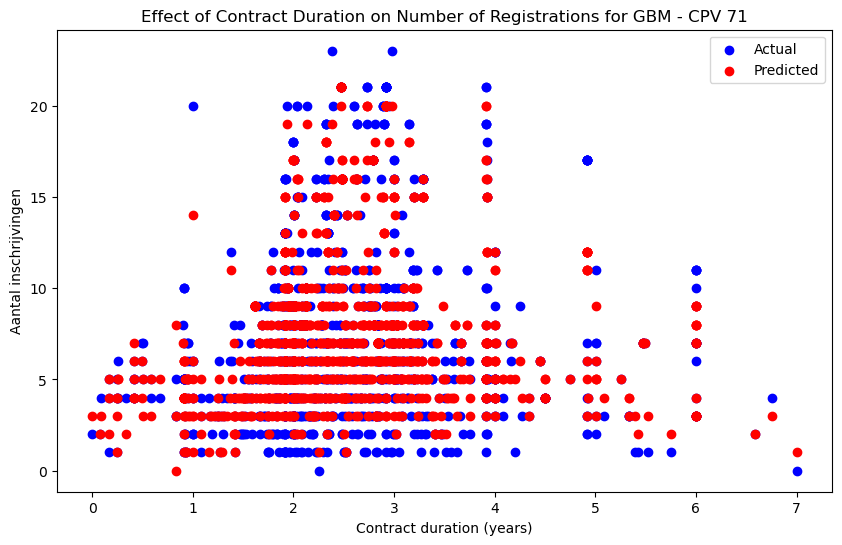

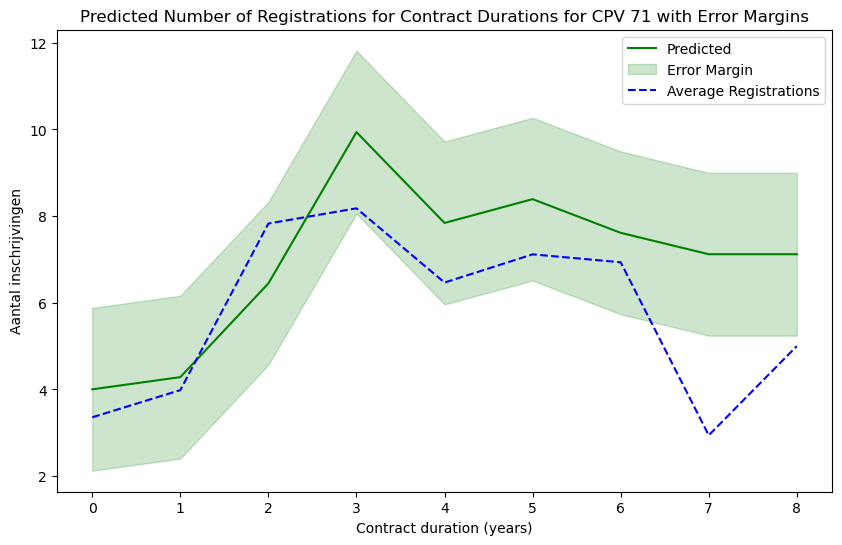

In [851]:
param_grid_gbm = {
    'model__n_estimators': [100, 200, 300],
    'model__learning_rate': [0.01, 0.05, 0.1],
    'model__max_depth': [3, 5, 7]
}

def process_and_plot_for_cpv_gbm(cpv_code, df, avg_registrations_df):
    try:
        # filter data based on needed CPV code 
        df_cpv = df[df['Hoofd CPV code'] == cpv_code]

        # determine average
        avg_registrations = df_cpv['Aantal inschrijvingen'].mean()

        # separate features and target
        X = df_cpv.drop('Aantal inschrijvingen', axis=1)
        y = df_cpv['Aantal inschrijvingen']

        # extract datetime features
        datetime_cols = X.select_dtypes(include=['datetime']).columns
        X = extract_datetime_features(X, datetime_cols)

        categorical_cols = X.select_dtypes(include=['object', 'category']).columns
        numeric_cols = X.select_dtypes(include=['number']).columns

        preprocessor = ColumnTransformer(
            transformers=[
                ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_cols)
            ],
            remainder='passthrough'  # passthrough numeric columns
        )

        # GBM
        model_gbm = GradientBoostingRegressor(random_state=0)

        # pipeline
        pipeline_gbm = Pipeline(steps=[('preprocessor', preprocessor),
                                       ('model', model_gbm)
                                      ])

        # split the data
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

        print(f"Number of data points in the training set: {len(X_train)}")
        print(f"Number of data points in the testing set: {len(X_test)}")

        # GridSearchCV for GBM
        grid_search_gbm = GridSearchCV(estimator=pipeline_gbm, param_grid=param_grid_gbm, cv=5, scoring='neg_mean_squared_error', verbose=1, n_jobs=-1)

        # GridSearchCV to data
        grid_search_gbm.fit(X_train, y_train)

        # get best parameters and best score for XGBoost
        best_params_gbm = grid_search_gbm.best_params_
        best_score_gbm = grid_search_gbm.best_score_

        print(f"CPV Code: {cpv_code}")
        print(f"Best parameters for GBM: {best_params_gbm}")
        print(f"Best cross-validation score for GBM: {best_score_gbm}")

        # use best estimator
        best_model_gbm = grid_search_gbm.best_estimator_
        y_pred_gbm = best_model_gbm.predict(X_test)
        
        # round to integer
        y_pred_gbm = np.round(y_pred_gbm).astype(int)

        # determine MSE, RMSE, MAE, and R2
        mse_gbm = mean_squared_error(y_test, y_pred_gbm)
        rmse_gbm = np.sqrt(mse_gbm)
        mae_gbm = mean_absolute_error(y_test, y_pred_gbm)
        r2_gbm = r2_score(y_test, y_pred_gbm)

        print(f"Test Mean Absolute Error with best GBM model for {cpv_code}: {mae_gbm}")
        print(f"Test Root Mean Squared Error with best GBM model for {cpv_code}: {rmse_gbm}")
        print(f"Test Mean Squared Error with best GBM model for {cpv_code}: {mse_gbm}")
        print(f"Test R-squared with best GBM model for {cpv_code}: {r2_gbm}")

        plt.figure(figsize=(10, 6))
        plt.scatter(X_test['Contract duration (years)'], y_test, color='blue', label='Actual')
        plt.scatter(X_test['Contract duration (years)'], y_pred_gbm, color='red', label='Predicted')
        plt.xlabel('Contract duration (years)')
        plt.ylabel('Aantal inschrijvingen')
        plt.title(f'Effect of Contract Duration on Number of Registrations for GBM - CPV {cpv_code}')
        plt.legend()
        plt.show()

        # determine maximum duration train
        max_contract_duration = X_train['Contract duration (years)'].max()

        # range of contract durations from 0 to the maximum
        contract_durations = np.arange(0, max_contract_duration + 1).reshape(-1, 1)
        contract_durations_df = pd.DataFrame(contract_durations, columns=['Contract duration (years)'])

        # prepare df for prediction
        template_row = X_train.iloc[0].copy()
        template_df = pd.DataFrame([template_row] * len(contract_durations_df), index=contract_durations_df.index)
        template_df['Contract duration (years)'] = contract_durations_df['Contract duration (years)']

        # generate predictions
        predicted_registrations_gbm = best_model_gbm.predict(template_df)

        # standard deviation of the errors 
        errors_gbm = y_test - y_pred_gbm
        std_error_gbm = errors_gbm.std()

        # upper and lower bounds 
        upper_bound_gbm = predicted_registrations_gbm + std_error_gbm
        lower_bound_gbm = predicted_registrations_gbm - std_error_gbm

        # get average registrations for  CPV 
        avg_registrations_per_duration = avg_registrations_df[cpv_code].values

        plt.figure(figsize=(10, 6))
        plt.plot(contract_durations, predicted_registrations_gbm, color='green', label='Predicted')
        plt.fill_between(contract_durations.flatten(), lower_bound_gbm, upper_bound_gbm, color='green', alpha=0.2, label='Error Margin')
        plt.plot(contract_durations, avg_registrations_per_duration[:len(contract_durations)], color='blue', linestyle='--', label='Average Registrations')
        plt.xlabel('Contract duration (years)')
        plt.ylabel('Aantal inschrijvingen')
        plt.title(f'Predicted Number of Registrations for Contract Durations for CPV {cpv_code} with Error Margins')
        plt.legend()
        plt.show()
    
    except Exception as e:
        print(f"An error occurred while processing CPV {cpv_code}: {e}")

for cpv_code in unique_cpv_codes:
    process_and_plot_for_cpv_gbm(cpv_code, df_feature, avg_registrations_df)

### Random Forest

Number of data points in the training set: 1005
Number of data points in the testing set: 252
Fitting 5 folds for each of 27 candidates, totalling 135 fits
CPV Code: 90
Best parameters for Random Forest: {'model__max_depth': 7, 'model__min_samples_split': 2, 'model__n_estimators': 200}
Best cross-validation score for Random Forest: -2.466160398839535
Test Mean Absolute Error with best Random Forest model for 90: 1.1772370483400096
Test Root Mean Squared Error with best Random Forest model for 90: 1.5538979679247455
Test Mean Squared Error with best Random Forest model for 90: 2.414598894720654
Test R-squared with best Random Forest model for 90: 0.6890201749621957


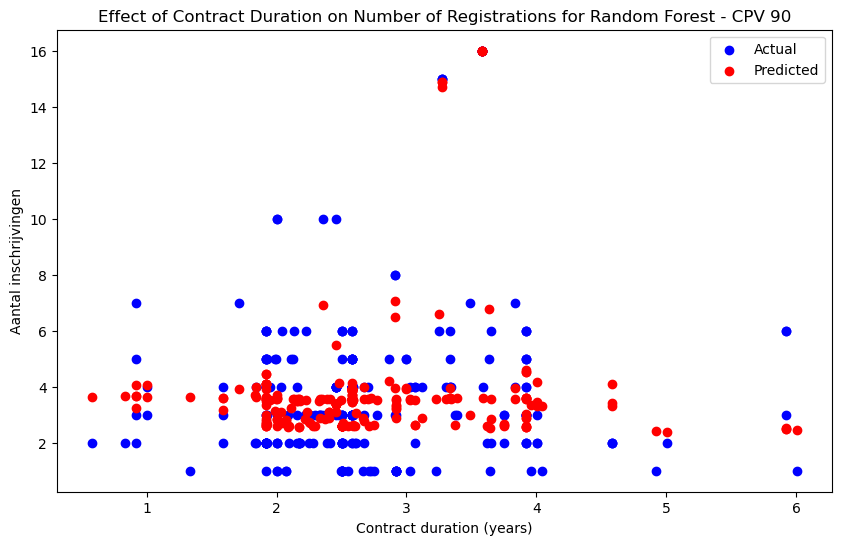

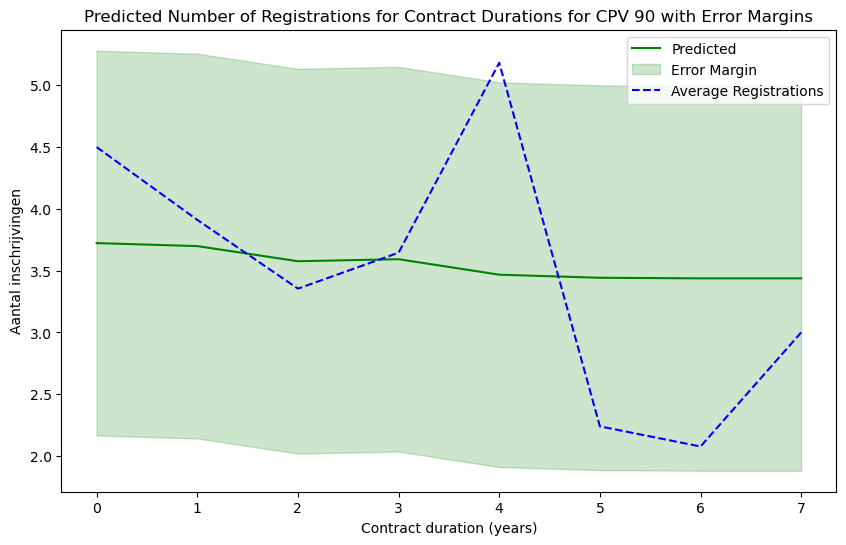

Number of data points in the training set: 1868
Number of data points in the testing set: 467
Fitting 5 folds for each of 27 candidates, totalling 135 fits
CPV Code: 45
Best parameters for Random Forest: {'model__max_depth': 7, 'model__min_samples_split': 2, 'model__n_estimators': 200}
Best cross-validation score for Random Forest: -5.709880025830837
Test Mean Absolute Error with best Random Forest model for 45: 1.6895334994689692
Test Root Mean Squared Error with best Random Forest model for 45: 2.4490950028360814
Test Mean Squared Error with best Random Forest model for 45: 5.998066332916666
Test R-squared with best Random Forest model for 45: 0.5507229756348369


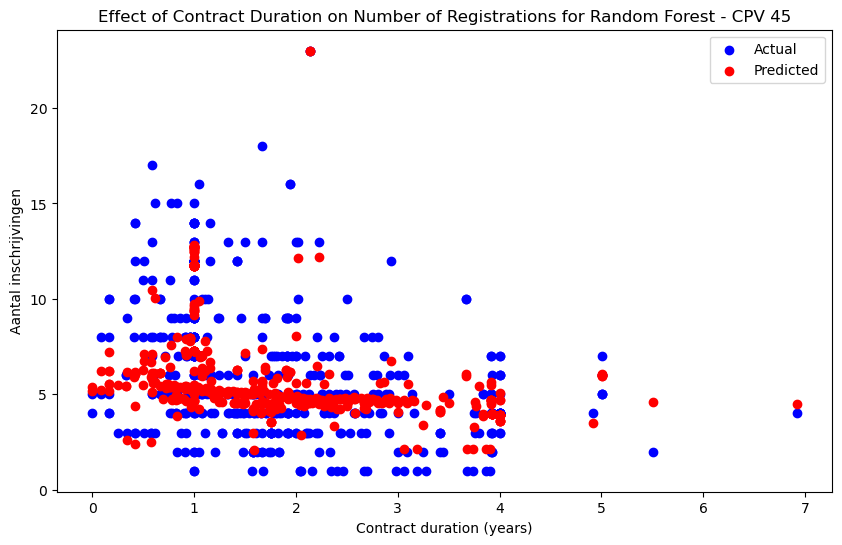

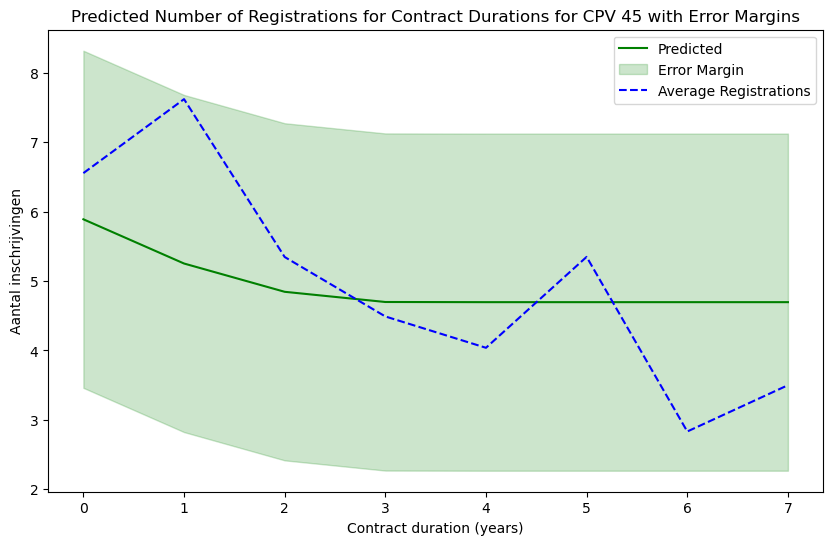

Number of data points in the training set: 2943
Number of data points in the testing set: 736
Fitting 5 folds for each of 27 candidates, totalling 135 fits
CPV Code: 50
Best parameters for Random Forest: {'model__max_depth': 7, 'model__min_samples_split': 2, 'model__n_estimators': 300}
Best cross-validation score for Random Forest: -3.077276775462988
Test Mean Absolute Error with best Random Forest model for 50: 1.2137562549157221
Test Root Mean Squared Error with best Random Forest model for 50: 1.7173994291446806
Test Mean Squared Error with best Random Forest model for 50: 2.949460799226475
Test R-squared with best Random Forest model for 50: 0.7528856180805076


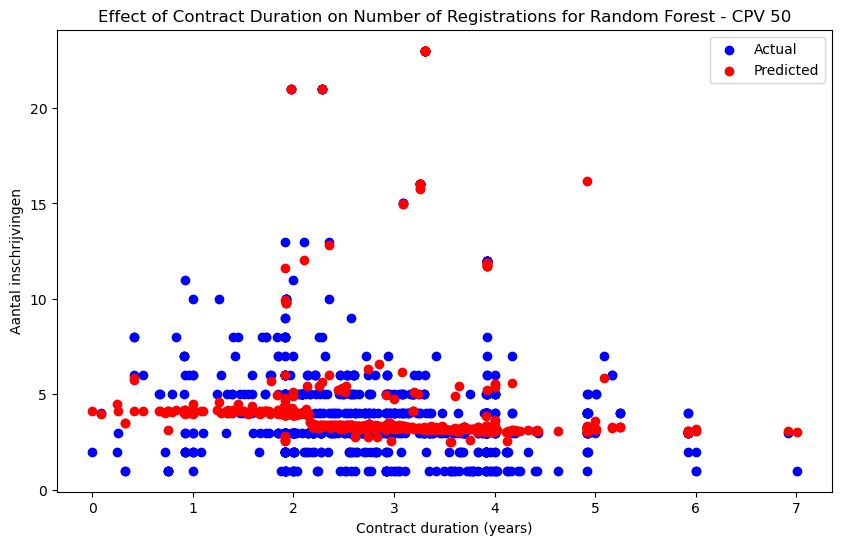

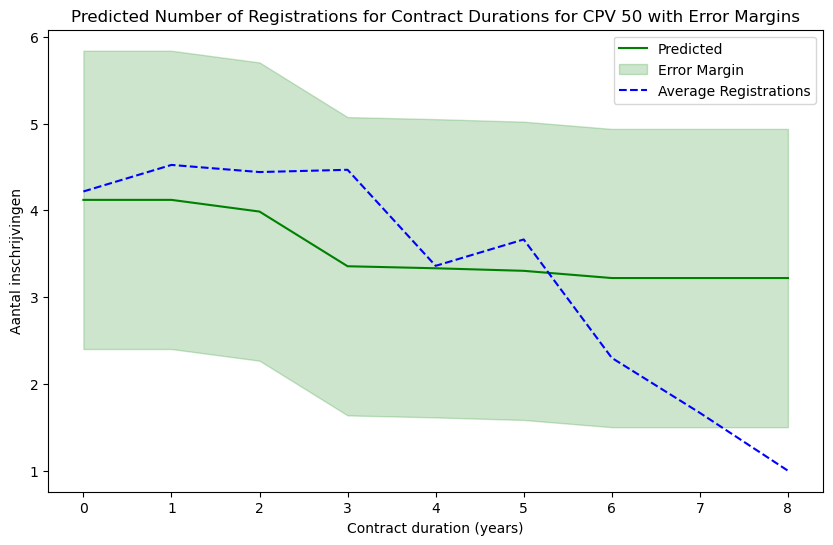

Number of data points in the training set: 5377
Number of data points in the testing set: 1345
Fitting 5 folds for each of 27 candidates, totalling 135 fits
CPV Code: 71
Best parameters for Random Forest: {'model__max_depth': 7, 'model__min_samples_split': 2, 'model__n_estimators': 300}
Best cross-validation score for Random Forest: -12.705899990239557
Test Mean Absolute Error with best Random Forest model for 71: 2.3781375004126617
Test Root Mean Squared Error with best Random Forest model for 71: 3.383794535113599
Test Mean Squared Error with best Random Forest model for 71: 11.45006545586466
Test R-squared with best Random Forest model for 71: 0.44171887351741057


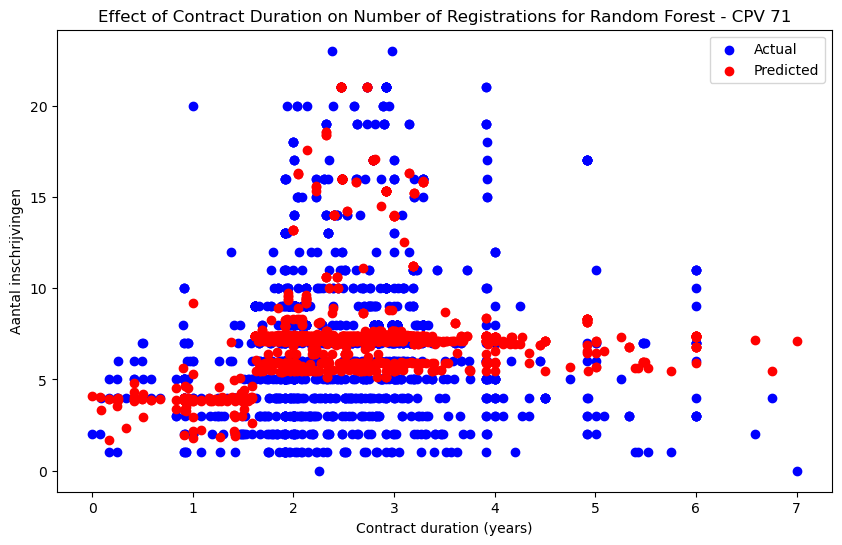

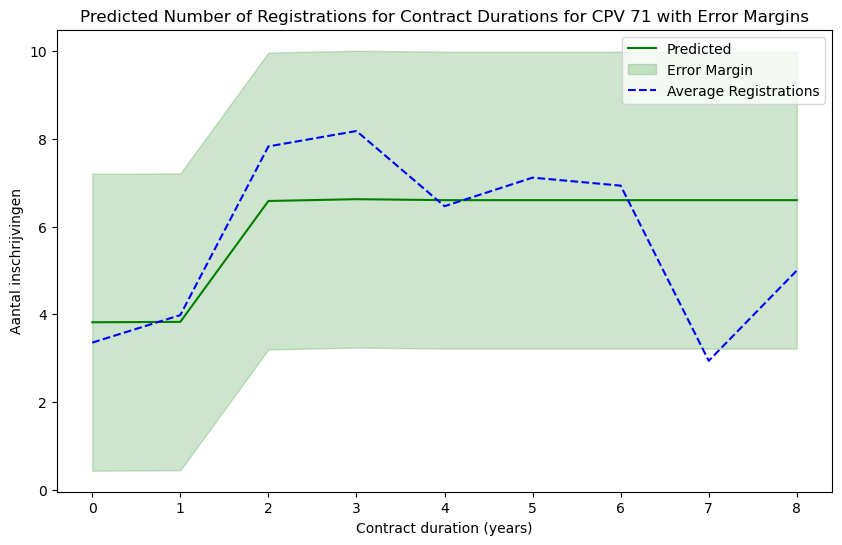

In [852]:
# define parameters
param_grid_rf = {
    'model__n_estimators': [100, 200, 300],
    'model__max_depth': [3, 5, 7],
    'model__min_samples_split': [2, 5, 10]
}

def process_and_plot_for_cpv_rf(cpv_code, df, avg_registrations_df):
    try:
        # filter data based on needed CPV code 
        df_cpv = df[df['Hoofd CPV code'] == cpv_code]

        # determine average
        avg_registrations = df_cpv['Aantal inschrijvingen'].mean()

        # separate features and target
        X = df_cpv.drop('Aantal inschrijvingen', axis=1)
        y = df_cpv['Aantal inschrijvingen']

        # extract datetime features
        datetime_cols = X.select_dtypes(include=['datetime']).columns
        X = extract_datetime_features(X, datetime_cols)

        categorical_cols = X.select_dtypes(include=['object', 'category']).columns
        numeric_cols = X.select_dtypes(include=['number']).columns

        preprocessor = ColumnTransformer(
            transformers=[
                ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_cols)
            ],
            remainder='passthrough'  # passthrough numeric columns
        )

        # Random Forest
        model_rf = RandomForestRegressor(random_state=0)

        # pipeline
        pipeline_rf = Pipeline(steps=[('preprocessor', preprocessor),
                                      ('model', model_rf)
                                     ])

        # split the data
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

        print(f"Number of data points in the training set: {len(X_train)}")
        print(f"Number of data points in the testing set: {len(X_test)}")

        # GridSearchCV for Random Forest
        grid_search_rf = GridSearchCV(estimator=pipeline_rf, param_grid=param_grid_rf, cv=5, scoring='neg_mean_squared_error', verbose=1, n_jobs=-1)

        # GridSearchCV to data
        grid_search_rf.fit(X_train, y_train)

        # get best parameters and best score for XGBoost
        best_params_rf = grid_search_rf.best_params_
        best_score_rf = grid_search_rf.best_score_

        print(f"CPV Code: {cpv_code}")
        print(f"Best parameters for Random Forest: {best_params_rf}")
        print(f"Best cross-validation score for Random Forest: {best_score_rf}")

        # use best estimator
        best_model_rf = grid_search_rf.best_estimator_
        y_pred_rf = best_model_rf.predict(X_test)
        
        # round to integer
        y_pred_xgb = np.round(y_pred_xgb).astype(int)

        # determine MSE, RMSE, MAE, and R2
        mse_rf = mean_squared_error(y_test, y_pred_rf)
        rmse_rf = np.sqrt(mse_rf)
        mae_rf = mean_absolute_error(y_test, y_pred_rf)
        r2_rf = r2_score(y_test, y_pred_rf)

        print(f"Test Mean Absolute Error with best Random Forest model for {cpv_code}: {mae_rf}")
        print(f"Test Root Mean Squared Error with best Random Forest model for {cpv_code}: {rmse_rf}")
        print(f"Test Mean Squared Error with best Random Forest model for {cpv_code}: {mse_rf}")
        print(f"Test R-squared with best Random Forest model for {cpv_code}: {r2_rf}")

        plt.figure(figsize=(10, 6))
        plt.scatter(X_test['Contract duration (years)'], y_test, color='blue', label='Actual')
        plt.scatter(X_test['Contract duration (years)'], y_pred_rf, color='red', label='Predicted')
        plt.xlabel('Contract duration (years)')
        plt.ylabel('Aantal inschrijvingen')
        plt.title(f'Effect of Contract Duration on Number of Registrations for Random Forest - CPV {cpv_code}')
        plt.legend()
        plt.show()

        # determine maximum duration train
        max_contract_duration = X_train['Contract duration (years)'].max()

        # range of contract durations from 0 to the maximum
        contract_durations = np.arange(0, max_contract_duration + 1).reshape(-1, 1)
        contract_durations_df = pd.DataFrame(contract_durations, columns=['Contract duration (years)'])

        # prepare df for prediction
        template_row = X_train.iloc[0].copy()
        template_df = pd.DataFrame([template_row] * len(contract_durations_df), index=contract_durations_df.index)
        template_df['Contract duration (years)'] = contract_durations_df['Contract duration (years)']

        # generate predictions
        predicted_registrations_rf = best_model_rf.predict(template_df)

        # standard deviation of the errors 
        errors_rf = y_test - y_pred_rf
        std_error_rf = errors_rf.std()

        # upper and lower bounds 
        upper_bound_rf = predicted_registrations_rf + std_error_rf
        lower_bound_rf = predicted_registrations_rf - std_error_rf

        # get average registrations for  CPV 
        avg_registrations_per_duration = avg_registrations_df[cpv_code].values

        plt.figure(figsize=(10, 6))
        plt.plot(contract_durations, predicted_registrations_rf, color='green', label='Predicted')
        plt.fill_between(contract_durations.flatten(), lower_bound_rf, upper_bound_rf, color='green', alpha=0.2, label='Error Margin')
        plt.plot(contract_durations, avg_registrations_per_duration[:len(contract_durations)], color='blue', linestyle='--', label='Average Registrations')
        plt.xlabel('Contract duration (years)')
        plt.ylabel('Aantal inschrijvingen')
        plt.title(f'Predicted Number of Registrations for Contract Durations for CPV {cpv_code} with Error Margins')
        plt.legend()
        plt.show()
    
    except Exception as e:
        print(f"An error occurred while processing CPV {cpv_code}: {e}")

for cpv_code in unique_cpv_codes:
    process_and_plot_for_cpv_rf(cpv_code, df_feature, avg_registrations_df)
